# Exoplanets and their Star Systems

### Introduction:
Exoplanets are planets that exist outside the solar system. They generally orbit other stars or star systems such as a binary or even a triple star system. (Some exoplanets also exist as rogue planets that drift in space without orbiting any planet or star). Exoplanets are of immense interest to the Astrophysics Community as they offer potential for innumerable tantalizing possibilities including space exploration, planet colonization, and even alien life. On the other hand, in many cases, these planets are still in the early stages of their formation or their star systems (their solar systems) have just formed from gas clouds called stellar nebulae, providing an excellent opportunity to study how planets and star systems are formed, what forces play a crucial role in planet formation, how gravity behaves on such a massive scale in a chaotic system such as the gas cloud, which particles and atoms constitute the gas cloud, and which elements lead to life, if any.

Another subject of particular interest is the host star(s) itself. The host stars of exoplanets, like other stars in the universe, are characterized by a few important parameters such as stellar mass (in multiples of the Sun's mass, a unit called Solar Mass), Stellar Radius (measured in Solar Radii), Star Surface Temperature (in K), and Luminosity (measured in multiples of Solar Luminosity). These parameters tend to influence one another. For example, mass, temperature, and luminosity generally have a strong positive correlation with each other. 

Stars are typically modeled as black bodies (for convenience of calculation) which implies that their surface temperature is related to their color (The temperature of the black body is related to the frequency of electromagnetic radiation emitted by the black body by the Theory of Black Body Radiation and Planck's Quantum Theory). Star colors typically range from red (the coolest stars) to blue/white (the hottest stars). By plotting Luminosity vs Star Surface temperature as a scatterplot of all cataloged stars in the universe, they can be classified into different Spectral Classes. Such a plot is called the Hertzsprung-Russell Diagram, as shown here:


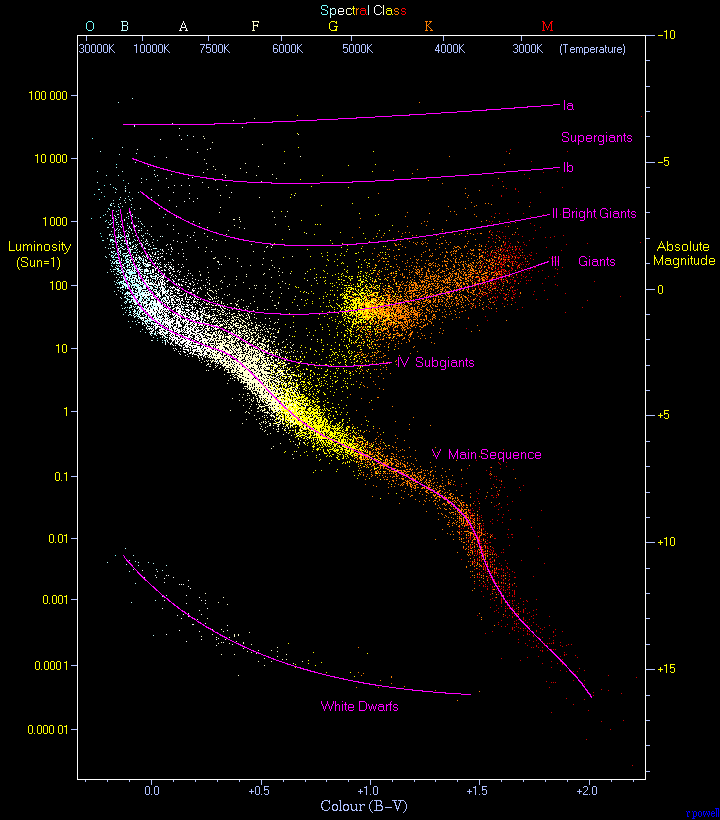

Stars can broadly be classified into one of 7 Spectral Types as per the Morgan-Keenan (MK) System: 

1. O (Typically the Hottest, Brightest Stars, and most Massive stars)
2. B
3. A
4. F
5. G
6. K
7. M (The coolest, stars with the least luminosity and mass)

As an example, the Sun is of Spectral Type G. 


### The Data:
This database is a list of confirmed exoplanets orbiting other stars and has been compiled from the findings of several telescopes such as the Kepler Space Telescope launched by NASA to detect Exoplanets. The database has been imported from the NASA(-Caltech) Exoplanet Archive. It includes many of the parameters mentioned above to characterize exoplanets and their host stars. These include parameters such as the star mass, luminosity, temperature, planet radius, planet mass, and so forth.

1. planet_name
2. hoststar_name
3. star_count
4. planet_count
5. moon_count
6. circumbinary_flag
7. discovery_method
8. discovery_year
9. discovery_facility
10. controversial_flag
11. orbital_period
12. orbit_semi_major_axis
13. planet_radius_earth
14. planet_radius_jupiter
15. planet_mass_earth
16. planet_mass_jupiter
17. planet_density
18. planet_orbital_eccentricity
19. planet_insolation_flux
20. planet_equilibrium_temperature
21. spectral_type
22. stellar_effective_temperature
23. stellar_radius
24. stellar_mass
25. stellar_metallicity
26. stellar_metallicity_ratio
27. stellar_luminosity
28. stellar_surface_gravity
29. stellar_age
30. stellar_density
31. stellar_rotational_velocity
32. stellar_rotational_period

These variables span a wide range of planet and star attributes that could be used to draw insights from the data. The interplay of these two types of data, viz. the exoplanets and their host stars, creates myriads of possibilities and provides an opportunity to test hypotheses that could guide the exploratory data analysis (EDA). The two key hypotheses (derived from domain knowledge) to be tested are:

1.	There should be very few or no O-, B-, or A-type stars in this dataset.

2.	Star Mass and Luminosity should be strongly correlated.


With more than 5000 entries, there is enough data to test these hypotheses. This project also aims to answer the following research questions that guide the flow of the project: 

1.	To what extent are the stars that host exoplanets a representative sample of all stars in the universe? 

2.	How to study planet formation? What do the mass, radius, and distance of a planet from its host star(s) depend on? Can these be predicted?  


In [1]:
import numpy as np
import pandas as pd

We begin by importing the necessary libraries and the dataset from the downloaded .csv file. This is followed by understanding the data types of various columns and modifying some of them to make them more appropriate with respect to the context of the domain. The intial analysis also includes brief summary statistics of the various numeric columns through the .describe() method.



In [2]:
df = pd.read_csv("Exoplanets.csv")
df.head()

,planet_name,hoststar_name,star_count,planet_count,moon_count,circumbinary_flag,discovery_method,discovery_year,discovery_facility,controversial_flag,...,stellar_radius,stellar_mass,stellar_metallicity,stellar_metallicity_ratio,stellar_luminosity,stellar_surface_gravity,stellar_age,stellar_density,stellar_rotational_velocity,stellar_rotational_period
0,11 Com b,11 Com,2,1,0,0,Radial Velocity,2007,Xinglong Station,0,...,19.00,2.70,-0.350,[Fe/H],2.243,2.31,NaN,NaN,1.2,NaN
1,11 UMi b,11 UMi,1,1,0,0,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,...,29.79,2.78,-0.020,[Fe/H],2.430,1.93,1.56,NaN,1.5,NaN
2,14 And b,14 And,1,1,0,0,Radial Velocity,2008,Okayama Astrophysical Observatory,0,...,11.00,2.20,-0.240,[Fe/H],1.763,2.63,4.50,NaN,2.6,NaN
3,14 Her b,14 Her,1,2,0,0,Radial Velocity,2002,W. M. Keck Observatory,0,...,0.93,0.91,0.405,[Fe/H],-0.153,4.45,3.90,1.27393,1.0,NaN
4,16 Cyg B b,16 Cyg B,3,1,0,0,Radial Velocity,1996,Multiple Observatories,0,...,1.13,1.08,0.060,[Fe/H],0.097,4.36,7.40,1.01103,2.7,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 32 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   planet_name                     5322 non-null   object 
 1   hoststar_name                   5322 non-null   object 
 2   star_count                      5322 non-null   int64  
 3   planet_count                    5322 non-null   int64  
 4   moon_count                      5322 non-null   int64  
 5   circumbinary_flag               5322 non-null   int64  
 6   discovery_method                5322 non-null   object 
 7   discovery_year                  5322 non-null   int64  
 8   discovery_facility              5322 non-null   object 
 9   controversial_flag              5322 non-null   int64  
 10  orbital_period                  5101 non-null   float64
 11  orbit_semi_major_axis           5034 non-null   float64
 12  planet_radius_earth             53

In [4]:
df.columns

Index(['planet_name', 'hoststar_name', 'star_count', 'planet_count',
       'moon_count', 'circumbinary_flag', 'discovery_method', 'discovery_year',
       'discovery_facility', 'controversial_flag', 'orbital_period',
       'orbit_semi_major_axis', 'planet_radius_earth', 'planet_radius_jupiter',
       'planet_mass_earth', 'planet_mass_jupiter', 'planet_density',
       'planet_orbital_eccentricity', 'planet_insolation_flux',
       'planet_equilibrium_temperature', 'spectral_type',
       'stellar_effective_temperature', 'stellar_radius', 'stellar_mass',
       'stellar_metallicity', 'stellar_metallicity_ratio',
       'stellar_luminosity', 'stellar_surface_gravity', 'stellar_age',
       'stellar_density', 'stellar_rotational_velocity',
       'stellar_rotational_period'],
      dtype='object')

Below is to separate categorical data from non-categorical data

---



In [5]:
cat_variables = []
for i in df:
    if "lim" in i:
        cat_variables.append(i)
    if df[i].nunique() == 2 and "lim" not in i:
        cat_variables.append(i)

cat_variables += ['star_count','planet_count','moon_count','discovery_method', 'discovery_year', 'discovery_facility', 
                  'controversial_flag', 'spectral_type', 'stellar_metallicity_ratio']
df_cat = df[cat_variables].astype("category")
df_cat.head() # dataframe containing categorical variables

,circumbinary_flag,controversial_flag,star_count,planet_count,moon_count,discovery_method,discovery_year,discovery_facility,controversial_flag,spectral_type,stellar_metallicity_ratio
0,0,0,2,1,0,Radial Velocity,2007,Xinglong Station,0,G8 III,[Fe/H]
1,0,0,1,1,0,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,K4 III,[Fe/H]
2,0,0,1,1,0,Radial Velocity,2008,Okayama Astrophysical Observatory,0,K0 III,[Fe/H]
3,0,0,1,2,0,Radial Velocity,2002,W. M. Keck Observatory,0,K0 V,[Fe/H]
4,0,0,3,1,0,Radial Velocity,1996,Multiple Observatories,0,G3 V,[Fe/H]


In [6]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   circumbinary_flag          5322 non-null   category
 1   controversial_flag         5322 non-null   category
 2   star_count                 5322 non-null   category
 3   planet_count               5322 non-null   category
 4   moon_count                 5322 non-null   category
 5   discovery_method           5322 non-null   category
 6   discovery_year             5322 non-null   category
 7   discovery_facility         5322 non-null   category
 8   controversial_flag         5322 non-null   category
 9   spectral_type              1891 non-null   category
 10  stellar_metallicity_ratio  4903 non-null   category
dtypes: category(11)
memory usage: 78.2 KB


Spectal Classification from the Hertzsprung-Russell Diagram can be more complex than simply one of the O B A F G K M types. The first alphabet is followed by other alphanumeric characters which describe other details of stars (based on their radii, lifecycles, etc.). Some of these details are unnecessary for the current analysis due to which a new column for Star Type is created that contains only the first alphabet of the spectral classification.

In [7]:
# Make a new column for star-type

df_cat['star_type'] = df_cat['spectral_type'].str[0]
df_cat = df_cat.drop('spectral_type', axis =1)
df_cat

,circumbinary_flag,controversial_flag,star_count,planet_count,moon_count,discovery_method,discovery_year,discovery_facility,controversial_flag,stellar_metallicity_ratio,star_type
0,0,0,2,1,0,Radial Velocity,2007,Xinglong Station,0,[Fe/H],G
1,0,0,1,1,0,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,[Fe/H],K
2,0,0,1,1,0,Radial Velocity,2008,Okayama Astrophysical Observatory,0,[Fe/H],K
3,0,0,1,2,0,Radial Velocity,2002,W. M. Keck Observatory,0,[Fe/H],K
4,0,0,3,1,0,Radial Velocity,1996,Multiple Observatories,0,[Fe/H],G
...,...,...,...,...,...,...,...,...,...,...,...
5317,0,0,2,3,0,Radial Velocity,1996,Lick Observatory,0,[M/H],F
5318,0,0,2,3,0,Radial Velocity,1999,Multiple Observatories,0,[M/H],F
5319,0,0,2,3,0,Radial Velocity,1999,Multiple Observatories,0,[M/H],F
5320,0,0,1,1,0,Radial Velocity,2021,Okayama Astrophysical Observatory,0,[Fe/H],G


In [8]:
df_cat["star_type"].unique()

array(['G', 'K', 'M', nan, 'F', 'L', 'A', 'B', 'm', 'W', 's', 'D', 'T'],
      dtype=object)

In [9]:
# Create a new dataframe for startype

unique_values = ['O','B','A','F','G','K','M']
star_type = df_cat[df_cat['star_type'].isin(unique_values)]

star_type = star_type[['star_type']].astype('category')
star_type.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1884 entries, 0 to 5321
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   star_type  1884 non-null   category
dtypes: category(1)
memory usage: 16.8 KB


Star type is column name given to the first alphabet of spectral type.

Some of the stars have nan spectral type due to ....

One of the values in the column is L, W, s, D, t which is not part of the common spectral type. This may be due to ....

In [10]:
num_variables = [var for var in df if var not in cat_variables]
df_num = df[num_variables]
df_num = df_num.drop(['planet_name', 'hoststar_name'], axis=1)
df_num # dataframe without categorical variables

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter,planet_density,planet_orbital_eccentricity,planet_insolation_flux,planet_equilibrium_temperature,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_metallicity,stellar_luminosity,stellar_surface_gravity,stellar_age,stellar_density,stellar_rotational_velocity,stellar_rotational_period
0,326.030000,1.290000,12.1,1.08,6165.60000,19.40000,19.100,0.231000,NaN,NaN,4742.00,19.00,2.70,-0.350,2.243,2.31,NaN,NaN,1.20,NaN
1,516.219970,1.530000,12.3,1.09,4684.81420,14.74000,13.800,0.080000,NaN,NaN,4213.00,29.79,2.78,-0.020,2.430,1.93,1.56,NaN,1.50,NaN
2,185.840000,0.830000,12.9,1.15,1525.50000,4.80000,3.900,0.000000,NaN,NaN,4813.00,11.00,2.20,-0.240,1.763,2.63,4.50,NaN,2.60,NaN
3,1765.038901,2.773069,12.6,1.12,2586.74645,8.13881,7.110,0.372689,NaN,NaN,5338.00,0.93,0.91,0.405,-0.153,4.45,3.90,1.27393,1.00,NaN
4,798.500000,1.660000,13.5,1.20,565.73740,1.78000,1.260,0.680000,NaN,NaN,5750.00,1.13,1.08,0.060,0.097,4.36,7.40,1.01103,2.70,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5317,4.617033,0.059222,14.0,1.25,218.53100,0.68760,0.438,0.021500,NaN,NaN,6156.77,1.56,1.30,0.101,0.525,4.13,5.00,0.36993,9.20,12.0
5318,241.258000,0.827774,12.3,1.10,4443.24113,13.98000,13.100,0.259600,NaN,NaN,6156.77,1.56,1.30,0.101,0.525,4.13,5.00,0.36993,9.60,12.0
5319,1276.460000,2.513290,12.5,1.11,3257.74117,10.25000,9.170,0.298700,NaN,NaN,6156.77,1.56,1.30,0.101,0.525,4.13,5.00,0.36993,9.60,12.0
5320,385.200000,1.180000,14.2,1.27,162.09249,0.51000,0.311,0.320000,NaN,NaN,4836.00,11.22,1.48,-0.200,1.800,2.46,NaN,NaN,1.78,NaN


In [11]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   orbital_period                  5101 non-null   float64
 1   orbit_semi_major_axis           5034 non-null   float64
 2   planet_radius_earth             5305 non-null   float64
 3   planet_radius_jupiter           5304 non-null   float64
 4   planet_mass_earth               5298 non-null   float64
 5   planet_mass_jupiter             5298 non-null   float64
 6   planet_density                  5205 non-null   float64
 7   planet_orbital_eccentricity     4605 non-null   float64
 8   planet_insolation_flux          3678 non-null   float64
 9   planet_equilibrium_temperature  3926 non-null   float64
 10  stellar_effective_temperature   5133 non-null   float64
 11  stellar_radius                  5113 non-null   float64
 12  stellar_mass                    53

# Exploratory Analysis

## Univariate Analysis and Summary Statistics (Numerical Variables)

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

In [13]:
df_num.head()

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter,planet_density,planet_orbital_eccentricity,planet_insolation_flux,planet_equilibrium_temperature,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_metallicity,stellar_luminosity,stellar_surface_gravity,stellar_age,stellar_density,stellar_rotational_velocity,stellar_rotational_period
0,326.030000,1.290000,12.1,1.08,6165.60000,19.40000,19.10,0.231000,NaN,NaN,4742.0,19.00,2.70,-0.350,2.243,2.31,NaN,NaN,1.2,NaN
1,516.219970,1.530000,12.3,1.09,4684.81420,14.74000,13.80,0.080000,NaN,NaN,4213.0,29.79,2.78,-0.020,2.430,1.93,1.56,NaN,1.5,NaN
2,185.840000,0.830000,12.9,1.15,1525.50000,4.80000,3.90,0.000000,NaN,NaN,4813.0,11.00,2.20,-0.240,1.763,2.63,4.50,NaN,2.6,NaN
3,1765.038901,2.773069,12.6,1.12,2586.74645,8.13881,7.11,0.372689,NaN,NaN,5338.0,0.93,0.91,0.405,-0.153,4.45,3.90,1.27393,1.0,NaN
4,798.500000,1.660000,13.5,1.20,565.73740,1.78000,1.26,0.680000,NaN,NaN,5750.0,1.13,1.08,0.060,0.097,4.36,7.40,1.01103,2.7,NaN


In [14]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   orbital_period                  5101 non-null   float64
 1   orbit_semi_major_axis           5034 non-null   float64
 2   planet_radius_earth             5305 non-null   float64
 3   planet_radius_jupiter           5304 non-null   float64
 4   planet_mass_earth               5298 non-null   float64
 5   planet_mass_jupiter             5298 non-null   float64
 6   planet_density                  5205 non-null   float64
 7   planet_orbital_eccentricity     4605 non-null   float64
 8   planet_insolation_flux          3678 non-null   float64
 9   planet_equilibrium_temperature  3926 non-null   float64
 10  stellar_effective_temperature   5133 non-null   float64
 11  stellar_radius                  5113 non-null   float64
 12  stellar_mass                    53

In [15]:
df_num.describe()

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter,planet_density,planet_orbital_eccentricity,planet_insolation_flux,planet_equilibrium_temperature,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_metallicity,stellar_luminosity,stellar_surface_gravity,stellar_age,stellar_density,stellar_rotational_velocity,stellar_rotational_period
count,5.101000e+03,5034.000000,5305.000000,5304.000000,5298.000000,5298.000000,5205.000000,4605.000000,3678.000000,3926.000000,5133.000000,5113.000000,5318.000000,4927.000000,5118.000000,5105.000000,4181.000000,4858.000000,1854.000000,562.000000
mean,8.267705e+04,6.884469,5.683333,0.507181,459.827424,1.447200,4.257565,0.073180,426.731528,916.266938,5446.527960,1.539871,0.958947,0.011038,-0.105842,4.374082,4.349744,3.344375,5.726680,38.963149
std,5.630630e+06,137.666794,5.335803,0.476083,3735.064840,11.754661,22.033197,0.149046,1259.525378,462.146458,1806.120872,4.061370,0.450336,0.182839,0.754491,0.436253,3.055806,8.301410,14.676583,86.152727
min,9.070629e-02,0.004400,0.296000,0.026000,0.020000,0.000060,0.030000,-0.518659,0.020000,34.000000,575.000000,0.010000,0.010000,-1.000000,-6.090000,0.900000,0.000000,0.004010,0.000000,-35.730000
25%,4.445880e+00,0.052900,1.770000,0.158000,4.000000,0.012592,1.410000,0.000000,24.872500,574.000000,4955.000000,0.780000,0.790000,-0.080000,-0.438000,4.290000,2.353000,0.719483,1.670000,12.200000
50%,1.155530e+01,0.102800,2.760000,0.246000,8.590000,0.027030,2.590000,0.000000,100.370000,825.000000,5564.000000,0.960000,0.950000,0.020000,-0.058000,4.450000,3.980000,1.650000,2.515000,23.410000
75%,4.100801e+01,0.289925,11.893000,1.060000,162.093300,0.510000,4.610000,0.080000,375.212500,1159.000000,5905.000000,1.250000,1.090000,0.120000,0.323000,4.570000,5.250000,3.006660,4.500000,40.000000
max,4.020000e+08,7506.000000,77.342000,6.900000,239000.000000,752.000000,1290.000000,0.950000,44900.000000,4050.000000,57000.000000,109.460000,10.940000,1.000000,3.800000,7.920000,14.900000,187.952400,299.000000,1531.000000


In [16]:
df_num.skew()

orbital_period                    71.342011
orbit_semi_major_axis             39.602975
planet_radius_earth                1.382298
planet_radius_jupiter              1.381976
planet_mass_earth                 50.836839
planet_mass_jupiter               50.810684
planet_density                    45.053594
planet_orbital_eccentricity        2.728337
planet_insolation_flux            16.753345
planet_equilibrium_temperature     1.102048
stellar_effective_temperature     15.499529
stellar_radius                    13.703931
stellar_mass                       8.363799
stellar_metallicity               -0.592278
stellar_luminosity                -0.387520
stellar_surface_gravity           -3.042209
stellar_age                        1.203891
stellar_density                   10.270261
stellar_rotational_velocity        9.319210
stellar_rotational_period         11.518795
dtype: float64

### Normalization

We do a normalization to make our diagram more visible

In [17]:
df_num_norm = df_num.copy()

In [18]:
# If the range is more than 100, we use logarithmic normalization
for i in df_num_norm:
    min_val = df_num[i].min()
    max_val = df_num[i].max()
    if i!='stellar_luminosity':
        if max_val - min_val < 100:
            df_num_norm[i] = (df_num[i]-df_num[i].min())/(df_num[i].max()-df_num[i].min())
        else:
            df_num_norm[i] = df_num_norm[i].replace(0, 1) # Change value 0 to 1 before normalization so we won't get infinity
            df_num_norm[i] = np.log10(df_num_norm[i])

df_num_norm.describe()

C:\Users\alexa\anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter,planet_density,planet_orbital_eccentricity,planet_insolation_flux,planet_equilibrium_temperature,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_metallicity,stellar_luminosity,stellar_surface_gravity,stellar_age,stellar_density,stellar_rotational_velocity,stellar_rotational_period
count,5101.000000,5034.000000,5305.000000,5304.000000,5298.000000,5298.000000,5205.000000,4605.000000,3678.000000,3926.000000,5133.000000,5113.000000,5318.000000,4927.000000,5118.000000,5105.000000,4181.000000,4858.000000,1854.000000,561.000000
mean,1.273349,-0.797214,0.069924,0.070000,1.336697,-1.165484,0.363846,0.402979,1.950952,2.906914,3.725754,0.011169,0.086820,0.505519,-0.105842,0.494884,0.291929,0.173064,0.446818,1.322629
std,0.913151,0.714877,0.069255,0.069258,1.042583,1.042619,0.439325,0.101484,0.861181,0.225718,0.087256,0.284109,0.041202,0.091419,0.754491,0.062144,0.205088,0.535732,0.441406,0.483849
min,-1.042363,-2.356547,0.000000,0.000000,-1.698970,-4.221849,-1.522879,0.000000,-1.698970,1.531479,2.759668,-2.000000,0.000000,0.000000,-6.090000,0.000000,0.000000,-2.396856,-1.004365,-0.431798
25%,0.647958,-1.276544,0.019131,0.019203,0.602060,-1.899888,0.149219,0.353151,1.395719,2.758912,3.695044,-0.107905,0.071363,0.460000,-0.438000,0.482906,0.157919,-0.142980,0.222716,1.086360
50%,1.062781,-0.988007,0.031981,0.032005,0.933993,-1.568154,0.413300,0.353151,2.001604,2.916454,3.745387,-0.017729,0.086002,0.510000,-0.058000,0.505698,0.267114,0.217484,0.400537,1.371437
75%,1.612869,-0.537714,0.150520,0.150422,2.209765,-0.292430,0.663701,0.407623,2.574277,3.064083,3.771220,0.096910,0.098811,0.560000,0.323000,0.522792,0.352349,0.478084,0.653213,1.602060
max,8.604226,3.875409,1.000000,1.000000,5.378398,2.876218,3.110590,1.000000,4.652246,3.607455,4.755875,2.039255,1.000000,1.000000,3.800000,1.000000,1.000000,2.274048,2.475671,3.184975


In [19]:
df_num_norm.skew()

orbital_period                    1.336057
orbit_semi_major_axis             1.571918
planet_radius_earth               1.382298
planet_radius_jupiter             1.381976
planet_mass_earth                 0.750186
planet_mass_jupiter               0.750123
planet_density                   -0.252782
planet_orbital_eccentricity       2.728337
planet_insolation_flux           -0.371403
planet_equilibrium_temperature   -0.412370
stellar_effective_temperature     0.936808
stellar_radius                    1.690264
stellar_mass                      8.363799
stellar_metallicity              -0.592278
stellar_luminosity               -0.387520
stellar_surface_gravity          -3.042209
stellar_age                       1.203891
stellar_density                  -0.230244
stellar_rotational_velocity       0.666414
stellar_rotational_period        -0.452160
dtype: float64

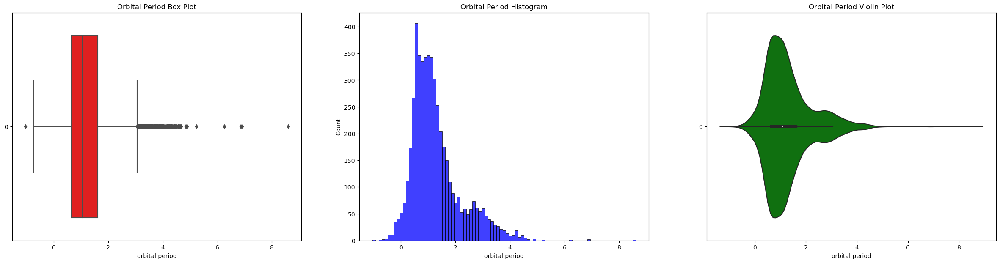

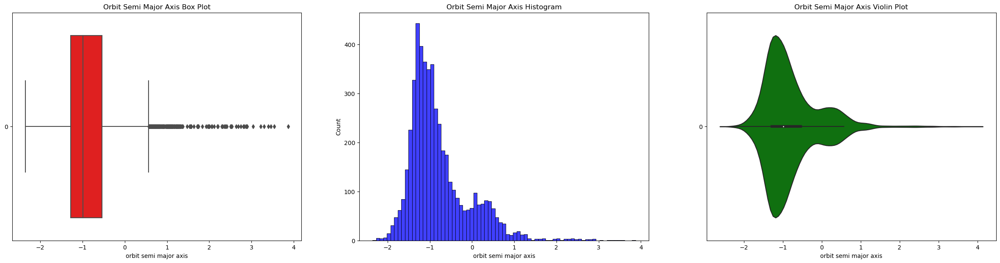

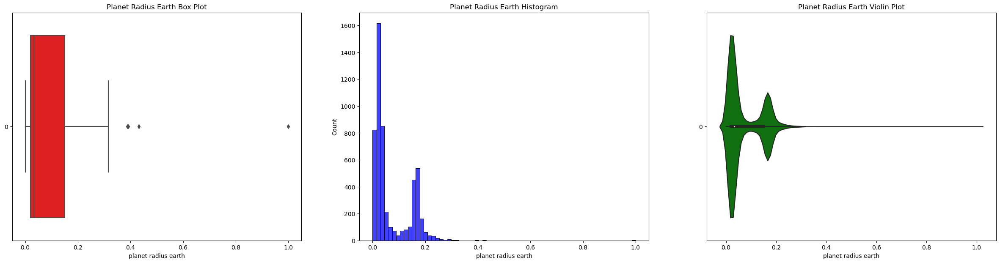

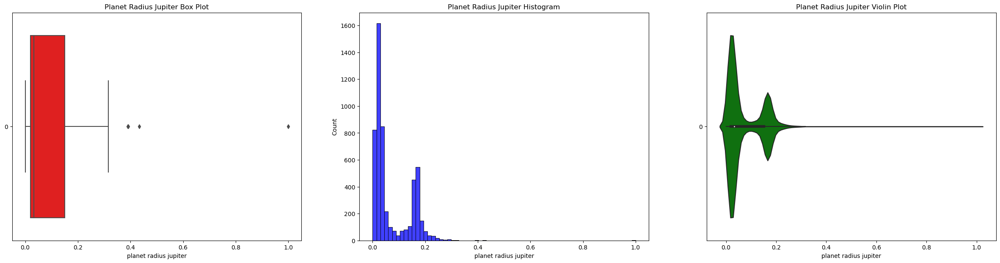

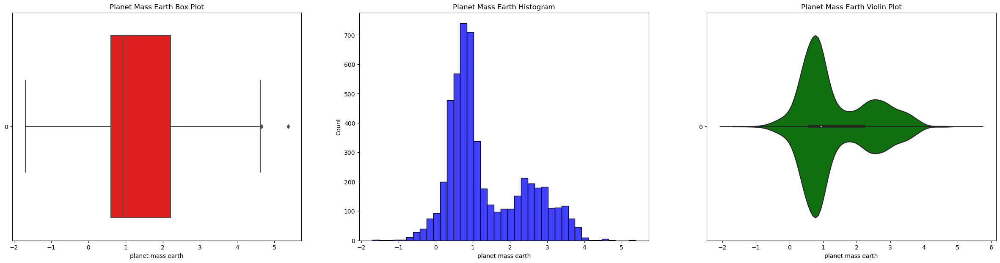

...

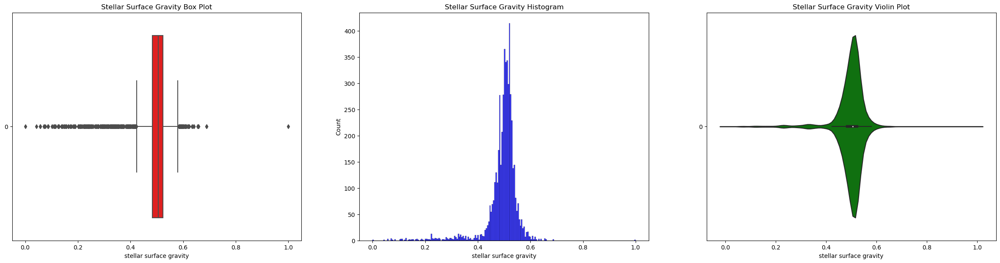

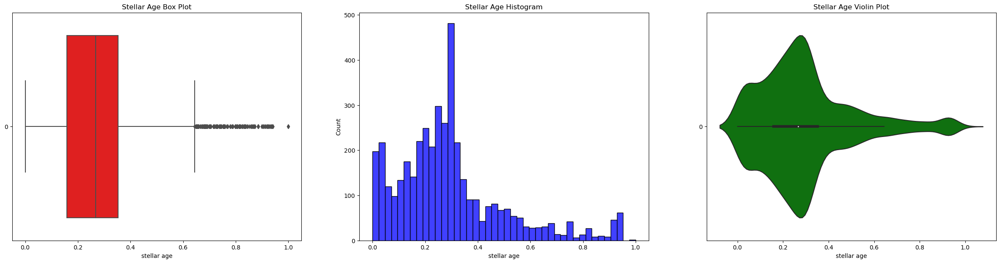

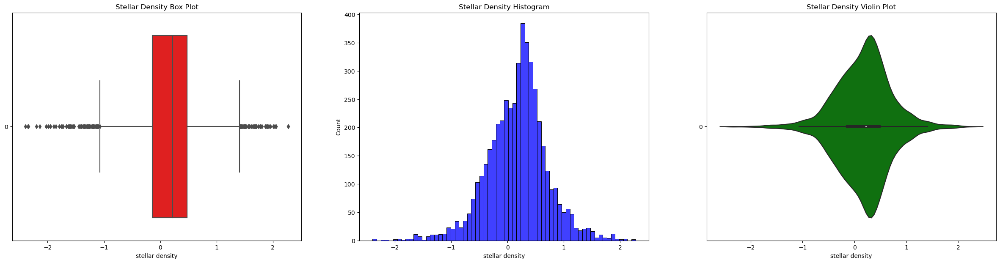

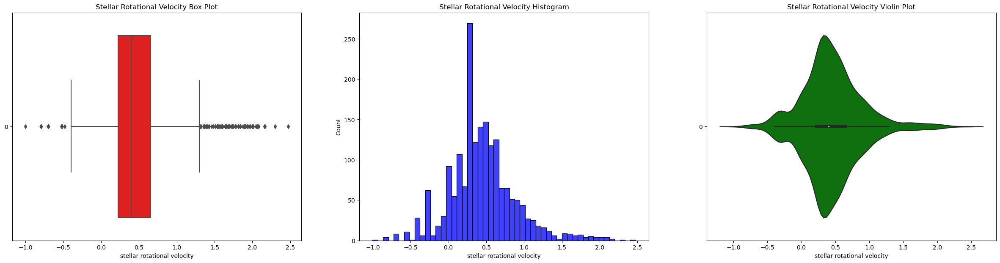

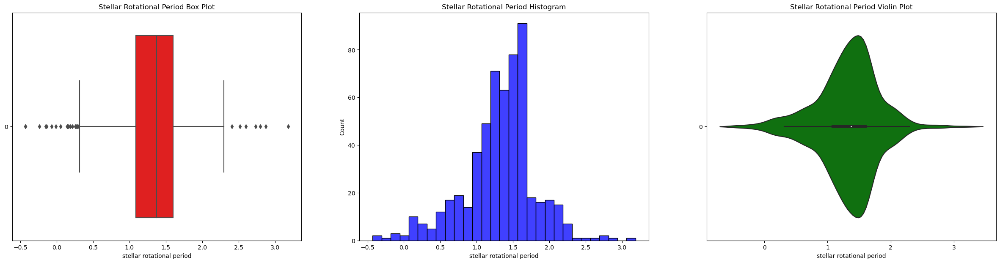

In [20]:
# Boxplot, Histogram, and Violin plot
for i in df_num_norm:
    f, axes = plt.subplots(1, 3, figsize=(30, 7))
    axes[0].set_xlabel(i.replace('_', ' '))
    axes[1].set_xlabel(i.replace('_', ' '))
    axes[2].set_xlabel(i.replace('_', ' '))
    axes[0].set_title(f"{i.replace('_', ' ').title()} Box Plot")
    axes[1].set_title(f"{i.replace('_', ' ').title()} Histogram")
    axes[2].set_title(f"{i.replace('_', ' ').title()} Violin Plot")
    axes[1].set_ylabel('Count')
    sns.boxplot(data=df_num_norm[i], orient="h", ax=axes[0], color='red')
    sns.histplot(data=df_num_norm[i], ax=axes[1], color='blue')
    sns.violinplot(data=df_num_norm[i], orient="h", ax=axes[2], color='green')



## Univariate Analysis (Categorical)

In [21]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   circumbinary_flag          5322 non-null   category
 1   controversial_flag         5322 non-null   category
 2   star_count                 5322 non-null   category
 3   planet_count               5322 non-null   category
 4   moon_count                 5322 non-null   category
 5   discovery_method           5322 non-null   category
 6   discovery_year             5322 non-null   category
 7   discovery_facility         5322 non-null   category
 8   controversial_flag         5322 non-null   category
 9   stellar_metallicity_ratio  4903 non-null   category
 10  star_type                  1891 non-null   object  
dtypes: category(10), object(1)
memory usage: 99.2+ KB


In [22]:
df_cat.describe()

,circumbinary_flag,controversial_flag,star_count,planet_count,moon_count,discovery_method,discovery_year,discovery_facility,controversial_flag,stellar_metallicity_ratio,star_type
count,5322,5322,5322,5322,5322,5322,5322,5322,5322,4903,1891
unique,2,2,4,8,1,11,31,68,2,5,12
top,0,0,1,1,0,Transit,2016,Kepler,0,[Fe/H],G
freq,5277,5294,4839,3101,5322,3982,1517,2709,5294,4291,682


Number of unique value: 6
G    682
K    537
M    400
F    235
A     20
B     10
Name: star_type, dtype: int64


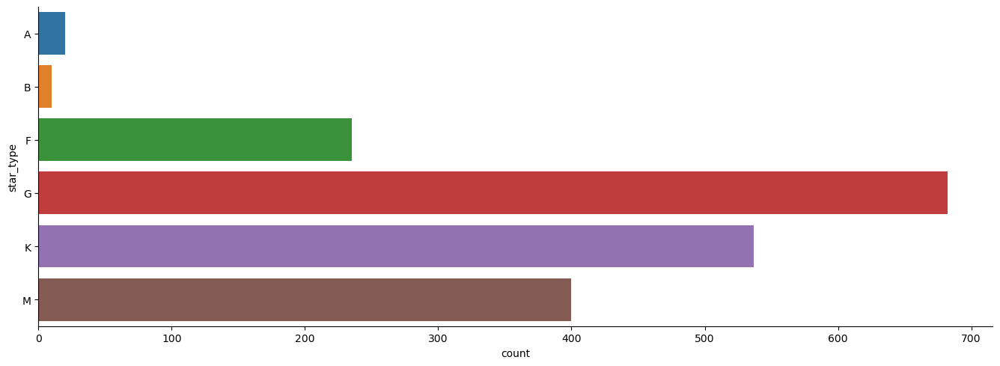

In [23]:
# Cat Plot for star type
g = sns.catplot(y = "star_type", data = star_type, kind = "count")
g.fig.set_size_inches(15, 5)
print(f"Number of unique value: {star_type['star_type'].nunique()}")
print(star_type['star_type'].value_counts())

As seen from the graph above, most star types fall into the "G" Category

In [24]:
from tabulate import tabulate

for i in df_cat:
    try:
        print(f"Number of unique values: {df_cat[i].nunique()}")
        print(tabulate(df_cat[i].value_counts().reset_index(), headers=['Category', 'Count'], tablefmt='psql'))
        print()
    except:
        continue


Number of unique values: 2
+----+------------+---------+
|    |   Category |   Count |
|----+------------+---------|
|  0 |          0 |    5277 |
|  1 |          1 |      45 |
+----+------------+---------+

Number of unique values: controversial_flag    2
controversial_flag    2
dtype: int64
Number of unique values: 4
+----+------------+---------+
|    |   Category |   Count |
|----+------------+---------|
|  0 |          1 |    4839 |
|  1 |          2 |     427 |
|  2 |          3 |      54 |
|  3 |          4 |       2 |
+----+------------+---------+

Number of unique values: 8
+----+------------+---------+
|    |   Category |   Count |
|----+------------+---------|
|  0 |          1 |    3101 |
|  1 |          2 |    1174 |
|  2 |          3 |     570 |
|  3 |          4 |     272 |
|  4 |          5 |     130 |
|  5 |          6 |      60 |
|  6 |          8 |       8 |
|  7 |          7 |       7 |
+----+------------+---------+

Number of unique values: 1
+----+------------+----

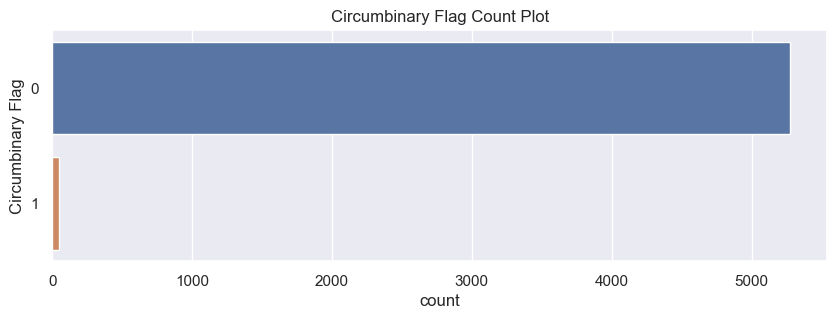

C:\Users\alexa\anaconda3\lib\site-packages\matplotlib\figure.py:2333: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if not np.isfinite(figsize).all() or (np.array(figsize) < 0).any():


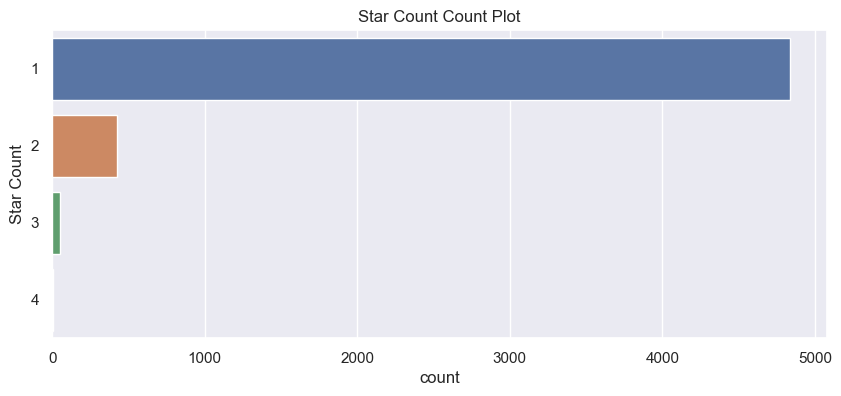

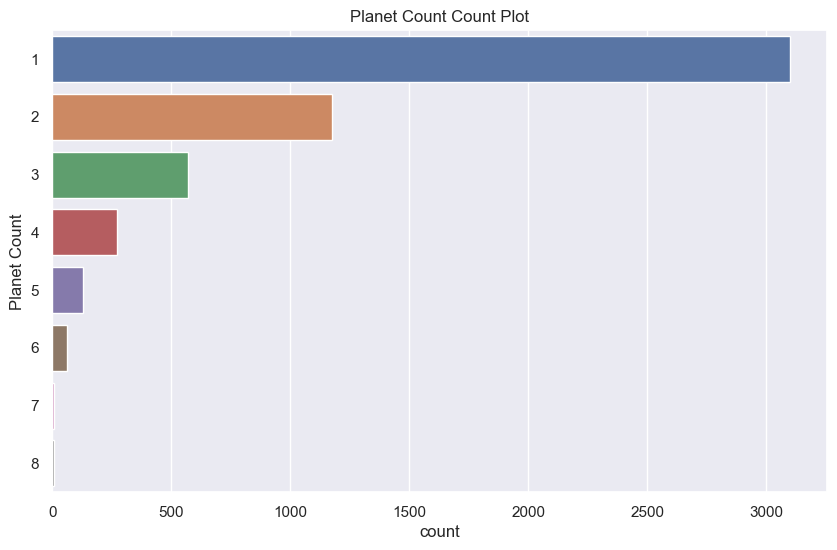

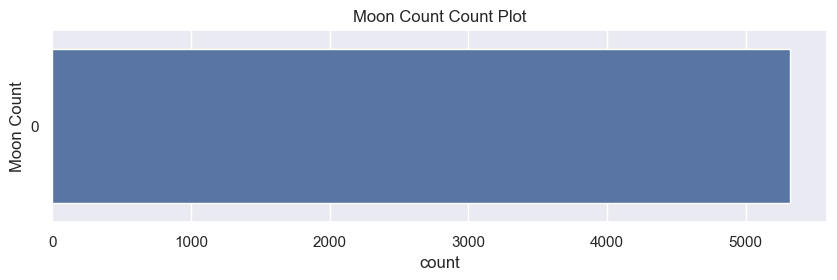

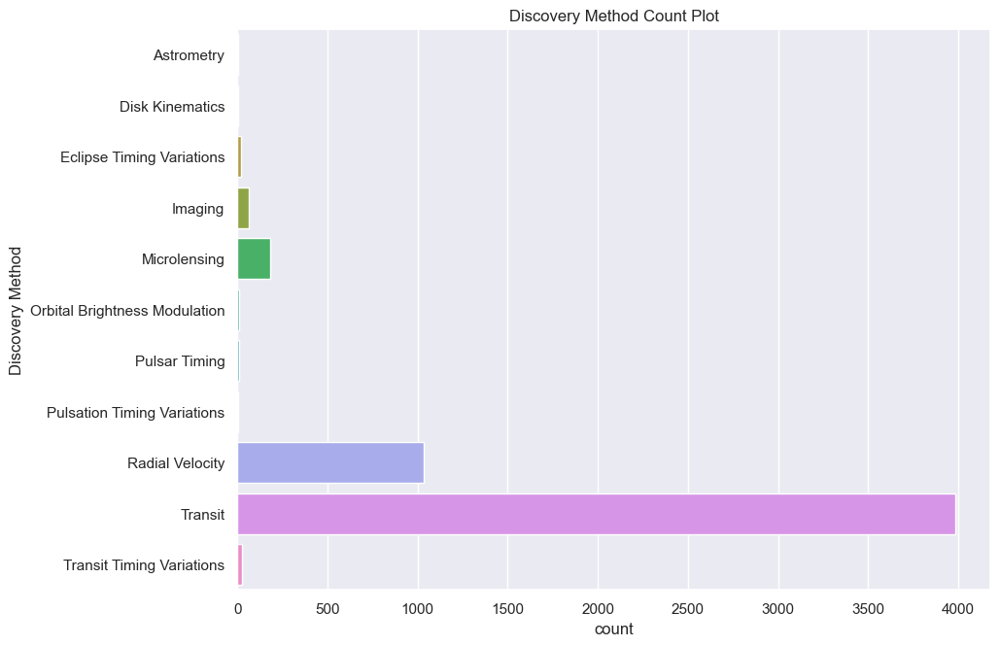

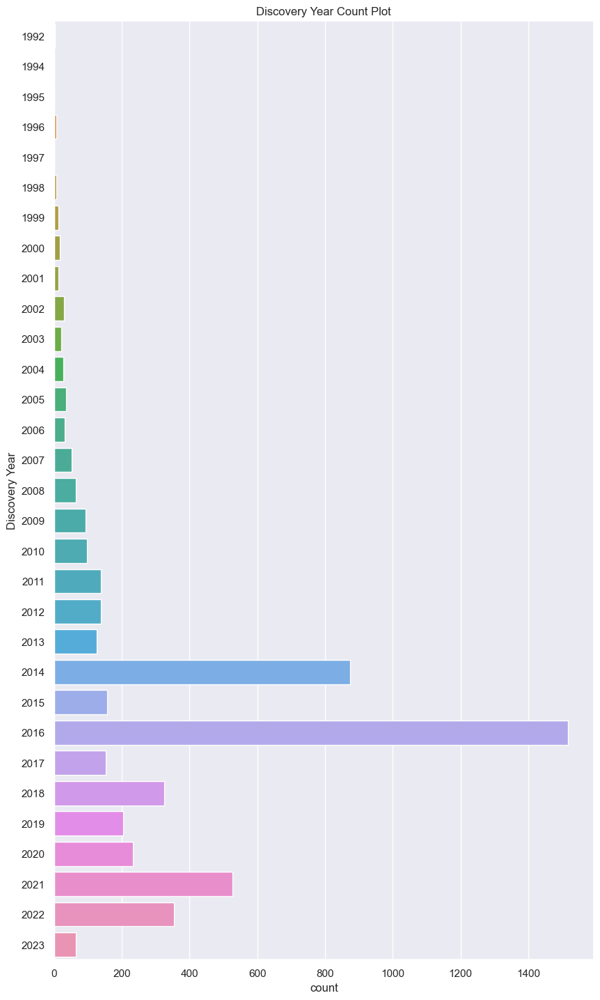

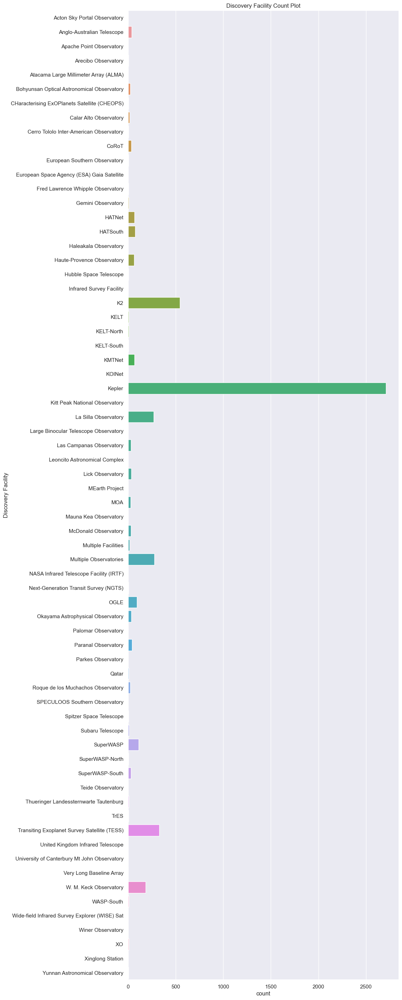

C:\Users\alexa\anaconda3\lib\site-packages\matplotlib\figure.py:2333: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  if not np.isfinite(figsize).all() or (np.array(figsize) < 0).any():


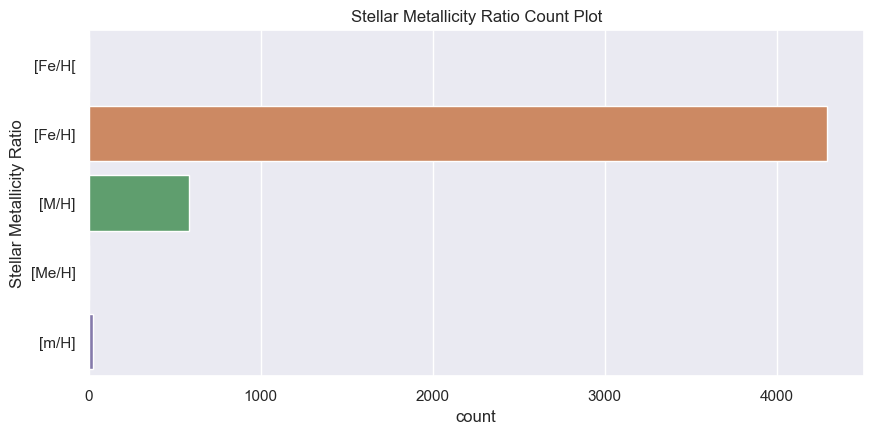

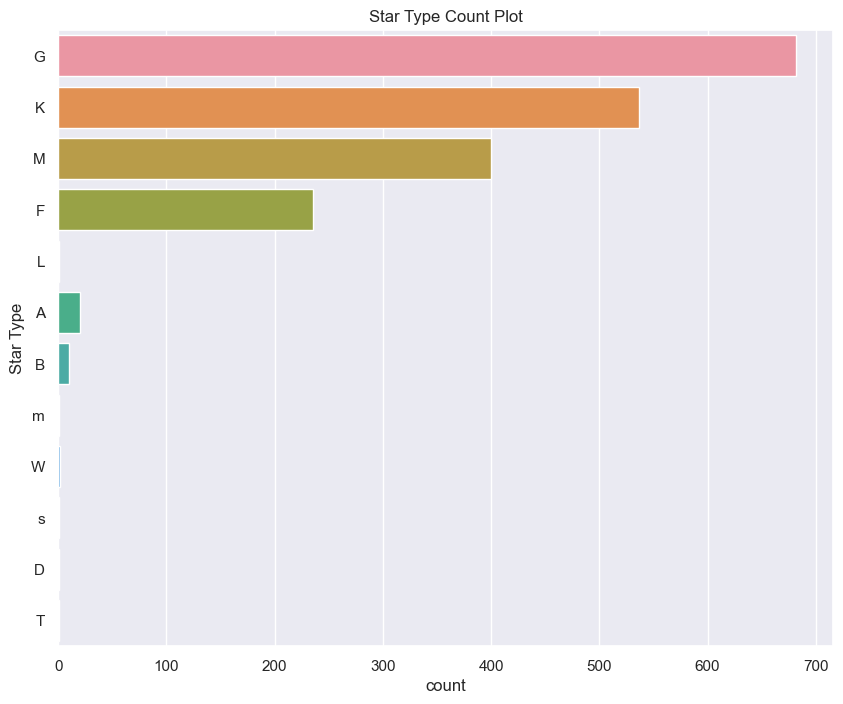

In [25]:
# Count Plot for Categorical Data
for i in df_cat:
    try:
        sns.set(style="darkgrid")
        plt.figure(figsize=(10,0.5*df_cat[i].nunique()+2))
        ax = sns.countplot(y=df_cat[i])
        ax.set_title(f"{i.replace('_', ' ').title()} Count Plot")
        ax.set_ylabel(f"{i.replace('_', ' ').title()}")
        plt.show()
    except:
        continue


## Data Cleaning and Preprocessing

First, we pick some important variables and drop the unnecessary one
Chosen Columns:
1. star_name

2. hoststar_name

3. star_count

4. star_count

5. circumbinary_flag

6. orbital_period

7. orbit_semi_major_axis

8. star_radius_earth

9. star_radius_jupiter

10. star_mass_earth

11. star_mass_jupiter

12. star_type (Response Variable)

13. stellar_effective_temperature

14. stellar_radius

15. stellar_mass

16. stellar_luminosity

17. stellar_age

The following columns are dropped due to the following reasons:
1. Discovery method

2. Discovery Year

3. Discovery Facility

4. Controversial Flag

5. star Density

6. Eccentricity

7. Insolation Flux

8. Equilibrium Temperature

9. Stellar Metallicity

10. Stellar Metallicity Ratio

11. Stellar Surface Gravity

12. Stellar Density

13. Stellar Rotational Velocity

14. Stellar Rotational Period

15. Number of moons

We decide to drop these variables due to several reasons, such as irrelevant variables and only have 1 unique value (in case of moon_count).

In [26]:
important_num = ['orbital_period','orbit_semi_major_axis','planet_radius_earth',
                 'planet_radius_jupiter','planet_mass_earth','planet_mass_jupiter',
                 'stellar_effective_temperature','stellar_radius','stellar_mass',
                 'stellar_luminosity','stellar_age']
important_cat = ['star_count','planet_count','circumbinary_flag', 'star_type']

In [27]:
df_cat.columns.values

array(['circumbinary_flag', 'controversial_flag', 'star_count',
       'planet_count', 'moon_count', 'discovery_method', 'discovery_year',
       'discovery_facility', 'controversial_flag',
       'stellar_metallicity_ratio', 'star_type'], dtype=object)

In [28]:
# Make copies of the dataframe
df_num_imp = df_num[important_num]
df_cat_imp = df_cat[important_cat].astype('category')

# Change star_type value
df_cat_imp['star_type'] = star_type['star_type'].astype('category')

In [29]:
df_num_imp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   orbital_period                 5101 non-null   float64
 1   orbit_semi_major_axis          5034 non-null   float64
 2   planet_radius_earth            5305 non-null   float64
 3   planet_radius_jupiter          5304 non-null   float64
 4   planet_mass_earth              5298 non-null   float64
 5   planet_mass_jupiter            5298 non-null   float64
 6   stellar_effective_temperature  5133 non-null   float64
 7   stellar_radius                 5113 non-null   float64
 8   stellar_mass                   5318 non-null   float64
 9   stellar_luminosity             5118 non-null   float64
 10  stellar_age                    4181 non-null   float64
dtypes: float64(11)
memory usage: 457.5 KB


New dataframe of numerical values with no null values

In [30]:
# Drop null values
df_temp = df_num_norm[important_num]
df_num_null = df_temp.dropna()
df_num_null.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4030 entries, 1 to 5321
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   orbital_period                 4030 non-null   float64
 1   orbit_semi_major_axis          4030 non-null   float64
 2   planet_radius_earth            4030 non-null   float64
 3   planet_radius_jupiter          4030 non-null   float64
 4   planet_mass_earth              4030 non-null   float64
 5   planet_mass_jupiter            4030 non-null   float64
 6   stellar_effective_temperature  4030 non-null   float64
 7   stellar_radius                 4030 non-null   float64
 8   stellar_mass                   4030 non-null   float64
 9   stellar_luminosity             4030 non-null   float64
 10  stellar_age                    4030 non-null   float64
dtypes: float64(11)
memory usage: 377.8 KB


We end up with 4030 non-null value

---



New dataframe for numerical values where null value replaced using Iterative Imputation

Iterative Imputation is chosen as it is a multivariate imputational method that uses an initial value to generate a sequence of improving approximate solutions for a class of problems.

We use iteration computation to fill number of missing values for numerical variables

In [31]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import mean_absolute_error

In [32]:
# Iterative Imputation
df_num_iter = df_temp.copy()

# create a IterativeImputer object
imputer = IterativeImputer()

imputer.fit(df_num_iter)
df_num_iter = pd.DataFrame(imputer.transform(df_num_iter), columns = df_temp.columns.values)
df_num_iter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   orbital_period                 5322 non-null   float64
 1   orbit_semi_major_axis          5322 non-null   float64
 2   planet_radius_earth            5322 non-null   float64
 3   planet_radius_jupiter          5322 non-null   float64
 4   planet_mass_earth              5322 non-null   float64
 5   planet_mass_jupiter            5322 non-null   float64
 6   stellar_effective_temperature  5322 non-null   float64
 7   stellar_radius                 5322 non-null   float64
 8   stellar_mass                   5322 non-null   float64
 9   stellar_luminosity             5322 non-null   float64
 10  stellar_age                    5322 non-null   float64
dtypes: float64(11)
memory usage: 457.5 KB


C:\Users\alexa\anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [33]:
df_cat_imp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   star_count         5322 non-null   category
 1   planet_count       5322 non-null   category
 2   circumbinary_flag  5322 non-null   category
 3   star_type          1884 non-null   category
dtypes: category(4)
memory usage: 21.8 KB


Only star type has null values. Other categorical variables does not have null values, therefore, there's no need for data cleaning

----------------------------------------------------------------------------------------------------



Seperate planet and star attributes

In [34]:
important_num_planet = ['orbital_period','orbit_semi_major_axis','planet_radius_earth',
                       'planet_radius_jupiter','planet_mass_earth','planet_mass_jupiter']

In [35]:
df_num_imp_planet = df[important_num_planet] # not normalized, null not dropped (Unaltered Data)
df_num_null_planet = df_num_null[important_num_planet] # normalized, null dropped
df_num_iter_planet = df_num_iter[important_num_planet] # normalized, null iterative imputing

In [36]:
print(df_num_imp_planet.shape[0])
print(df_num_null_planet.shape[0])
# num of rows dropped by null value still reasonable, so we proceed using both ofthat

5322
4030


## Bivariate Analysis (Planet Attributes) - Numerical

### Unaltered Data

In [37]:
df_num_imp_planet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   orbital_period         5101 non-null   float64
 1   orbit_semi_major_axis  5034 non-null   float64
 2   planet_radius_earth    5305 non-null   float64
 3   planet_radius_jupiter  5304 non-null   float64
 4   planet_mass_earth      5298 non-null   float64
 5   planet_mass_jupiter    5298 non-null   float64
dtypes: float64(6)
memory usage: 249.6 KB


In [38]:
df_num_imp_planet.describe()

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter
count,5.101000e+03,5034.000000,5305.000000,5304.000000,5298.000000,5298.000000
mean,8.267705e+04,6.884469,5.683333,0.507181,459.827424,1.447200
std,5.630630e+06,137.666794,5.335803,0.476083,3735.064840,11.754661
min,9.070629e-02,0.004400,0.296000,0.026000,0.020000,0.000060
25%,4.445880e+00,0.052900,1.770000,0.158000,4.000000,0.012592
50%,1.155530e+01,0.102800,2.760000,0.246000,8.590000,0.027030
75%,4.100801e+01,0.289925,11.893000,1.060000,162.093300,0.510000
max,4.020000e+08,7506.000000,77.342000,6.900000,239000.000000,752.000000


In [39]:
# # Jointplot (Unalterated data)
# var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_imp_planet.columns) for var2 in df_num_imp_planet.columns[i+1:]]
# for var1, var2 in var_combinations:
#     sns.jointplot(data=df_num_imp_planet, x=var1, y=var2, height = 12)

Relationship between mass and radius is interesting, as if there are two separate line equations

We can also see that earth and jupiter are just units for measurement, hence the straight line

### Dropping null values

In [40]:
df_num_null_planet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4030 entries, 1 to 5321
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   orbital_period         4030 non-null   float64
 1   orbit_semi_major_axis  4030 non-null   float64
 2   planet_radius_earth    4030 non-null   float64
 3   planet_radius_jupiter  4030 non-null   float64
 4   planet_mass_earth      4030 non-null   float64
 5   planet_mass_jupiter    4030 non-null   float64
dtypes: float64(6)
memory usage: 220.4 KB


In [41]:
df_num_null_planet.describe()

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter
count,4030.000000,4030.000000,4030.000000,4030.000000,4030.000000,4030.000000
mean,1.243630,-0.889023,0.067127,0.067191,1.283116,-1.219020
std,0.859252,0.581739,0.067513,0.067516,0.999243,0.999304
min,-0.552339,-2.221849,0.000000,0.000000,-1.427128,-3.920819
25%,0.641056,-1.284833,0.018482,0.018475,0.586587,-1.917215
50%,1.056561,-1.017503,0.031202,0.031277,0.919078,-1.583359
75%,1.596113,-0.650625,0.136279,0.136093,2.089019,-0.413134
max,8.604226,3.875409,0.391870,0.391912,4.619093,2.117271


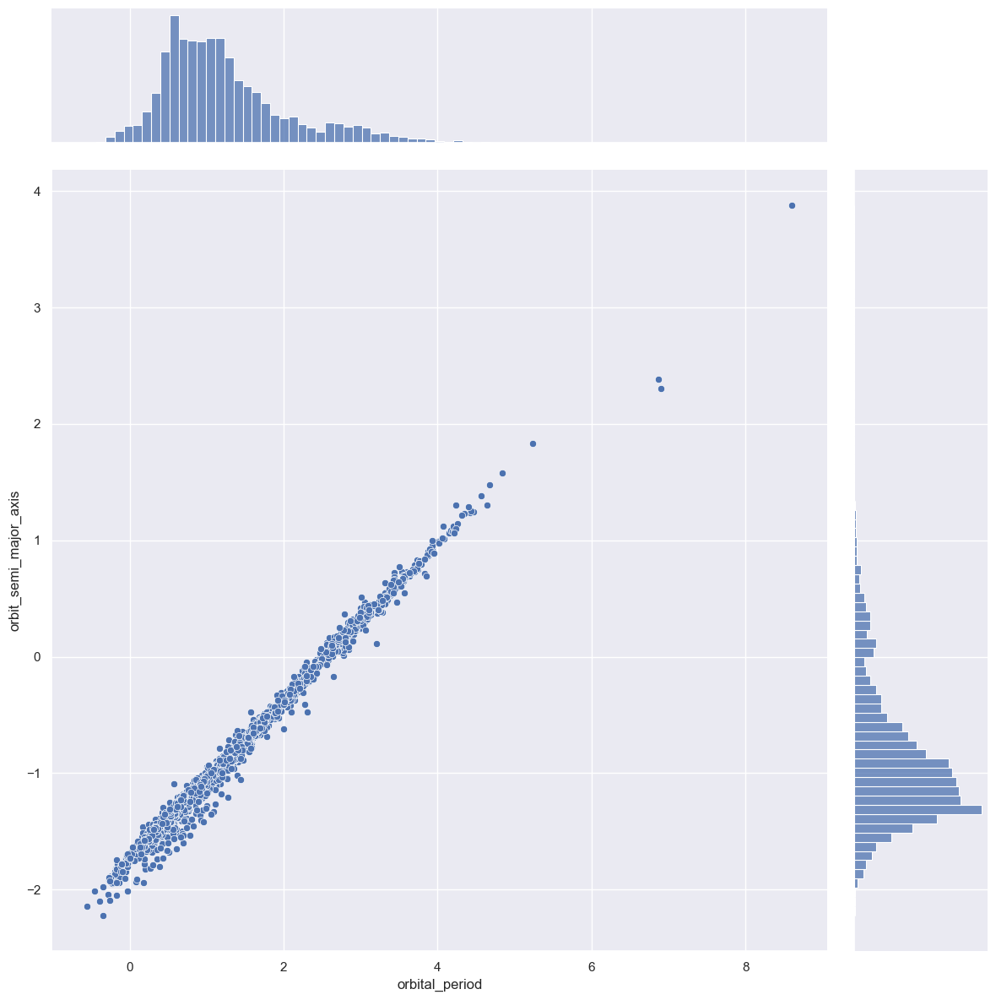

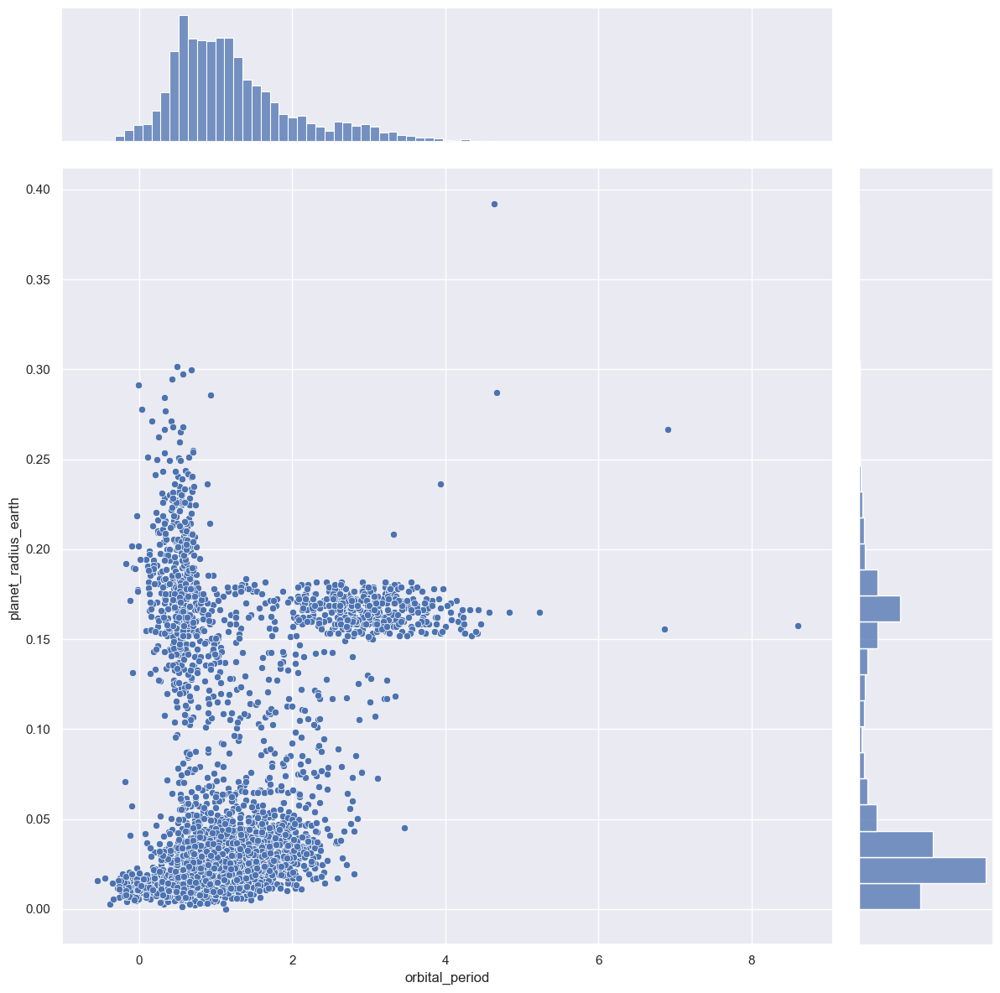

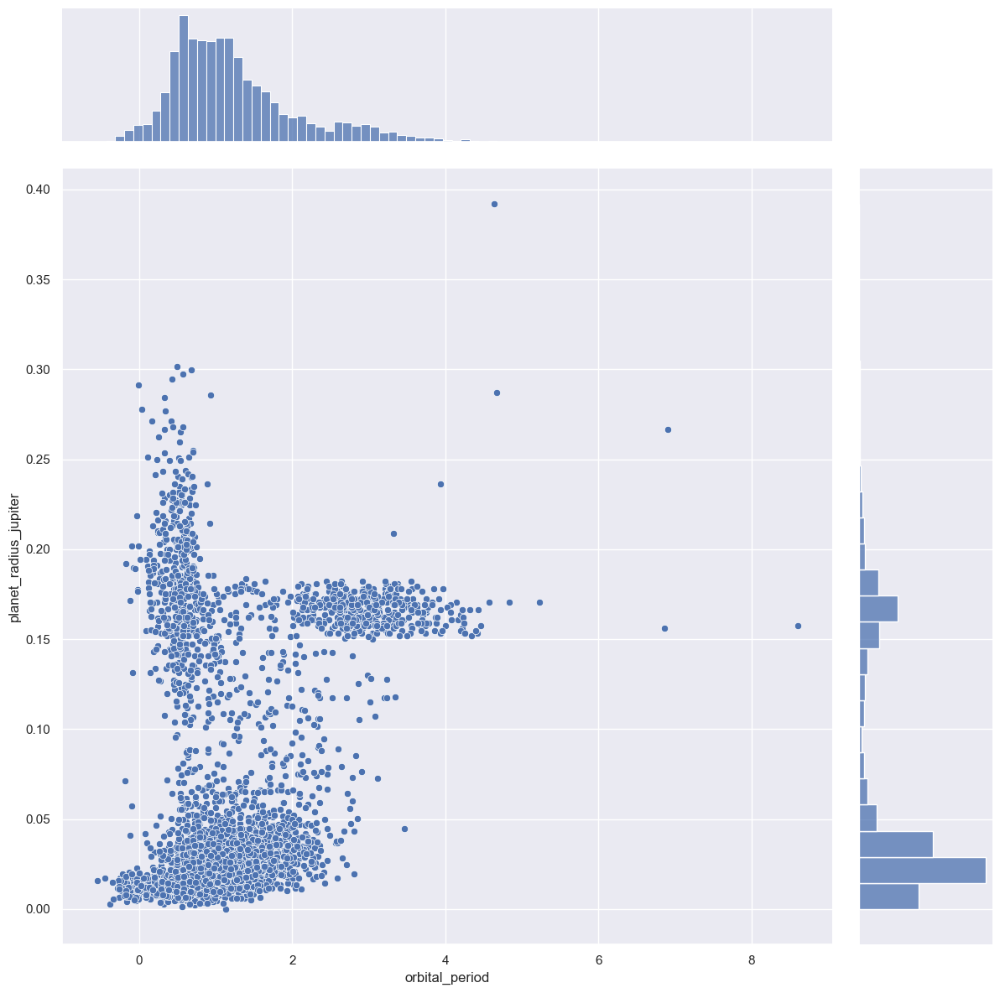

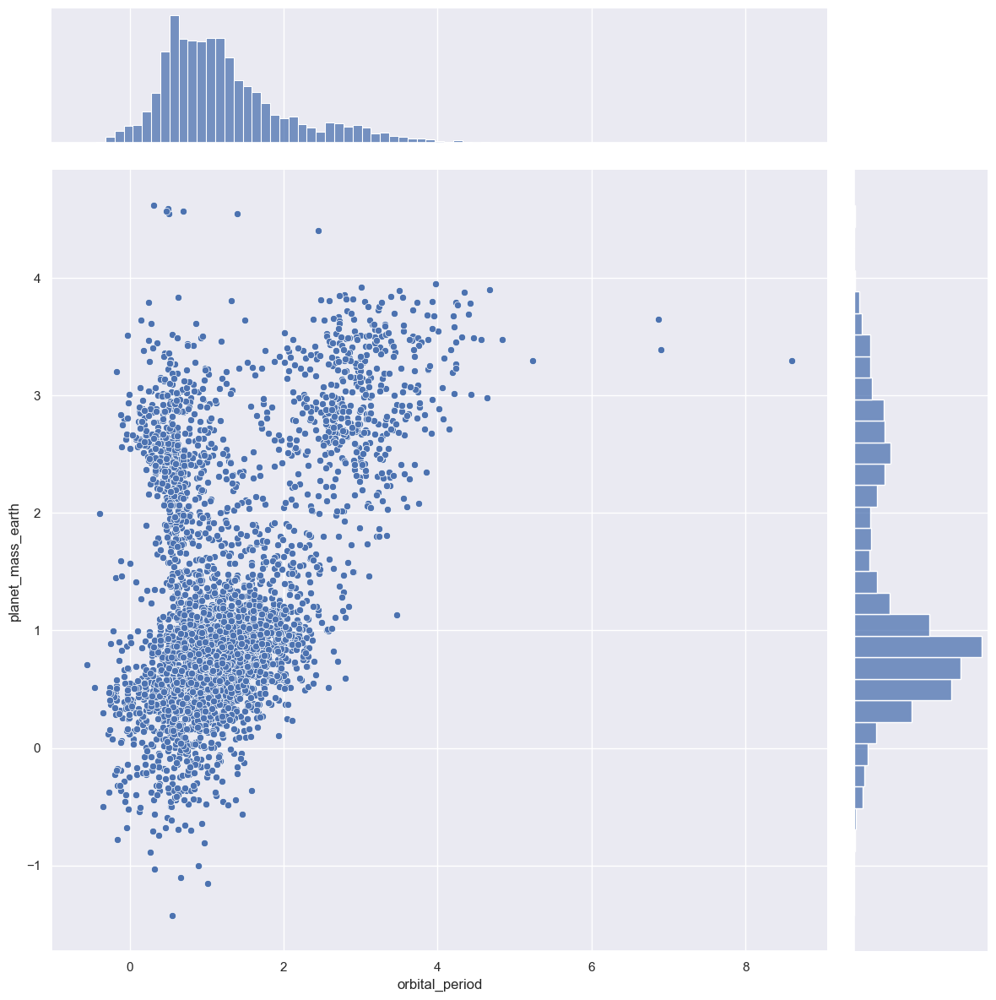

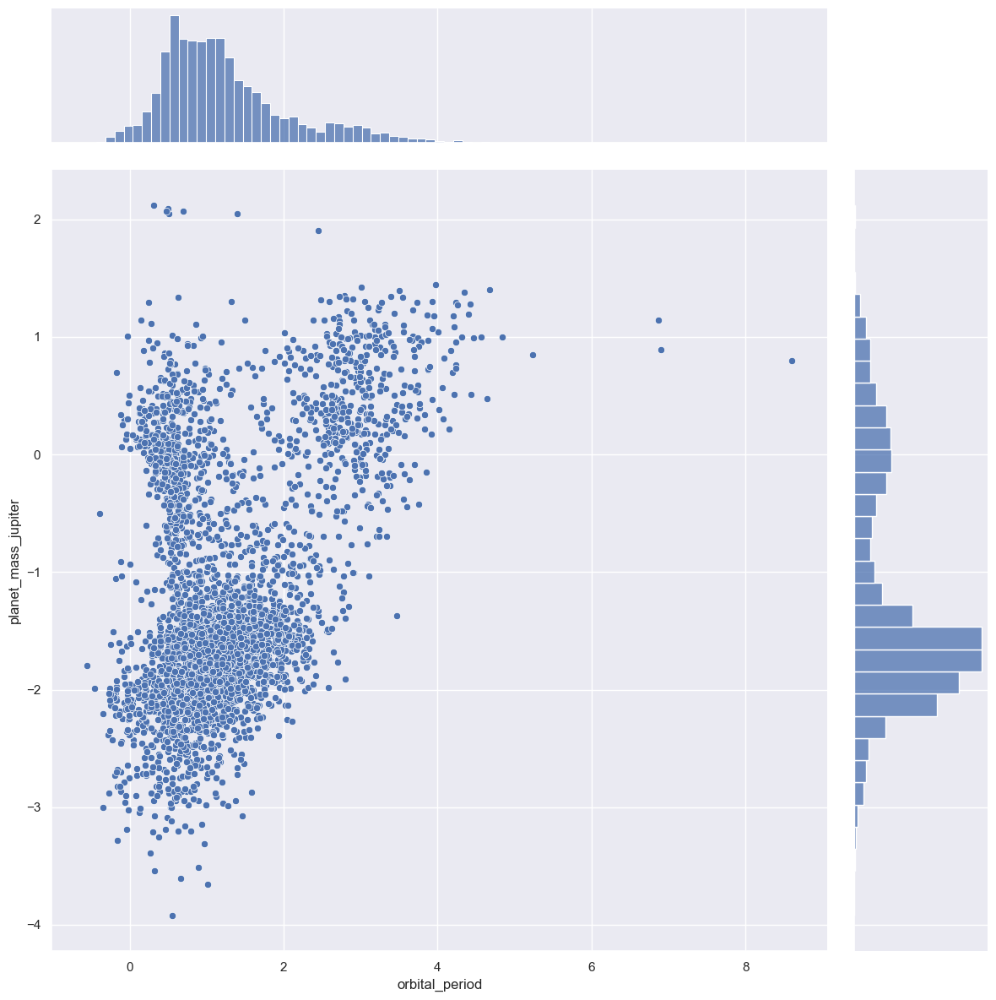

...

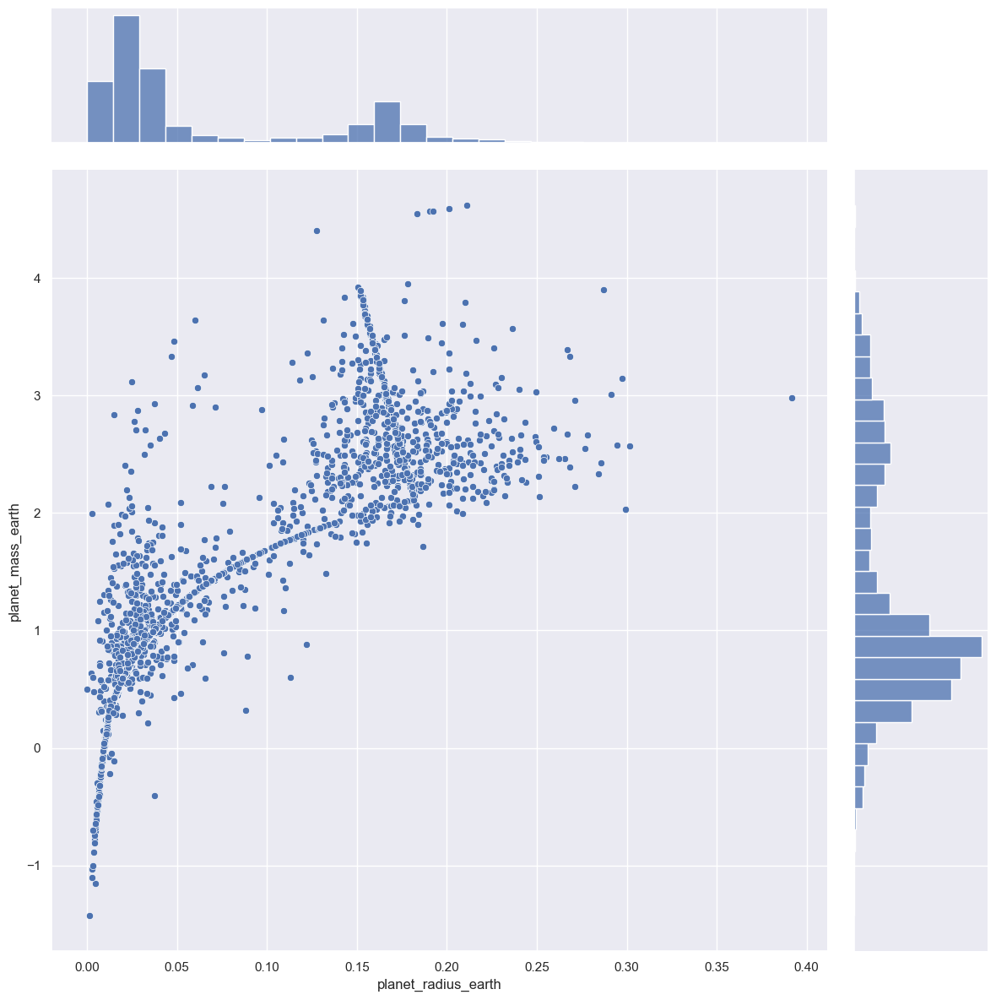

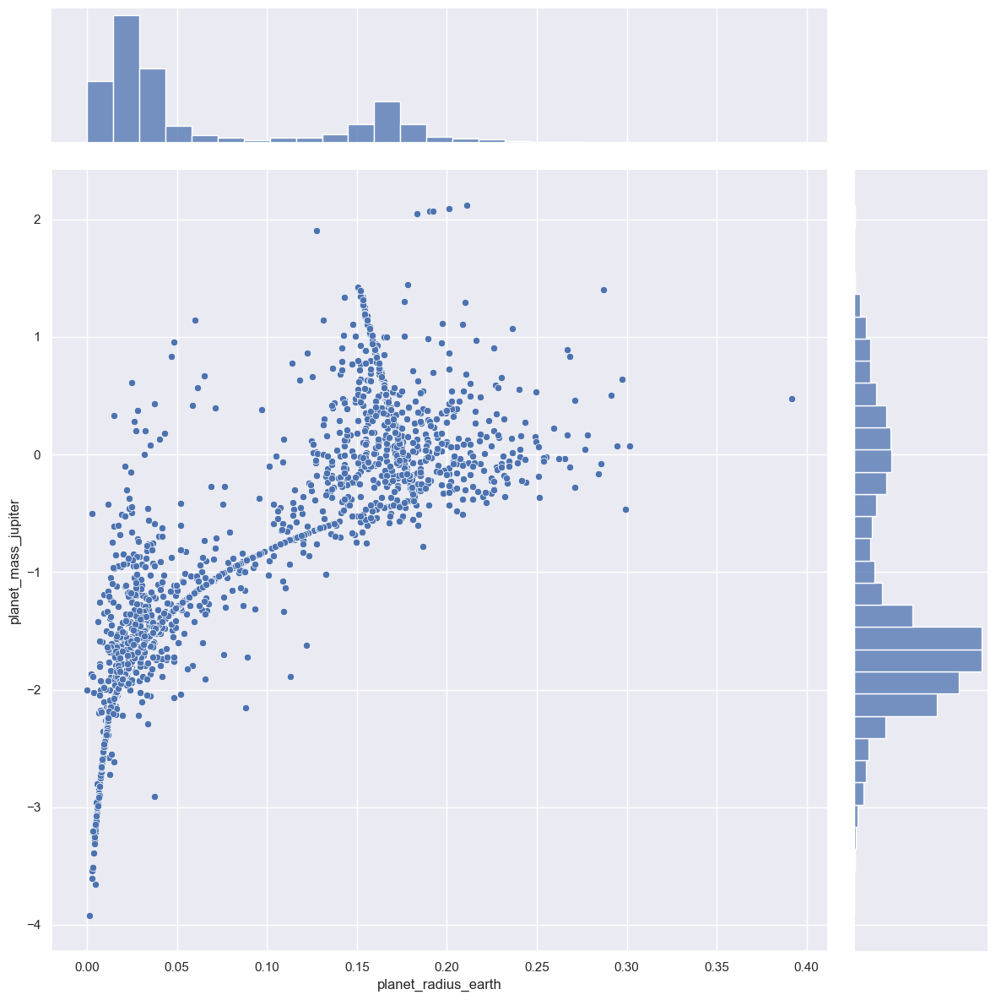

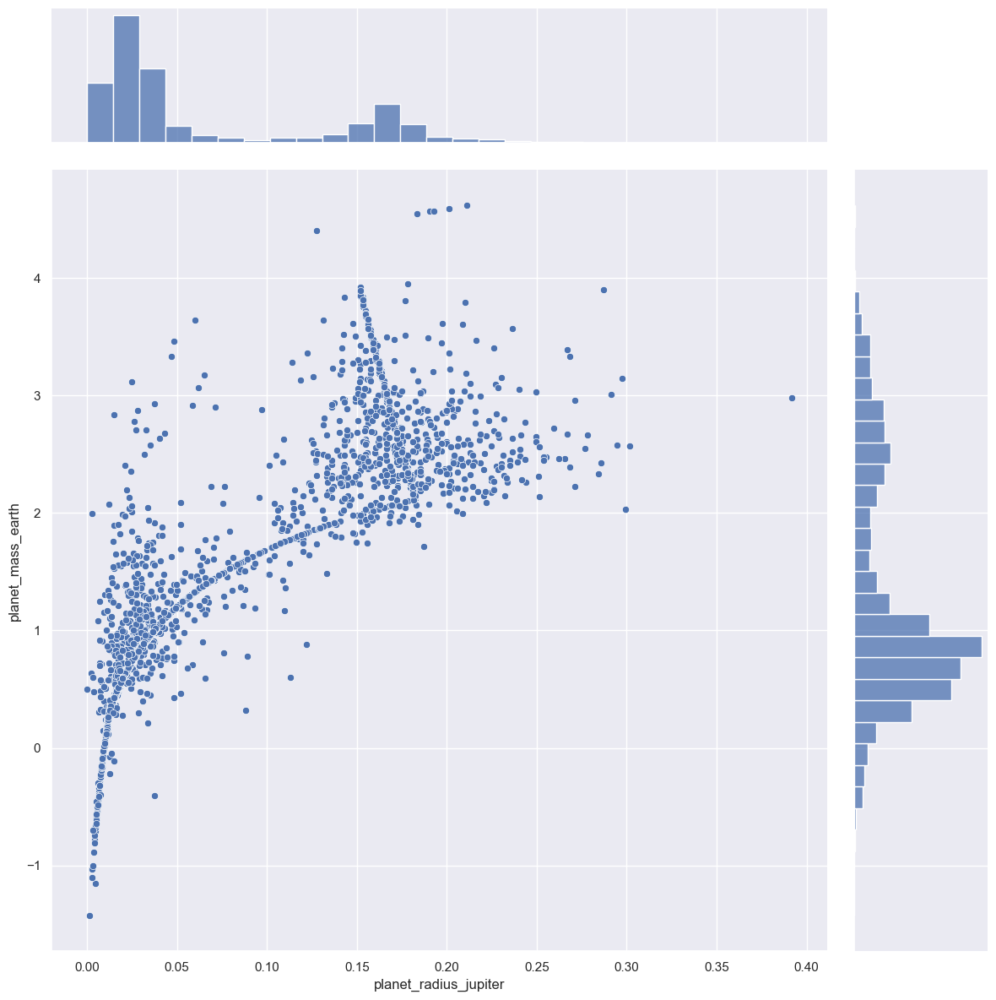

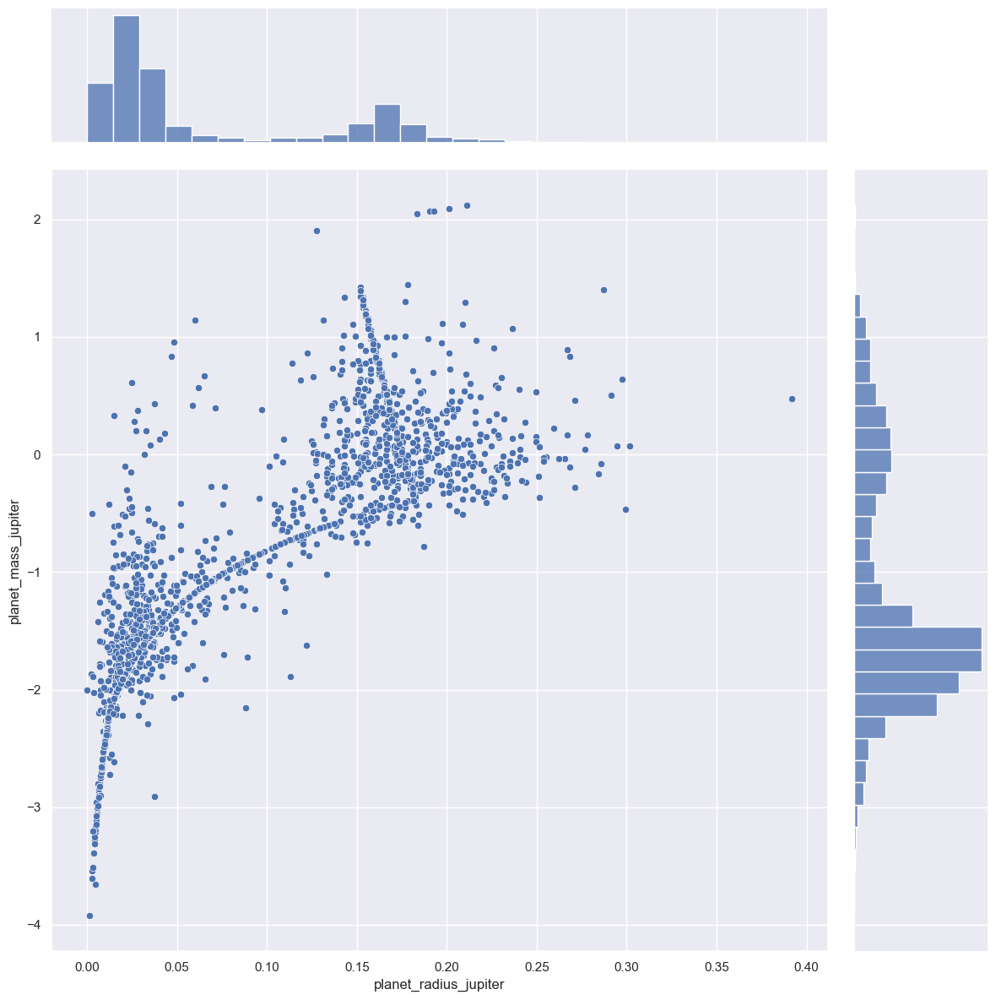

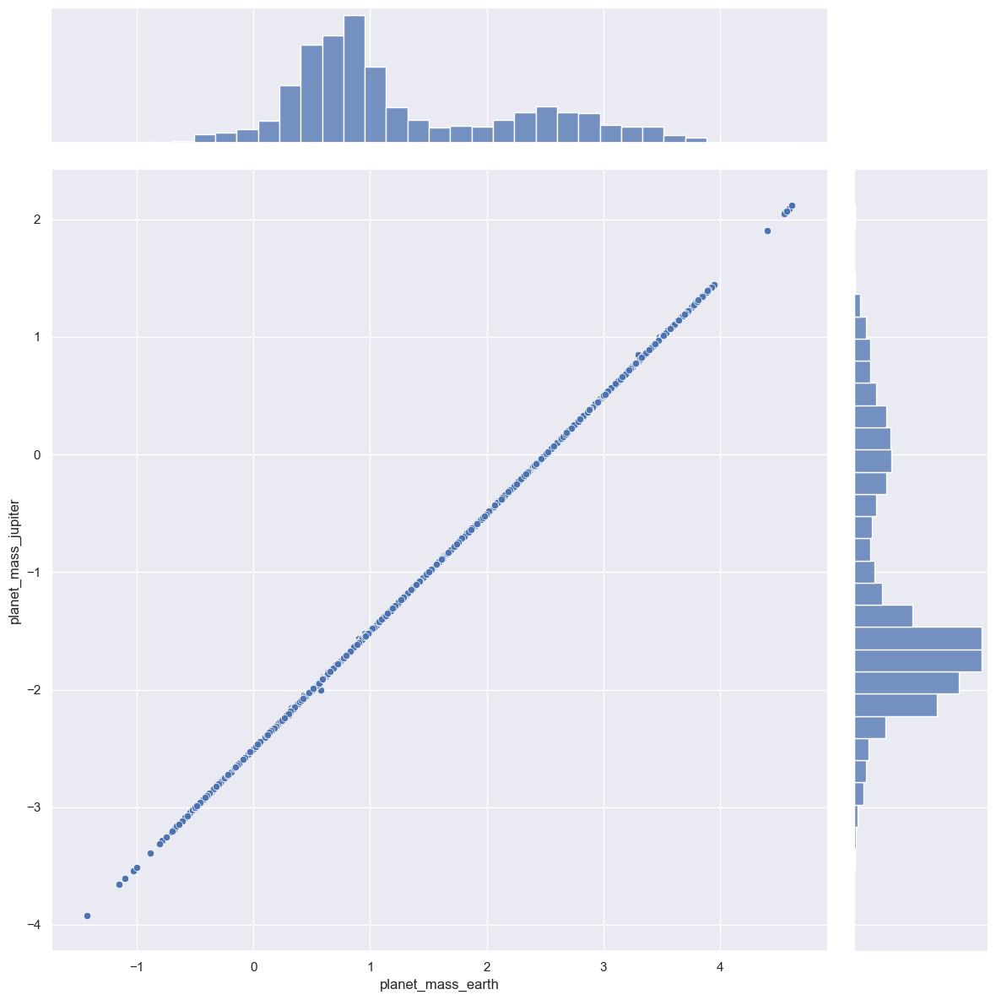

In [42]:
# Jointplot (Dropping Null values)
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_null_planet.columns) for var2 in df_num_null_planet.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_null_planet, x=var1, y=var2, height = 12)

### Iterative Imputation

In [43]:
df_num_iter_planet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   orbital_period         5322 non-null   float64
 1   orbit_semi_major_axis  5322 non-null   float64
 2   planet_radius_earth    5322 non-null   float64
 3   planet_radius_jupiter  5322 non-null   float64
 4   planet_mass_earth      5322 non-null   float64
 5   planet_mass_jupiter    5322 non-null   float64
dtypes: float64(6)
memory usage: 249.6 KB


In [44]:
df_num_iter_planet.describe()

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter
count,5322.000000,5322.000000,5322.000000,5322.000000,5322.000000,5322.000000
mean,1.372850,-0.808866,0.069924,0.069988,1.336699,-1.165483
std,1.051247,0.707675,0.069144,0.069148,1.040230,1.040265
min,-1.042363,-2.356547,0.000000,0.000000,-1.698970,-4.221849
25%,0.664179,-1.279441,0.019131,0.019203,0.603144,-1.899629
50%,1.100250,-0.992893,0.032039,0.032150,0.937016,-1.565431
75%,1.732834,-0.561814,0.150378,0.150422,2.207411,-0.292430
max,8.604226,3.875409,1.000000,1.000000,5.378398,2.876218


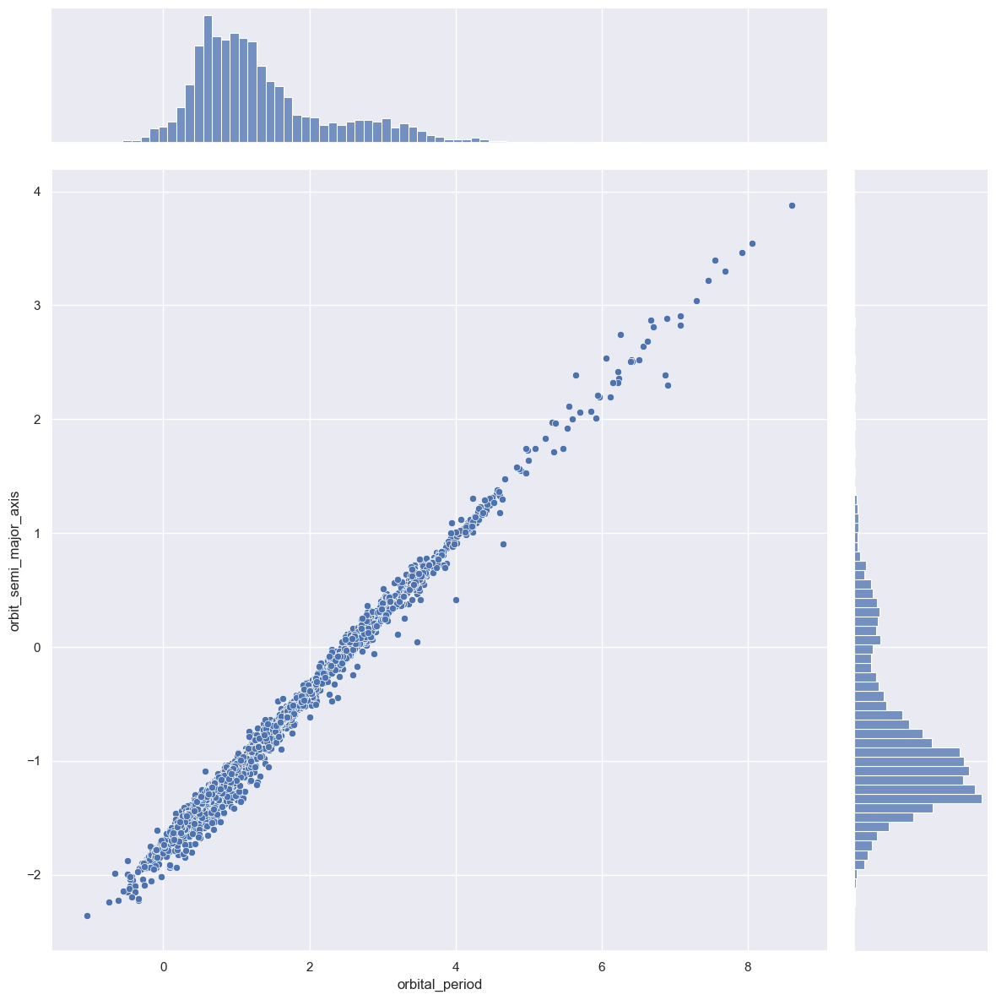

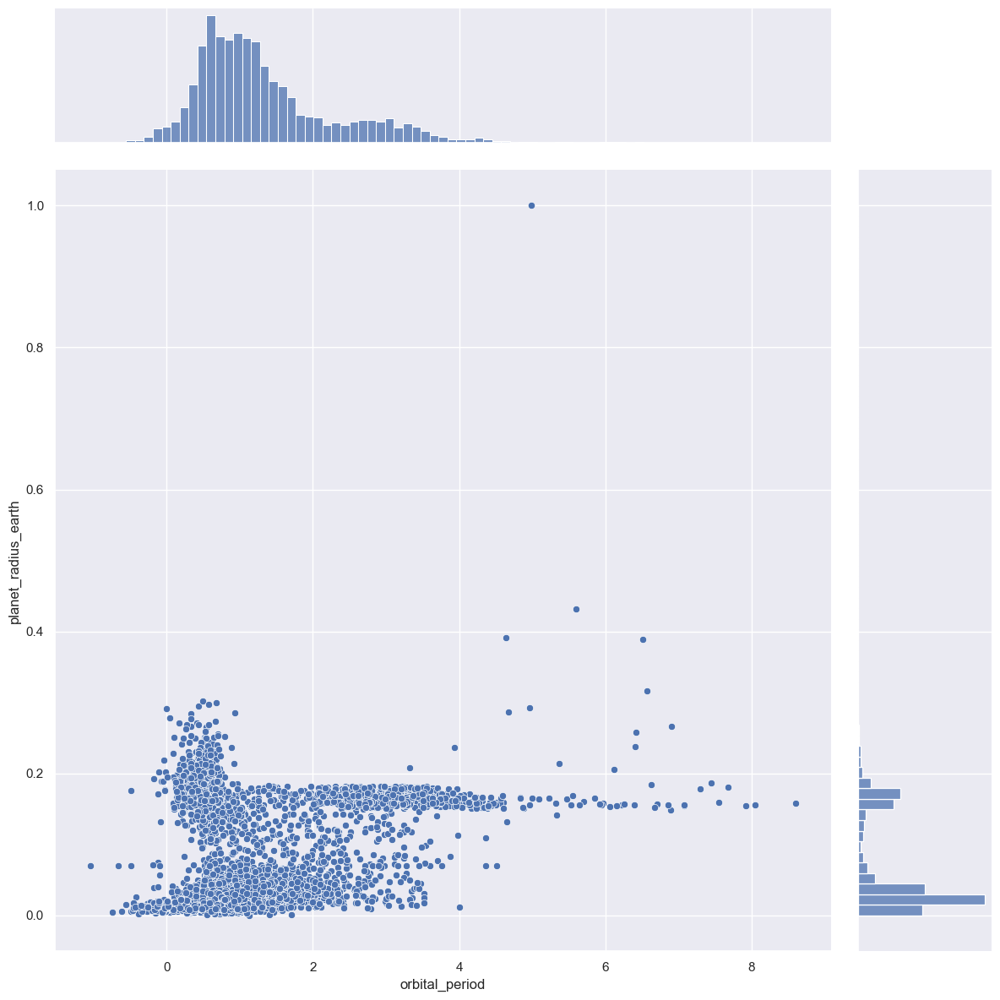

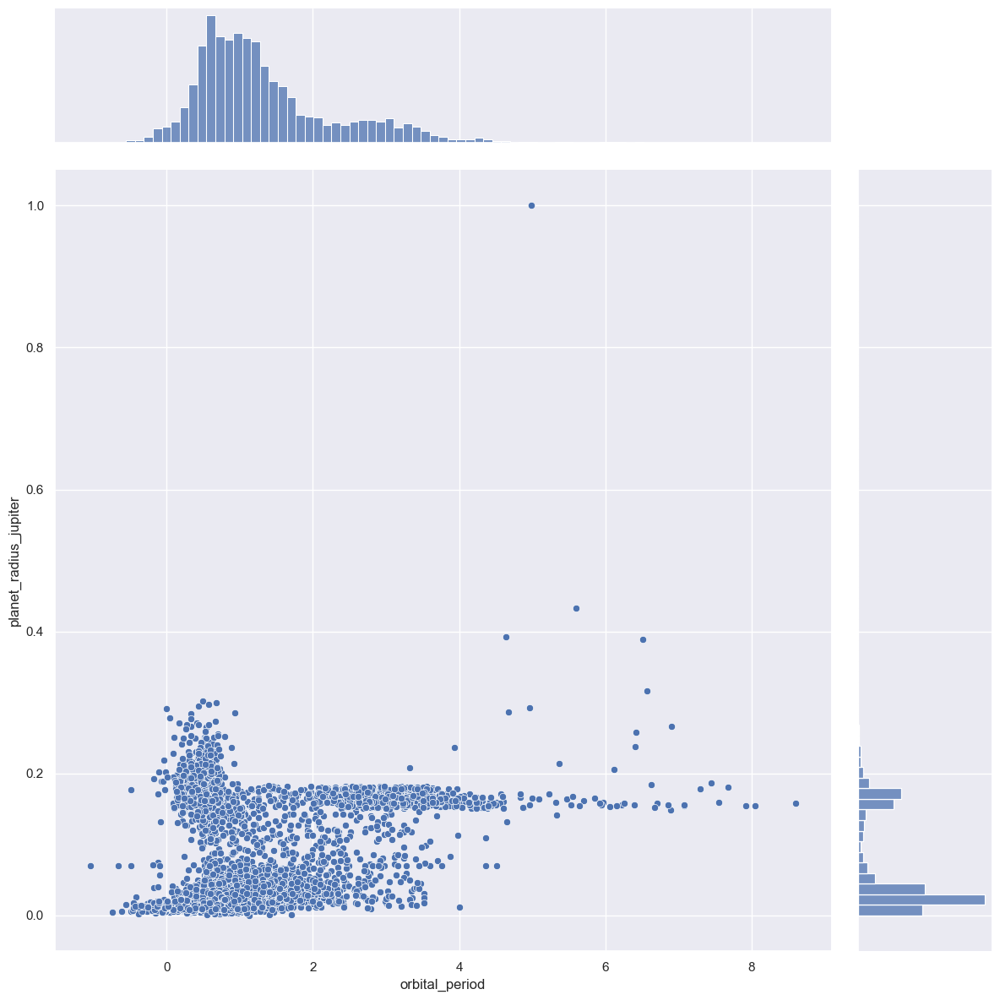

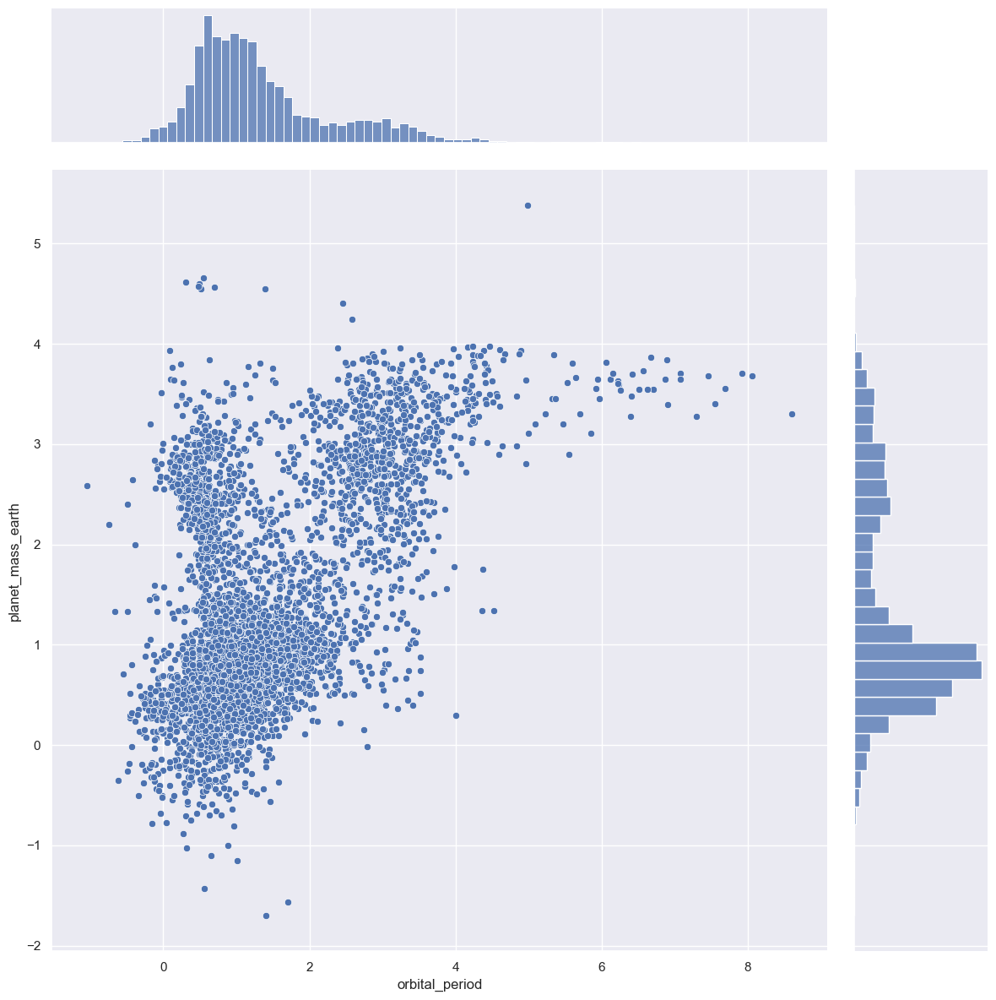

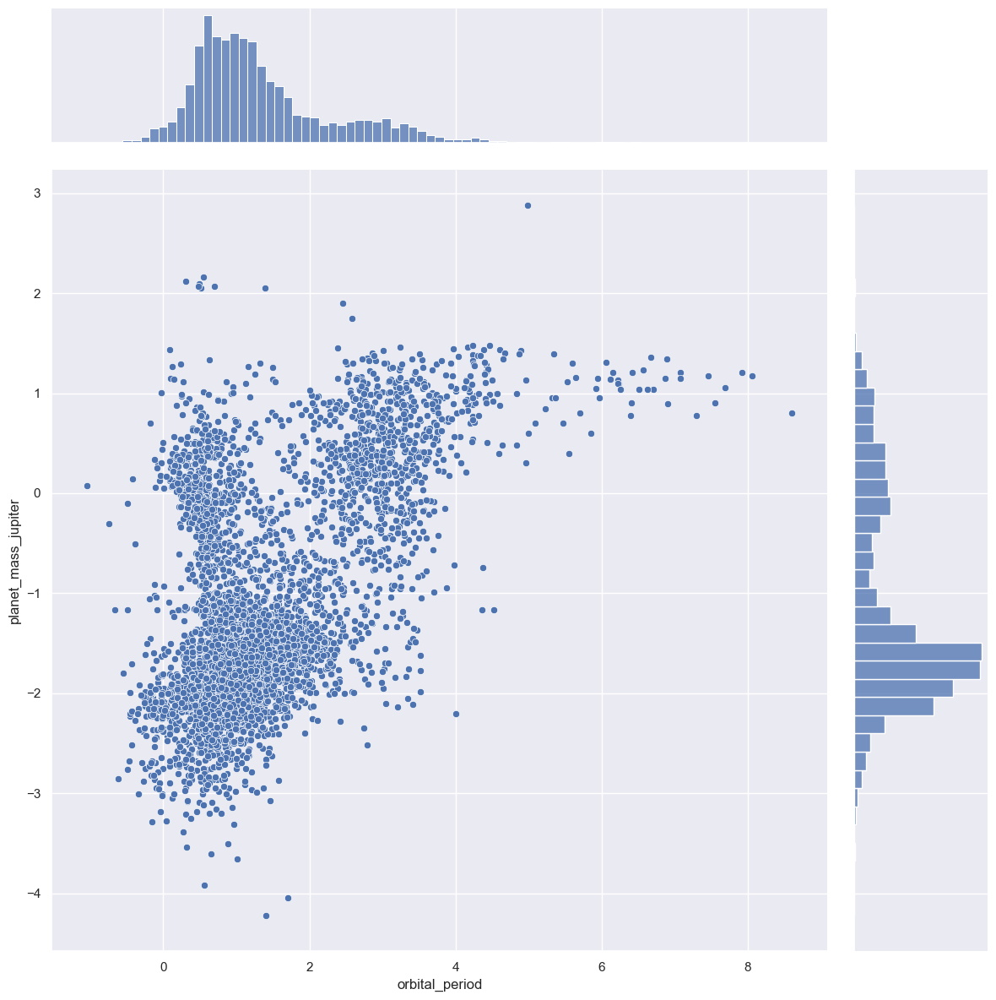

...

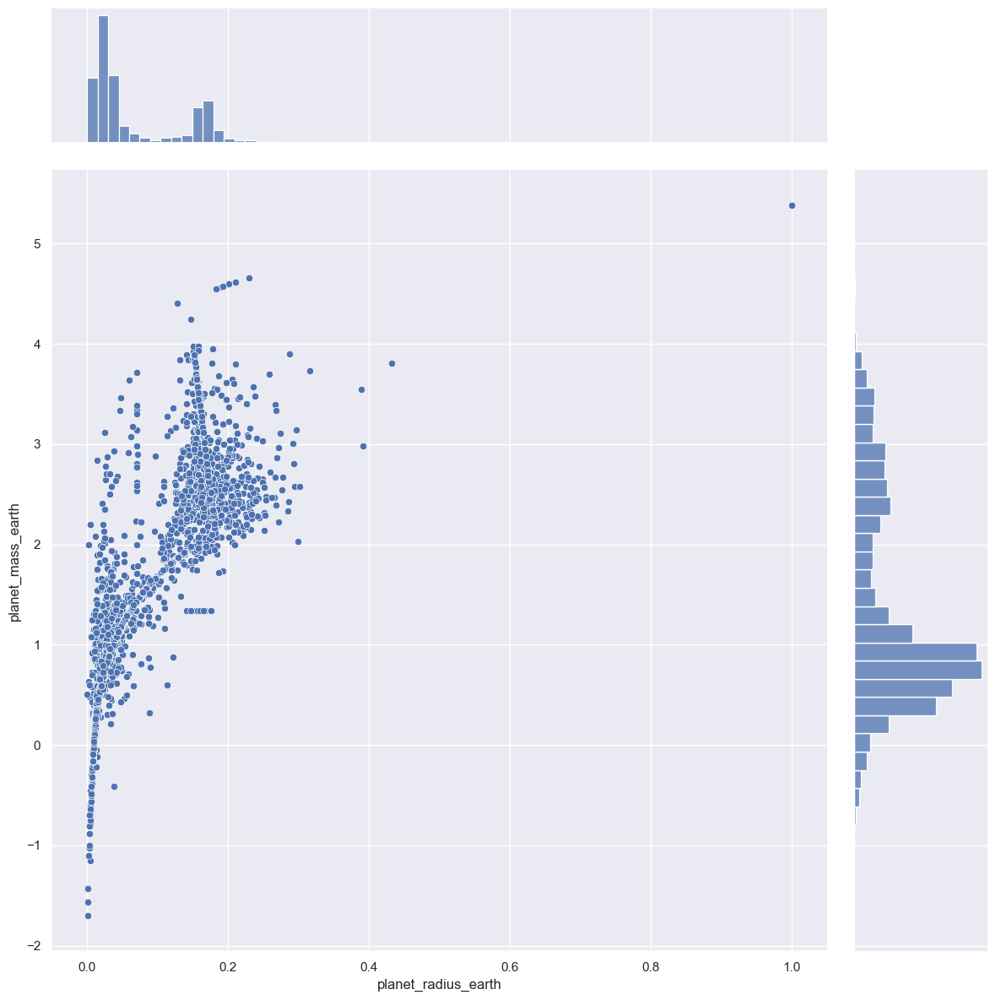

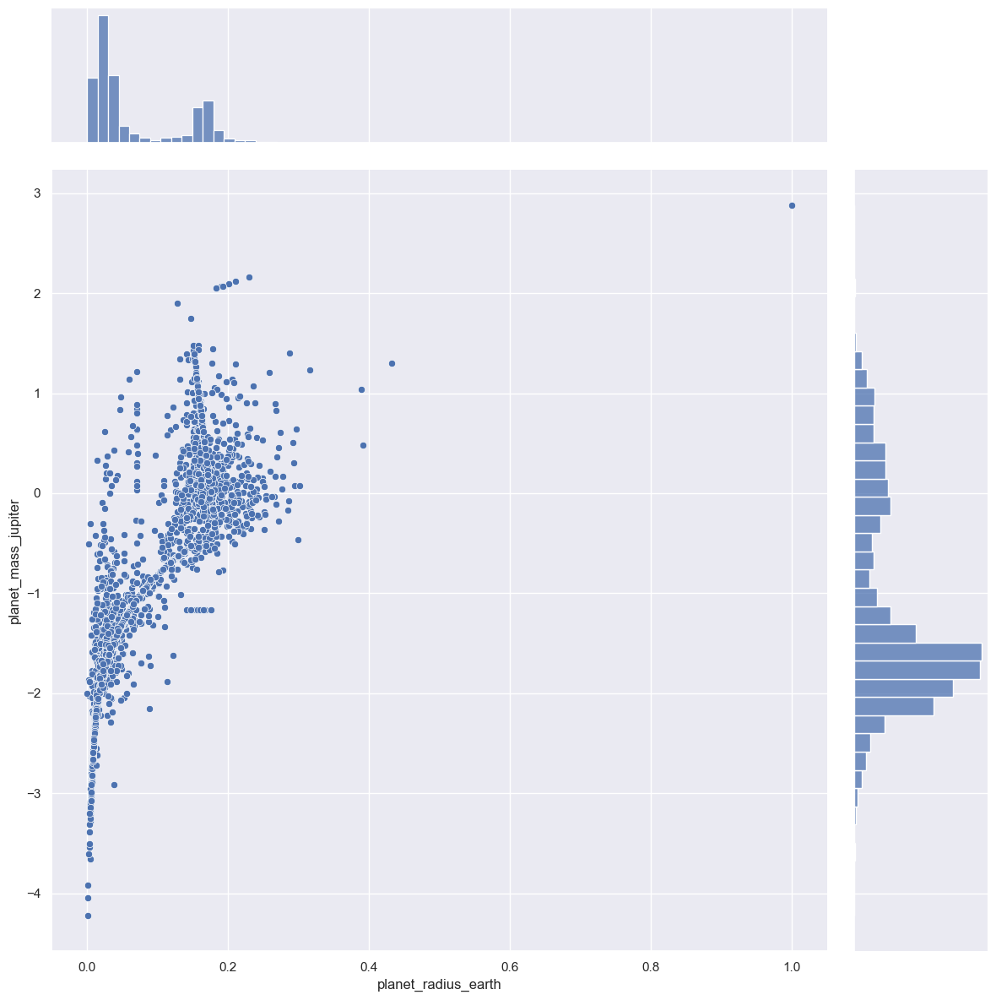

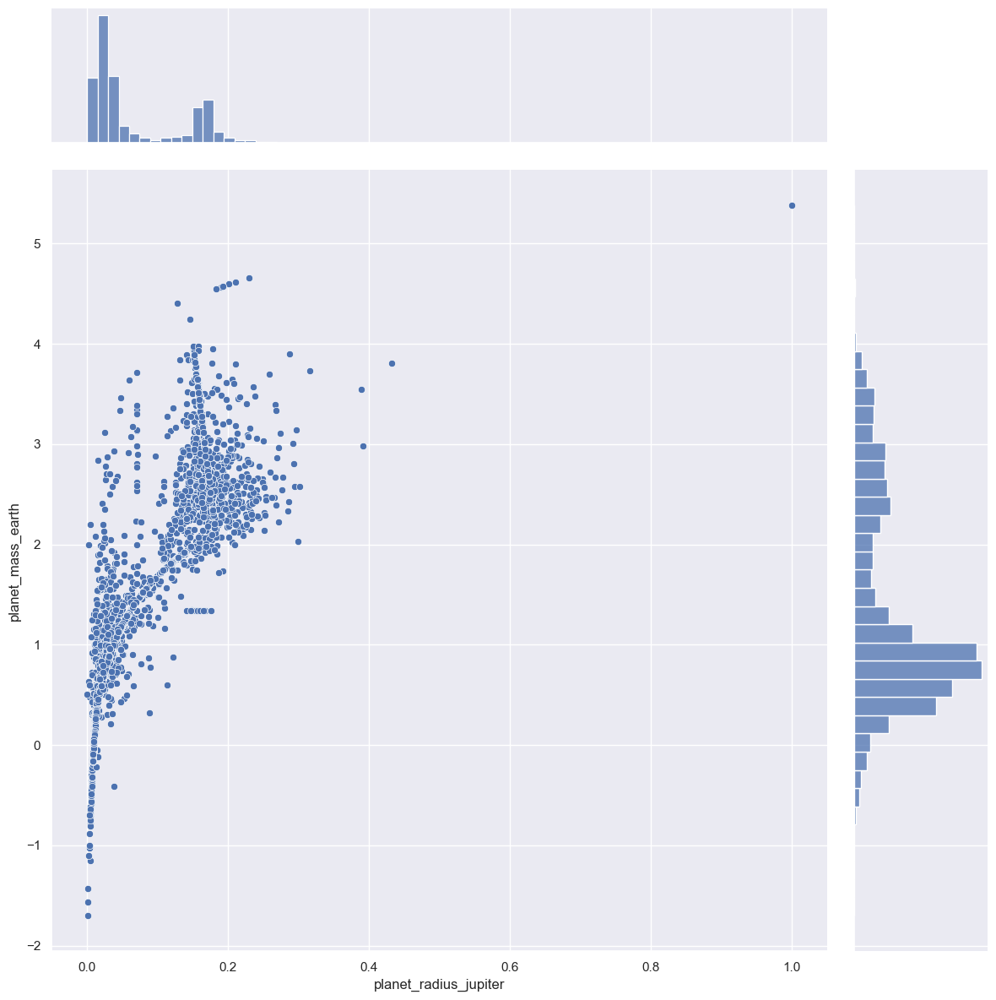

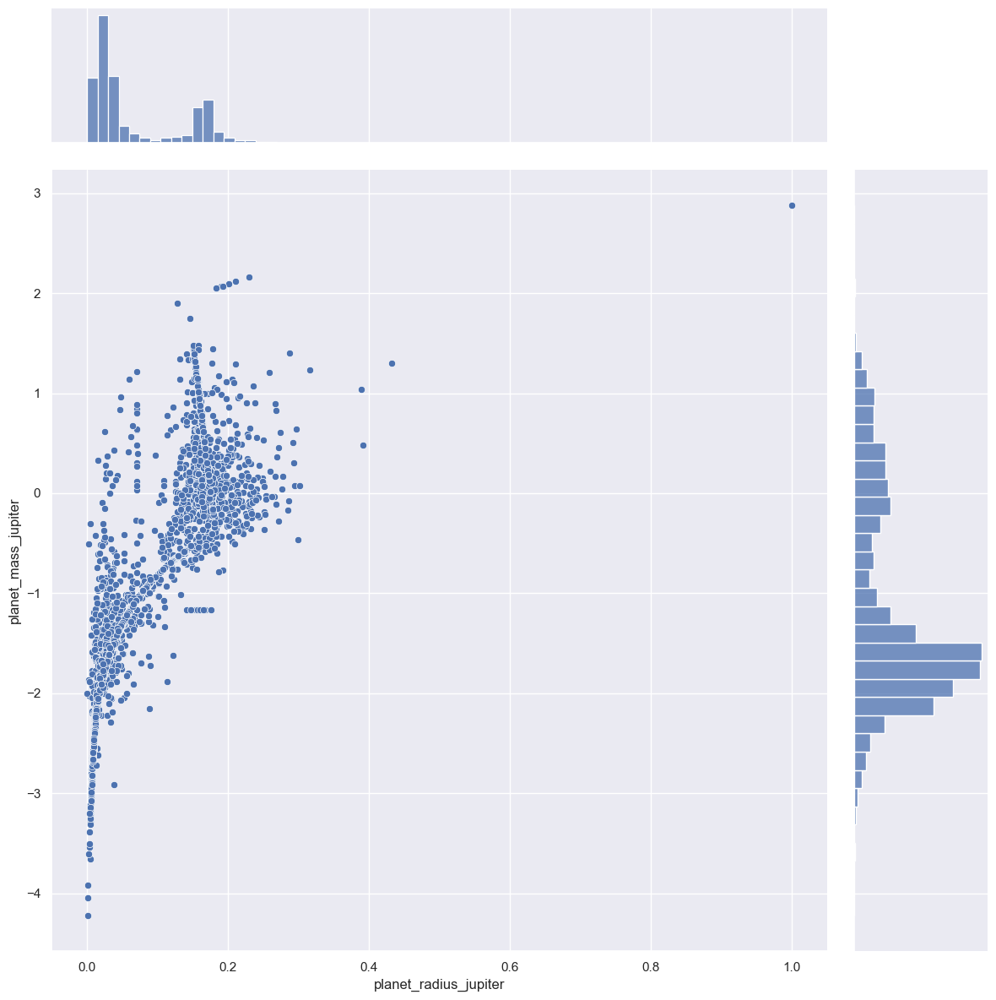

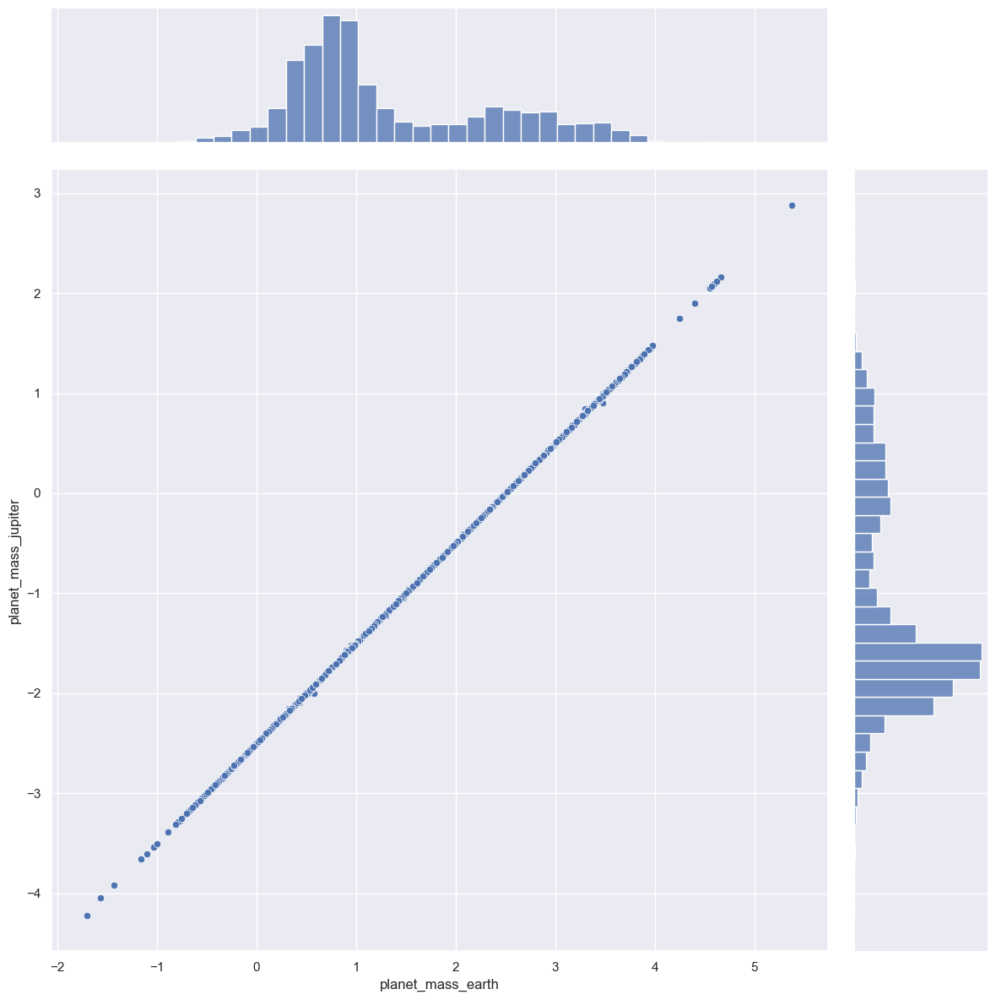

In [45]:
# Jointplot (Iterative Computation)
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_iter_planet.columns) for var2 in df_num_iter_planet.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_iter_planet, x=var1, y=var2, height = 12)

We can see that the graphs are not so different between imperative imputation compare to dropping all the null values

## Bivariate Analysis (Planet Attributes) - Numerical vs Categorical

In [46]:
# # Unaltered Data
# combos = []
# for col1 in df_num_imp_planet:
#     for col2 in df_cat_imp:
#         combos.append((col1, col2))
# for num_col, cat_col in combos:
#     f, axes = plt.subplots(figsize=(20,12))
#     sns.barplot(x=df_cat_imp[cat_col], y=df_num_imp_planet[num_col])

C:\Users\alexa\AppData\Local\Temp\ipykernel_9692\308411009.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(figsize=(20,12))


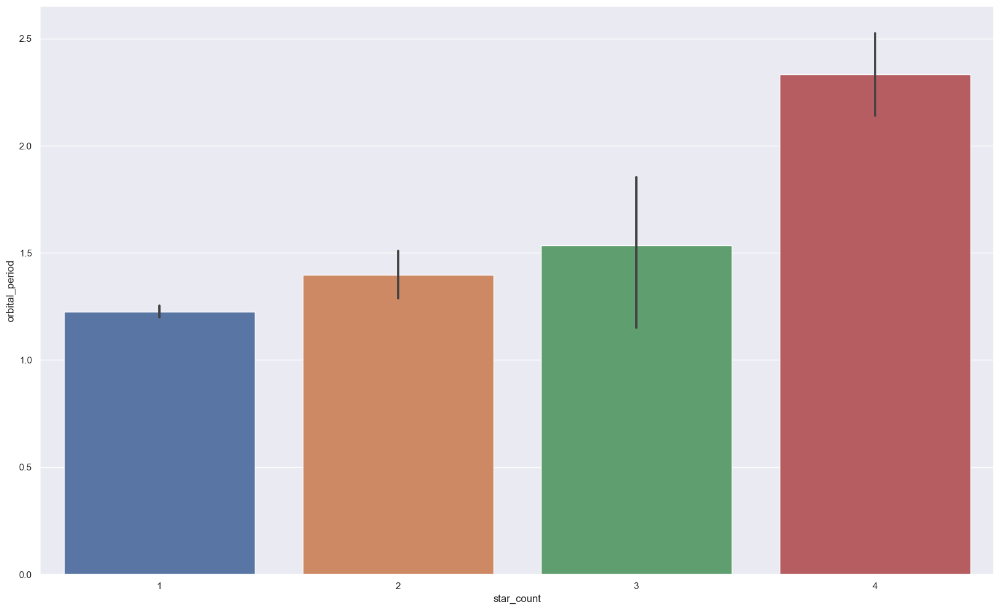

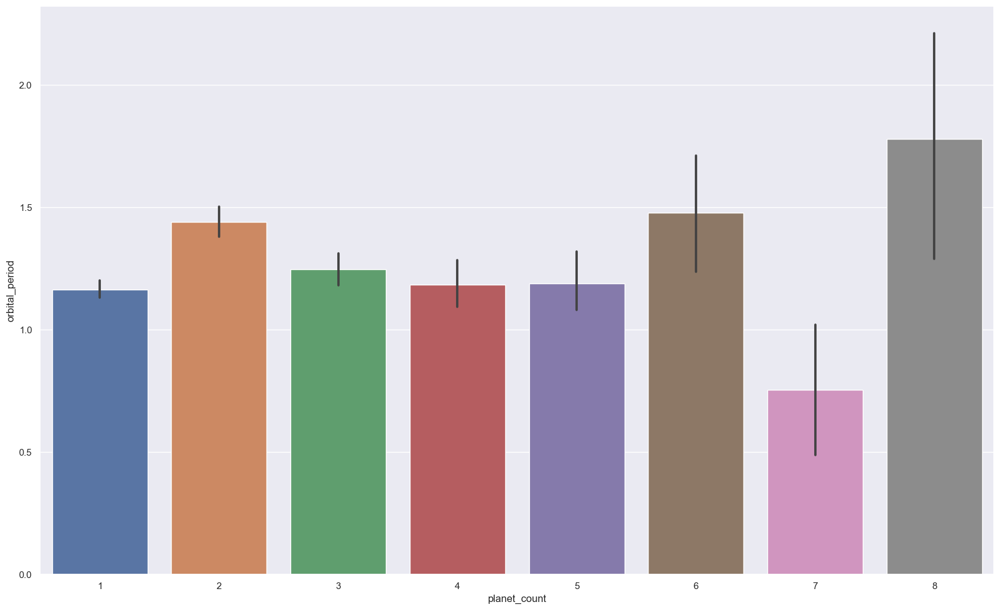

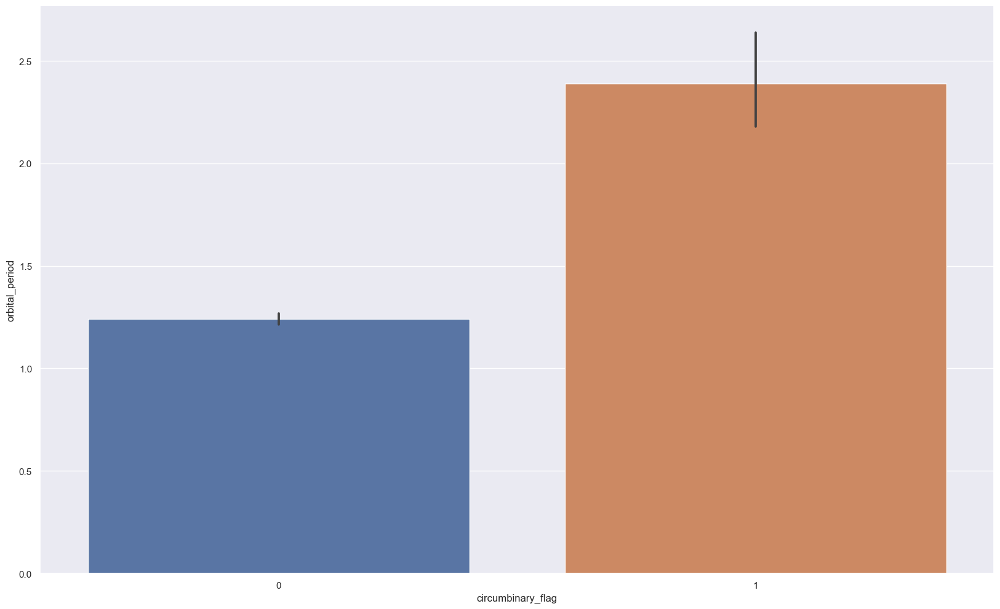

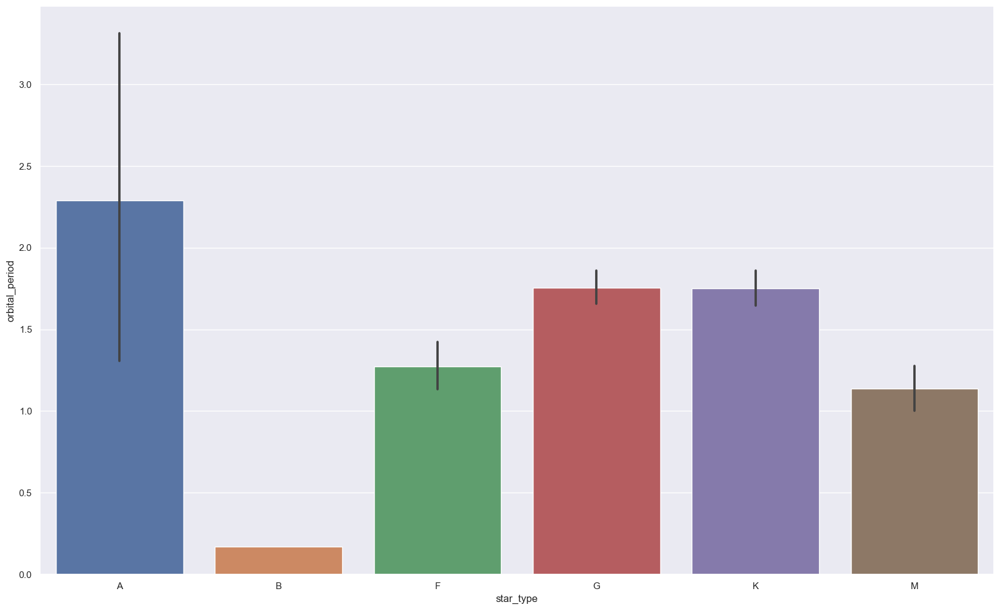

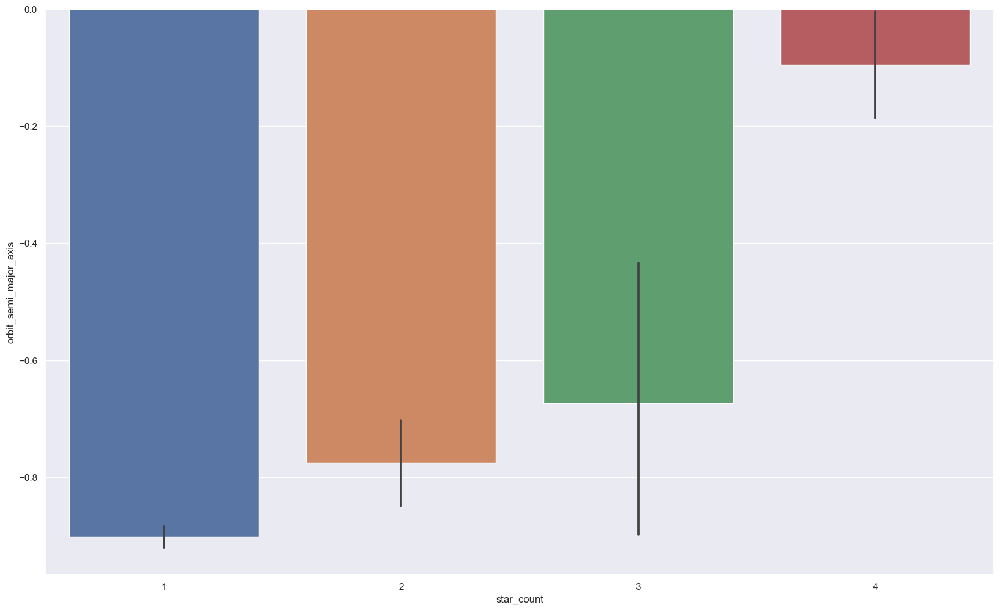

...

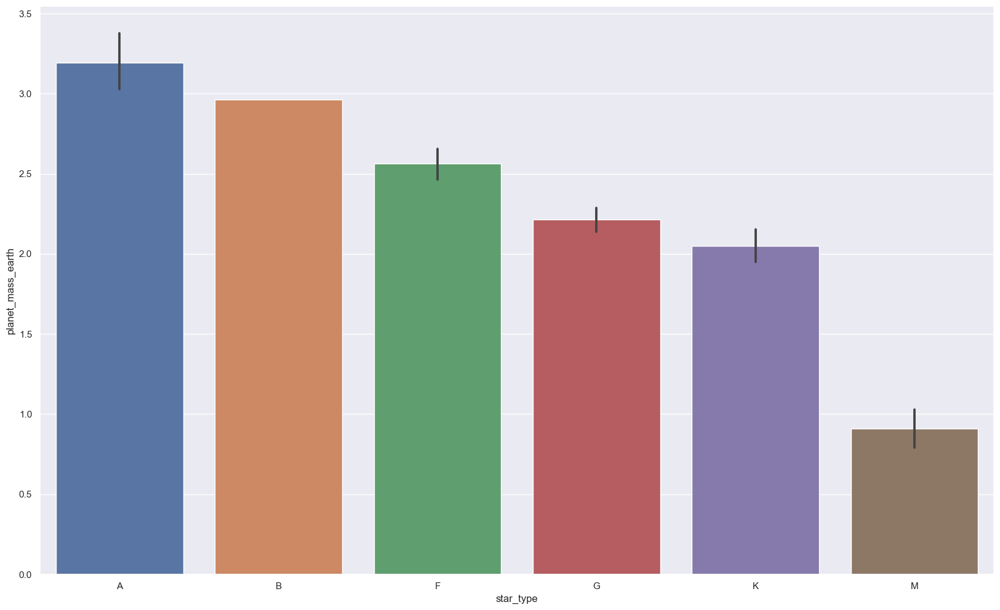

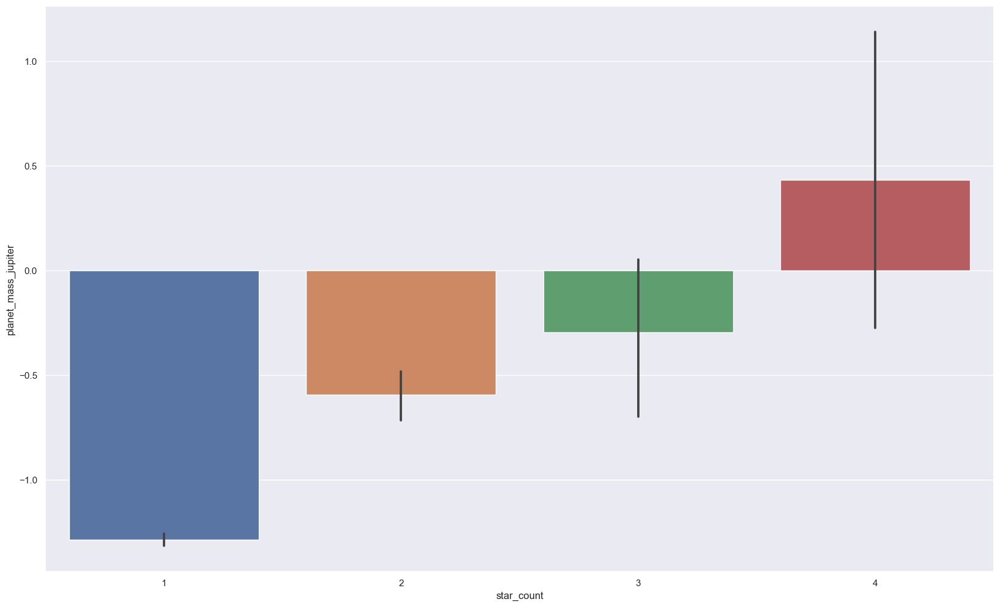

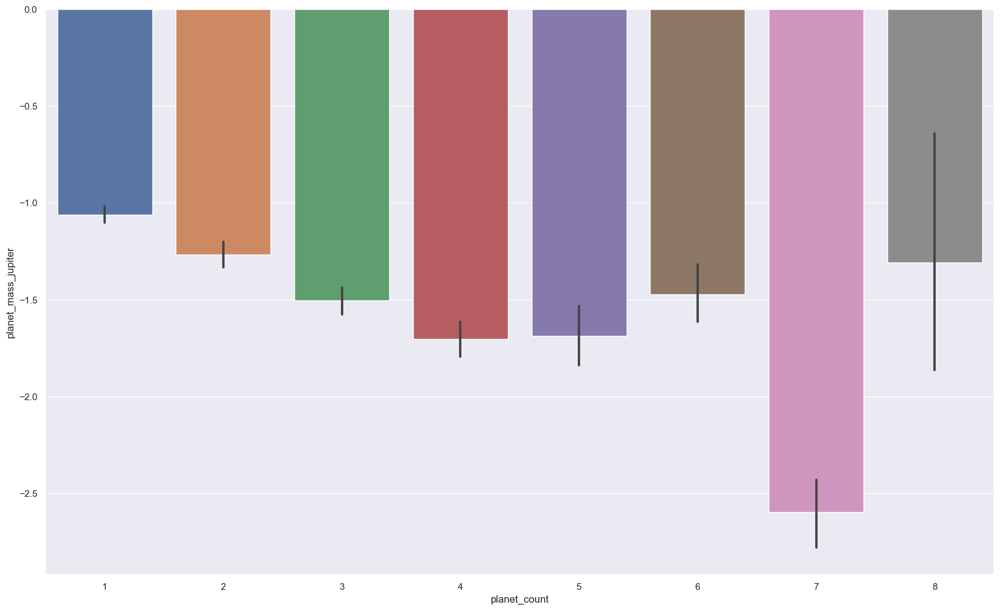

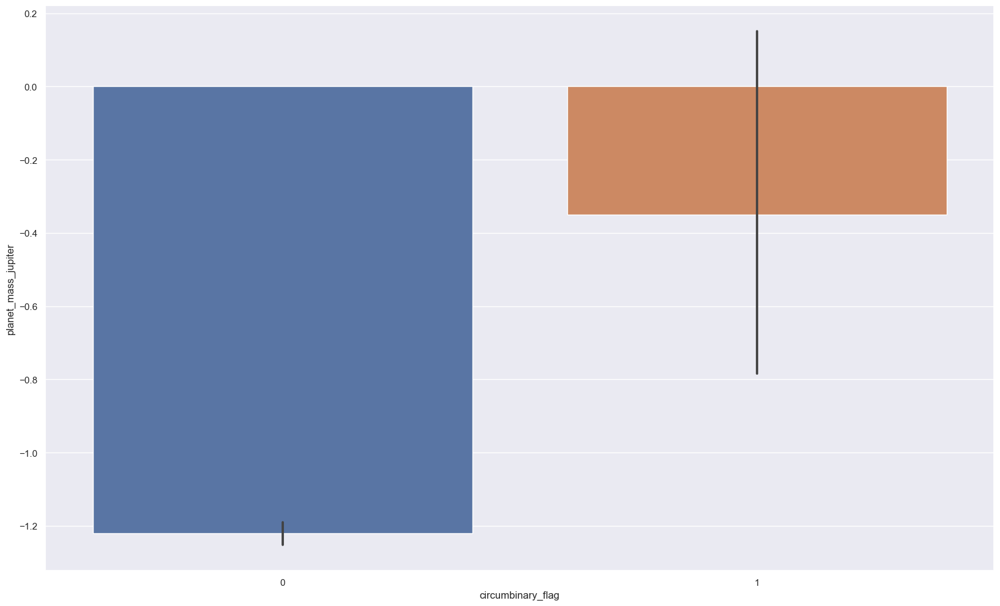

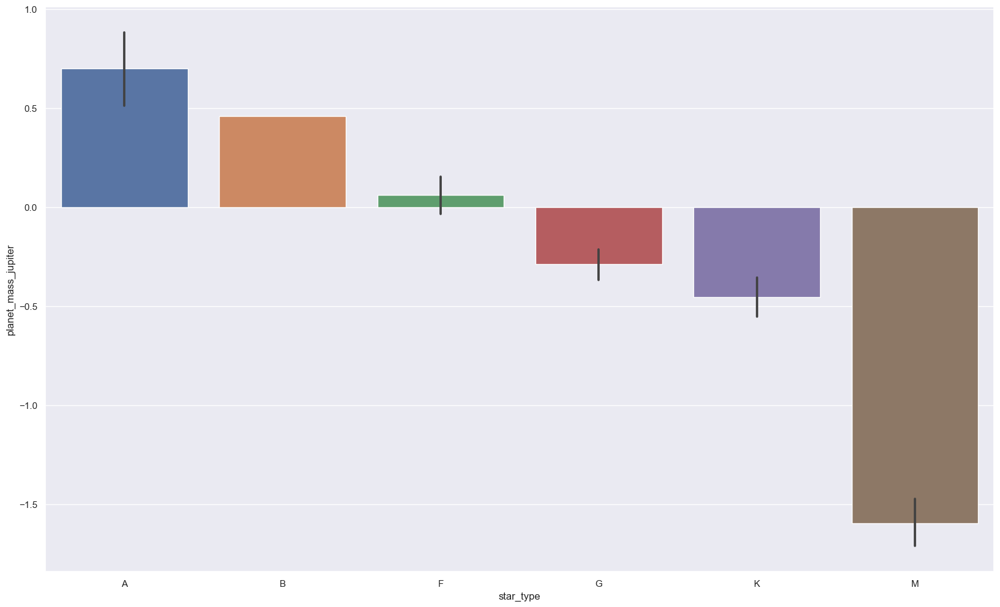

In [47]:
# Dropping Null Values
combos = []
for col1 in df_num_null_planet:
    for col2 in df_cat_imp:
        combos.append((col1, col2))
for num_col, cat_col in combos:
    f, axes = plt.subplots(figsize=(20,12))
    sns.barplot(x=df_cat_imp[cat_col], y=df_num_null_planet[num_col])

C:\Users\alexa\AppData\Local\Temp\ipykernel_9692\175628953.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(figsize=(20,12))


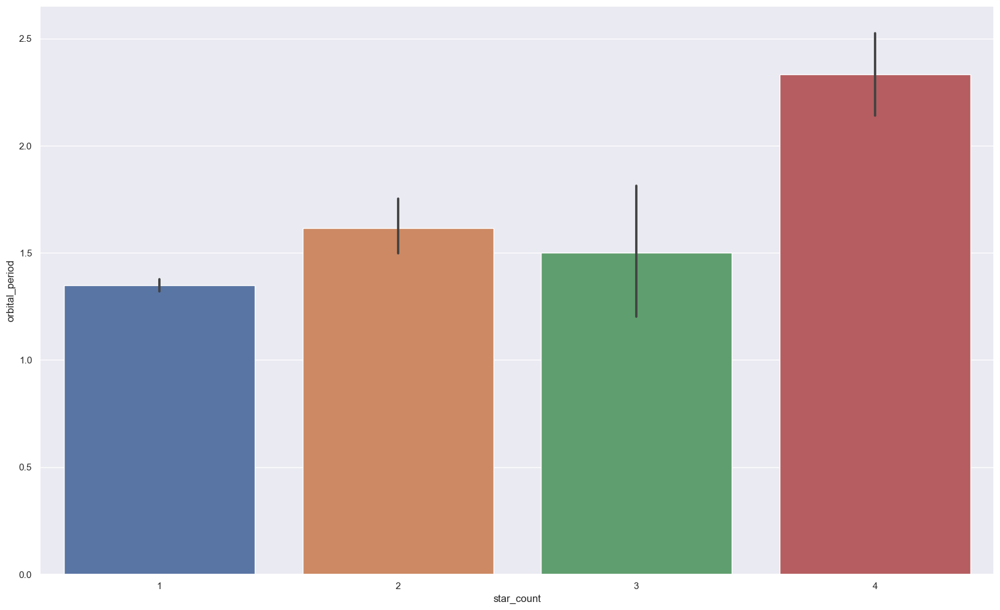

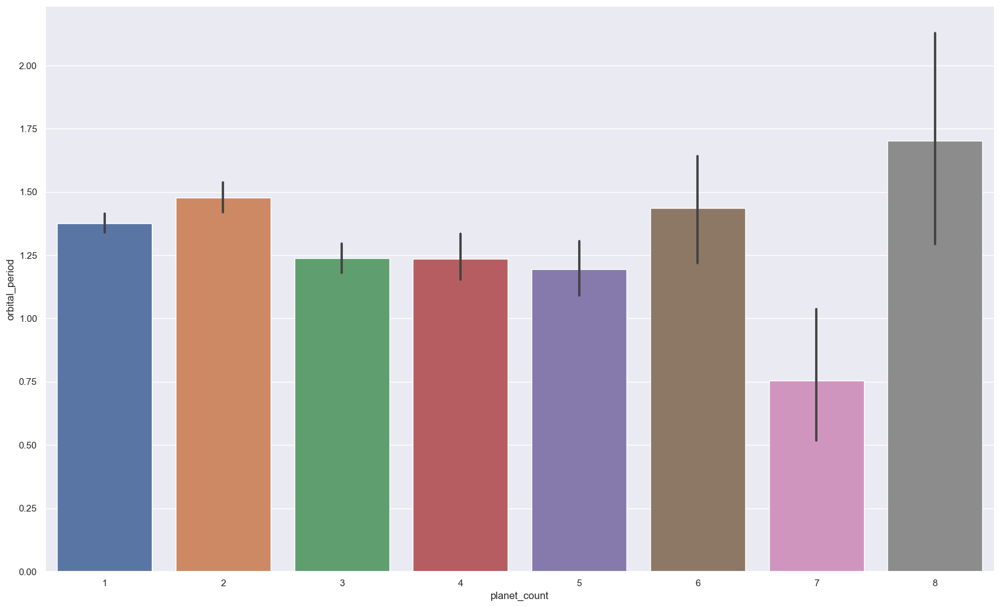

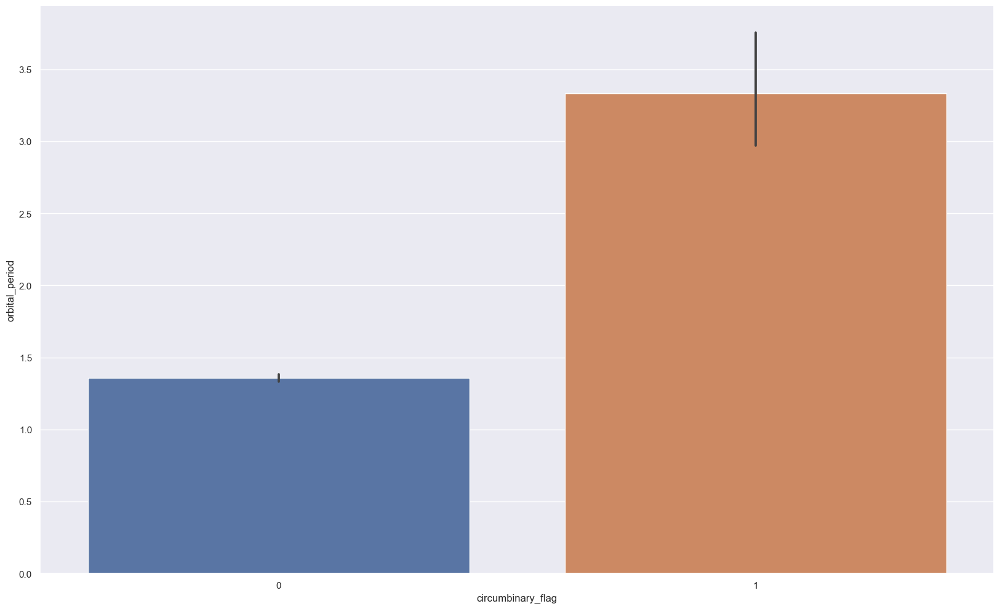

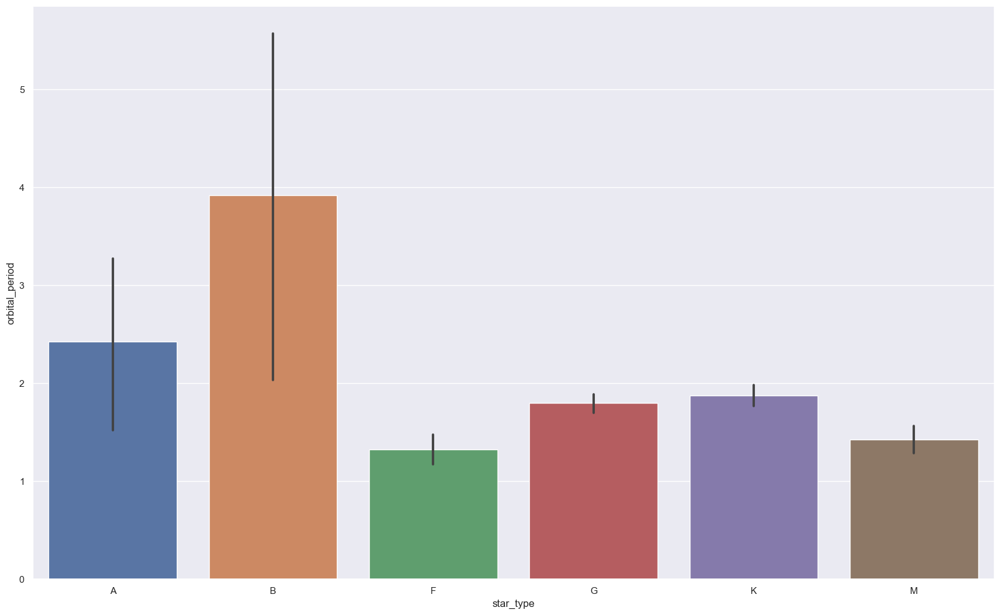

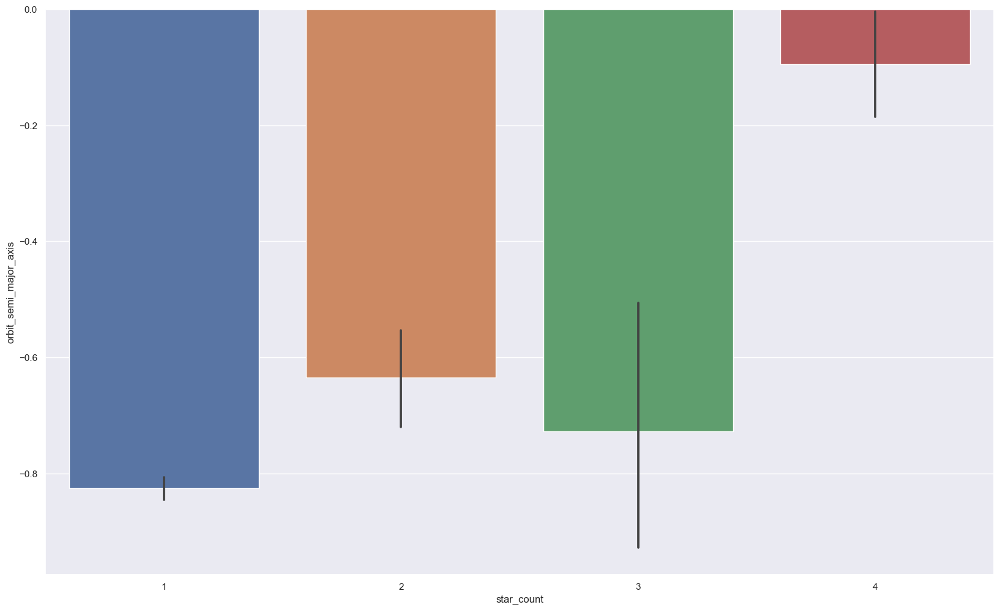

...

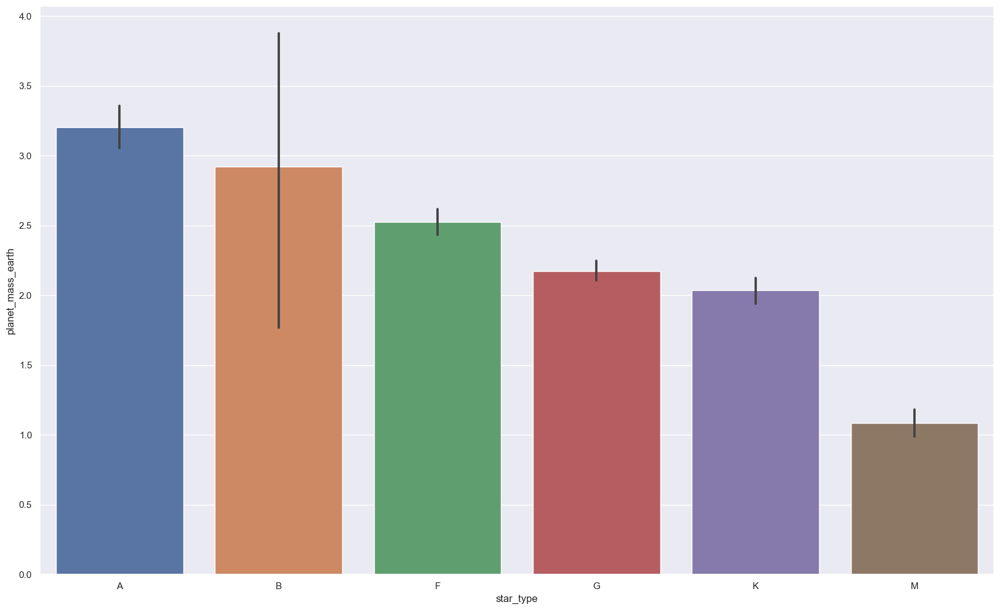

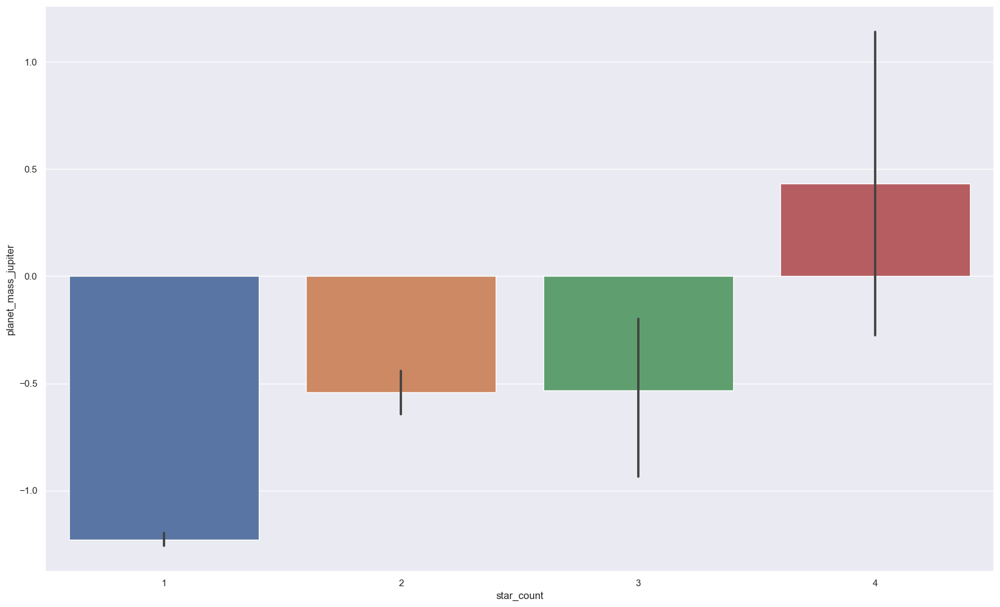

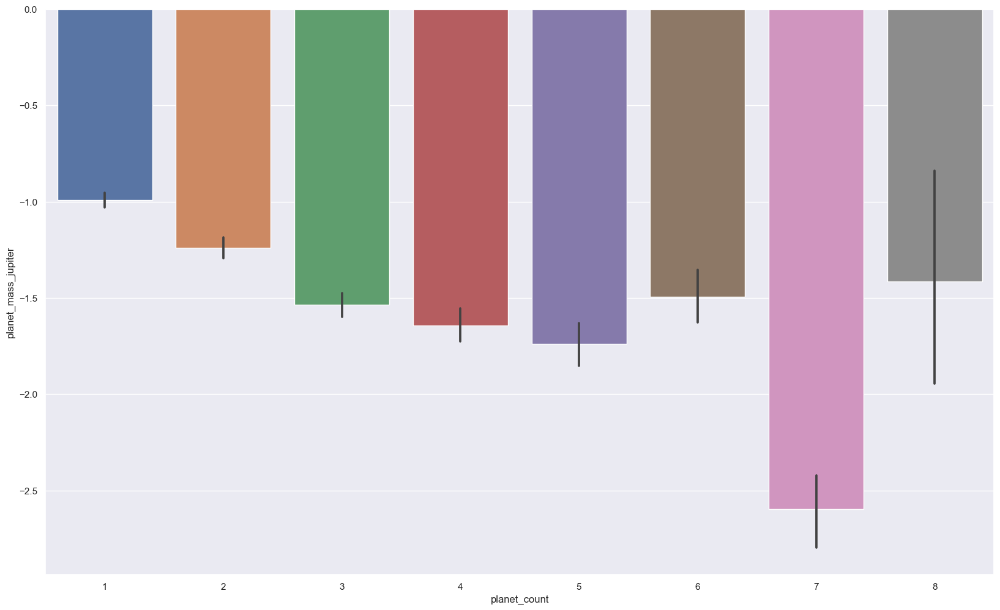

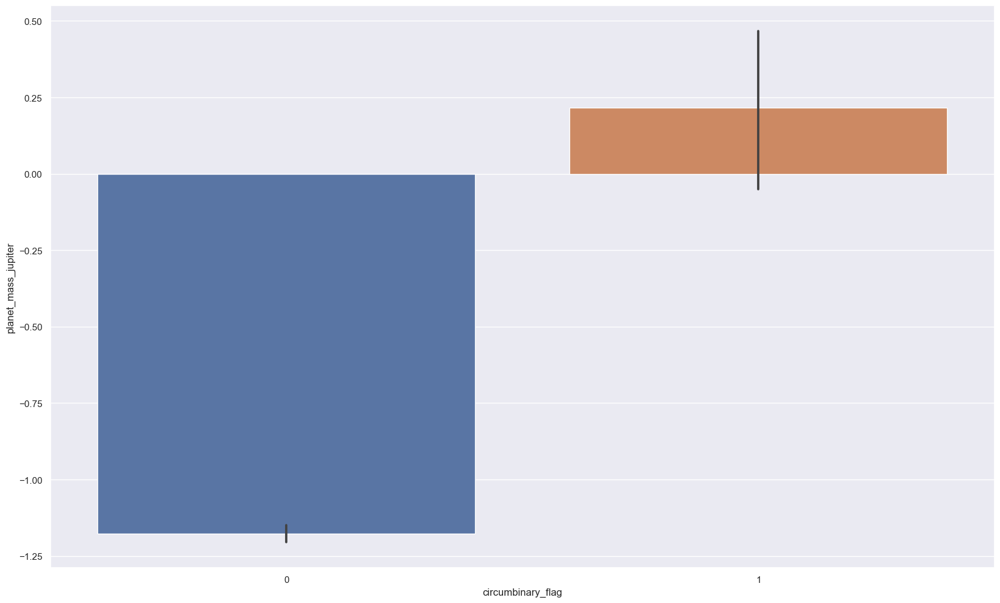

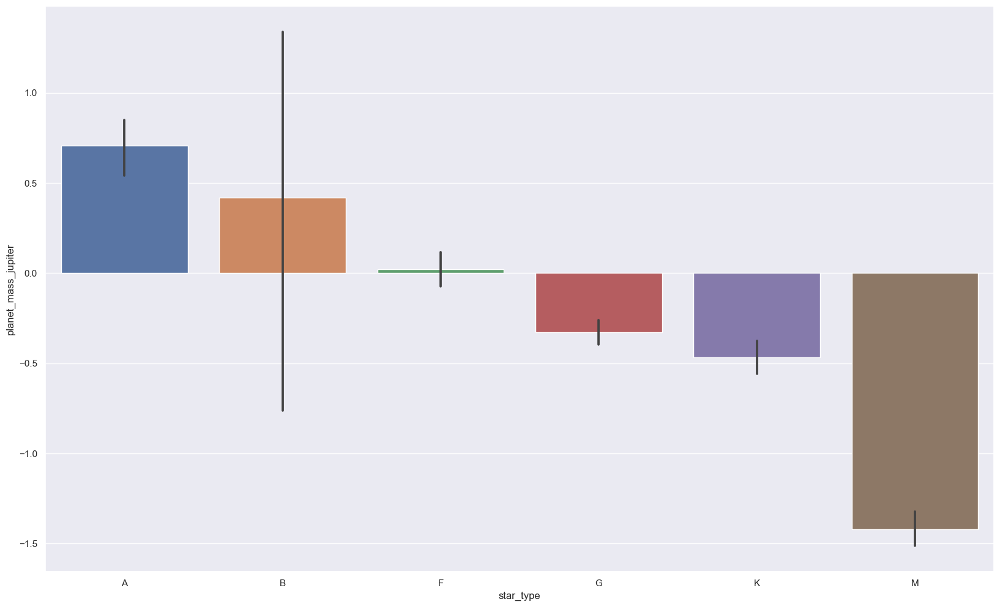

In [48]:
# Iterative Imputation
combos = []
for col1 in df_num_iter_planet:
    for col2 in df_cat_imp:
        combos.append((col1, col2))
for num_col, cat_col in combos:
    f, axes = plt.subplots(figsize=(20,12))
    sns.barplot(x=df_cat_imp[cat_col], y=df_num_iter_planet[num_col])

From observation:
1. 

## Multivariate Analysis (Planet Attributes) - Numerical

Draw the heatmap correlation

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Planet Attributes from Unaltered Data')

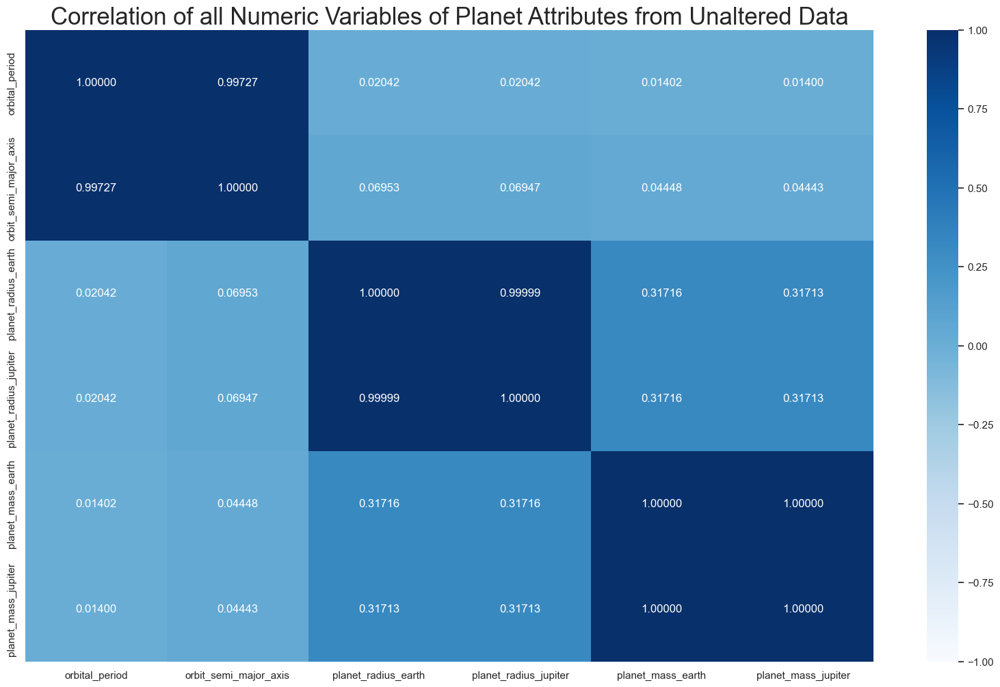

In [49]:
# Unaltered Data
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_imp_planet.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Planet Attributes from Unaltered Data", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Planet Attributes from Dropping null values')

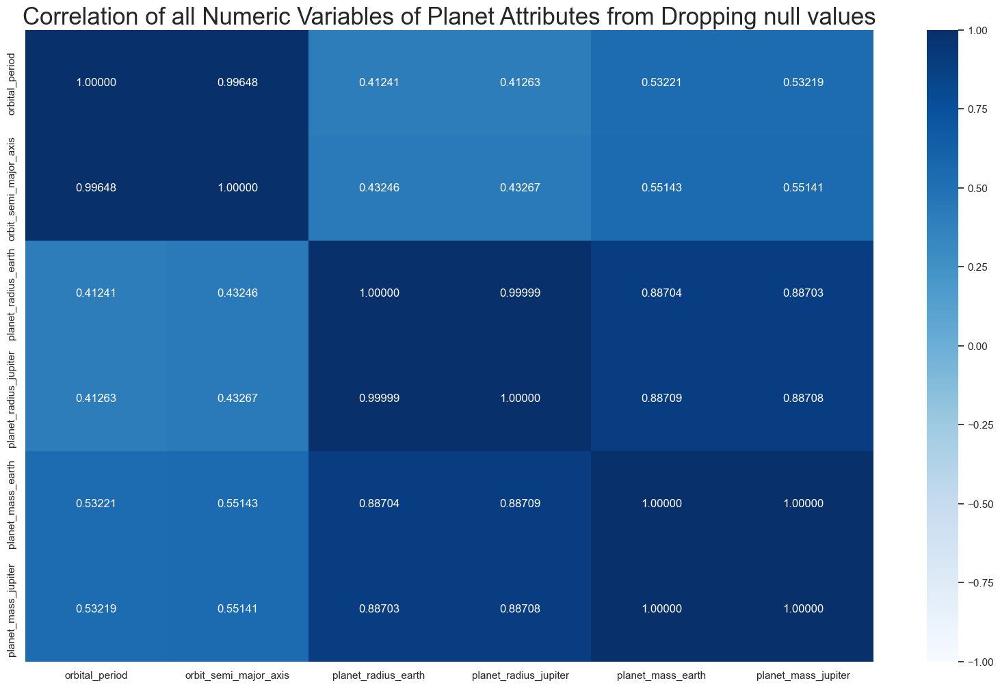

In [50]:
# Dropping null values
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_iter_planet.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Planet Attributes from Dropping null values", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Planet Attributes from Iterative Imputation')

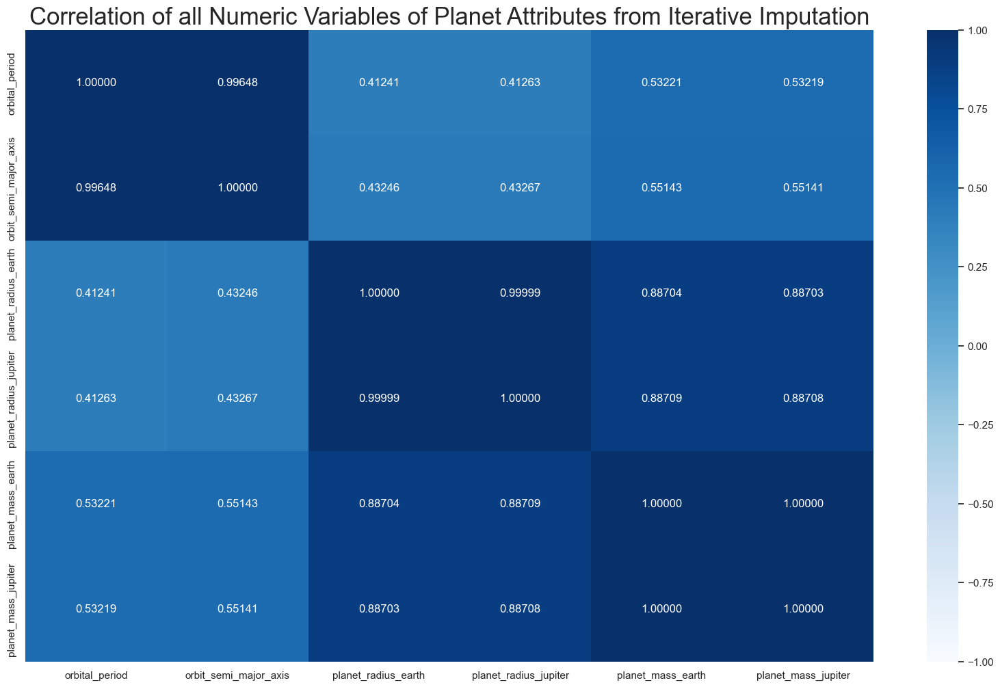

In [51]:
# Iterative Imputation
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_iter_planet.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Planet Attributes from Iterative Imputation", size = 25)

We can see that some correlation is higher when we use interative imputation compared to dropping all null values, however some variables have lower correlation when using interative imputation

Some variables have very high correlation, such as:
1. Orbital Period & Orbit Semi Major Axis
2. Mass and Radius (can be explained by the Law of Conservation of Angular Momentum)

However, the correlation are very different when compared to the unaltered dataset

Our heatmap also proves that earth and jupiter are just measurement units since their correlation is 1 or almost 1

## Bivariate Analysis (Star Attributes) - Numerical

In [52]:
important_num_star = ['stellar_effective_temperature','stellar_radius','stellar_mass','stellar_luminosity','stellar_age']

In [53]:
df_num_imp_star = df_num[important_num_star] # not normalized, null not dropped
df_num_null_star = df_num_null[important_num_star] # normalized, null dropped
df_num_iter_star = df_num_iter[important_num_star] # normalized, null iterative imputing

### Unaltered Data

In [54]:
df_num_imp_star.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   stellar_effective_temperature  5133 non-null   float64
 1   stellar_radius                 5113 non-null   float64
 2   stellar_mass                   5318 non-null   float64
 3   stellar_luminosity             5118 non-null   float64
 4   stellar_age                    4181 non-null   float64
dtypes: float64(5)
memory usage: 208.0 KB


In [55]:
df_num_imp_star.describe()

,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age
count,5133.000000,5113.000000,5318.000000,5118.000000,4181.000000
mean,5446.527960,1.539871,0.958947,-0.105842,4.349744
std,1806.120872,4.061370,0.450336,0.754491,3.055806
min,575.000000,0.010000,0.010000,-6.090000,0.000000
25%,4955.000000,0.780000,0.790000,-0.438000,2.353000
50%,5564.000000,0.960000,0.950000,-0.058000,3.980000
75%,5905.000000,1.250000,1.090000,0.323000,5.250000
max,57000.000000,109.460000,10.940000,3.800000,14.900000


In [56]:
# # Jointplot (Unaltered Data)
# var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_imp_star.columns) for var2 in df_num_imp_star.columns[i+1:]]
# for var1, var2 in var_combinations:
#     sns.jointplot(data=df_num_imp_star, x=var1, y=var2, height = 12)

### Dropping Null Values

In [57]:
df_num_null_star.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4030 entries, 1 to 5321
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   stellar_effective_temperature  4030 non-null   float64
 1   stellar_radius                 4030 non-null   float64
 2   stellar_mass                   4030 non-null   float64
 3   stellar_luminosity             4030 non-null   float64
 4   stellar_age                    4030 non-null   float64
dtypes: float64(5)
memory usage: 188.9 KB


In [58]:
df_num_null_star.describe()

,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age
count,4030.000000,4030.000000,4030.000000,4030.000000,4030.000000
mean,3.732954,0.025591,0.090536,-0.042276,0.296832
std,0.066150,0.262583,0.036316,0.677060,0.204197
min,3.365488,-2.000000,0.000000,-4.120000,0.000000
25%,3.707570,-0.091515,0.075938,-0.377000,0.167785
50%,3.749702,-0.004365,0.087832,0.002000,0.268456
75%,3.773889,0.103804,0.100640,0.342000,0.360403
max,4.466868,2.039255,1.000000,3.460000,1.000000


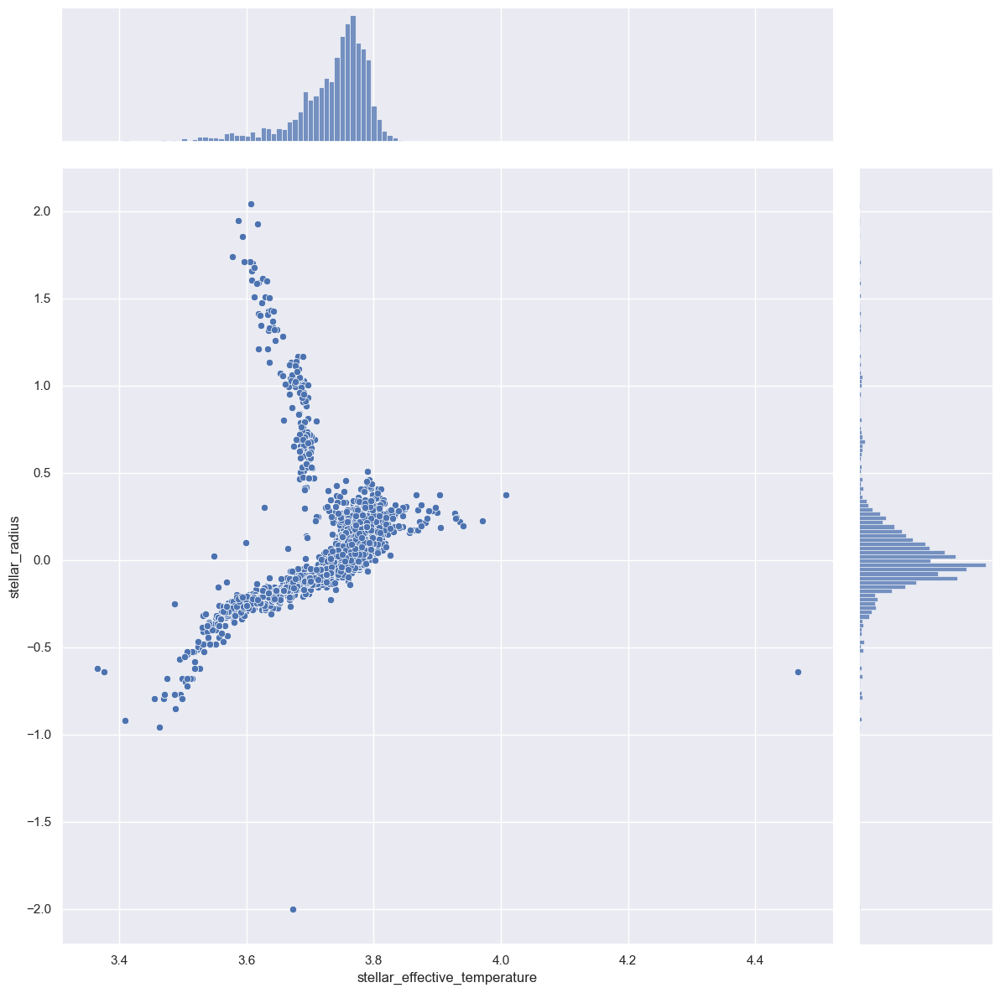

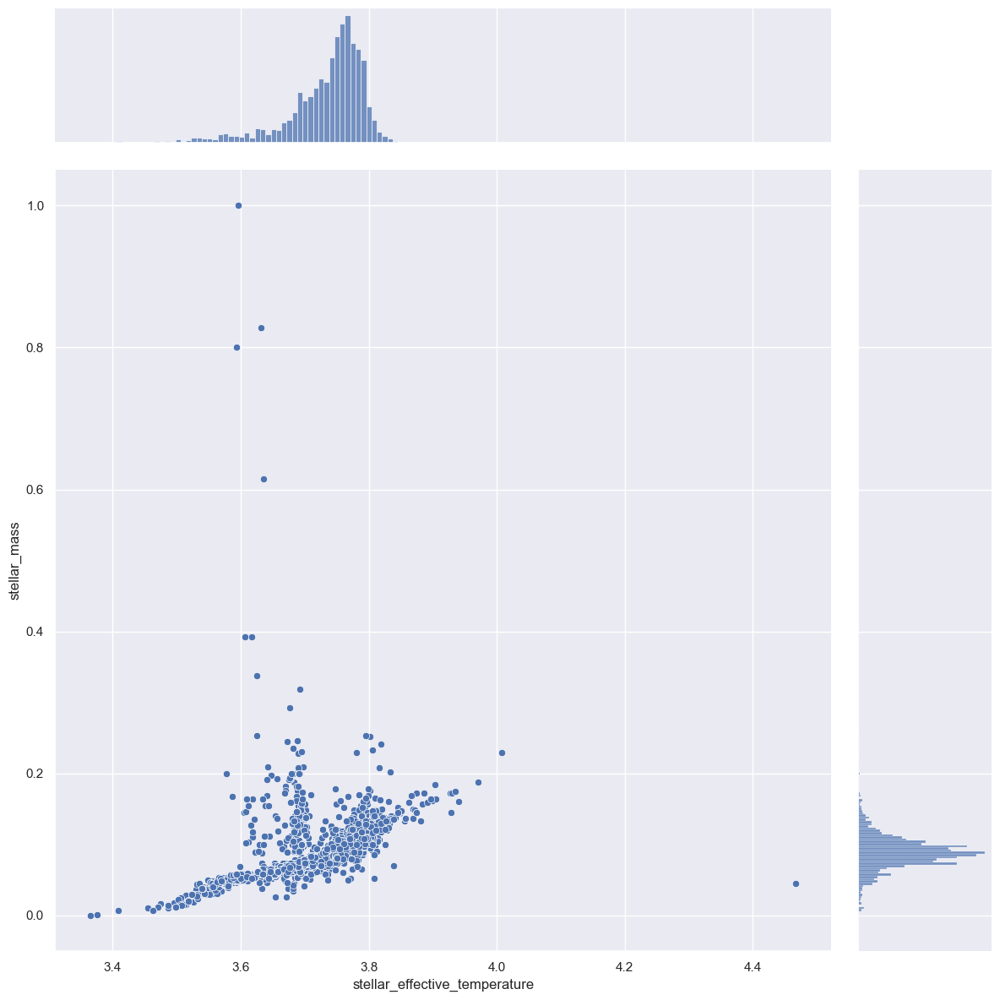

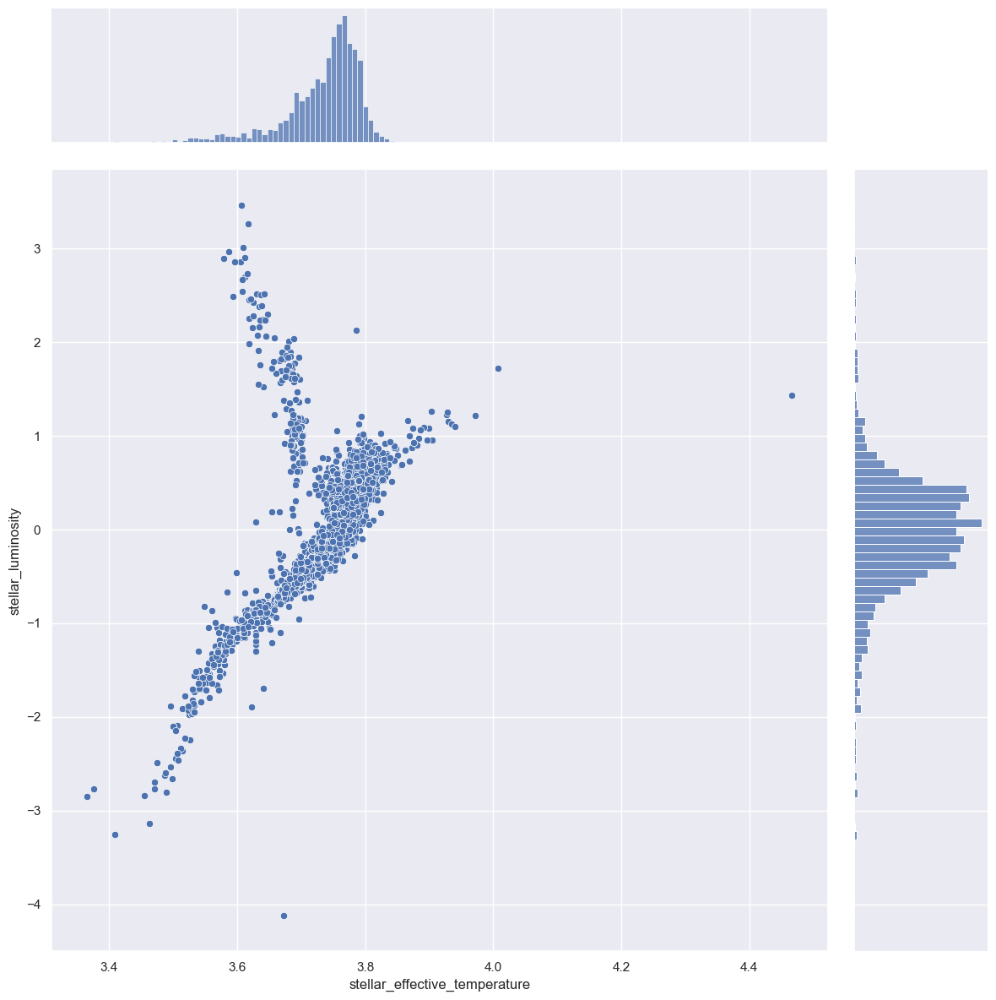

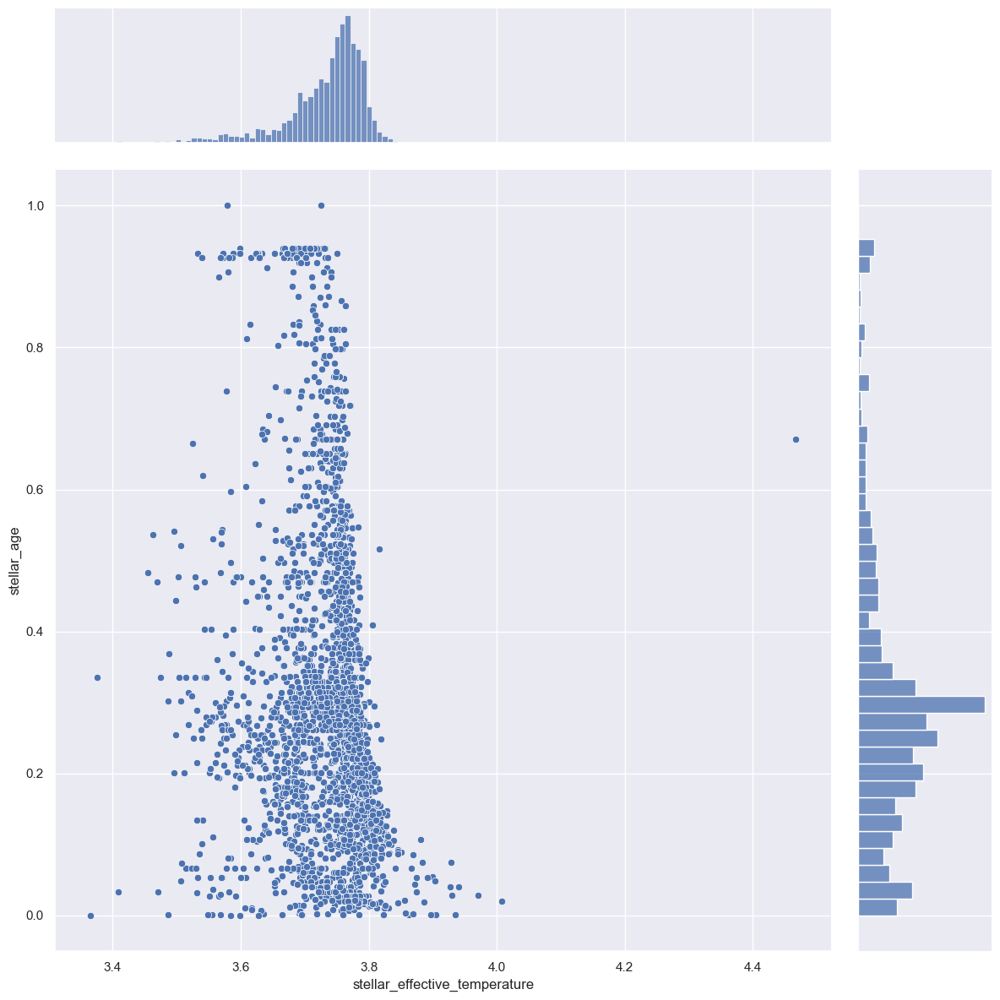

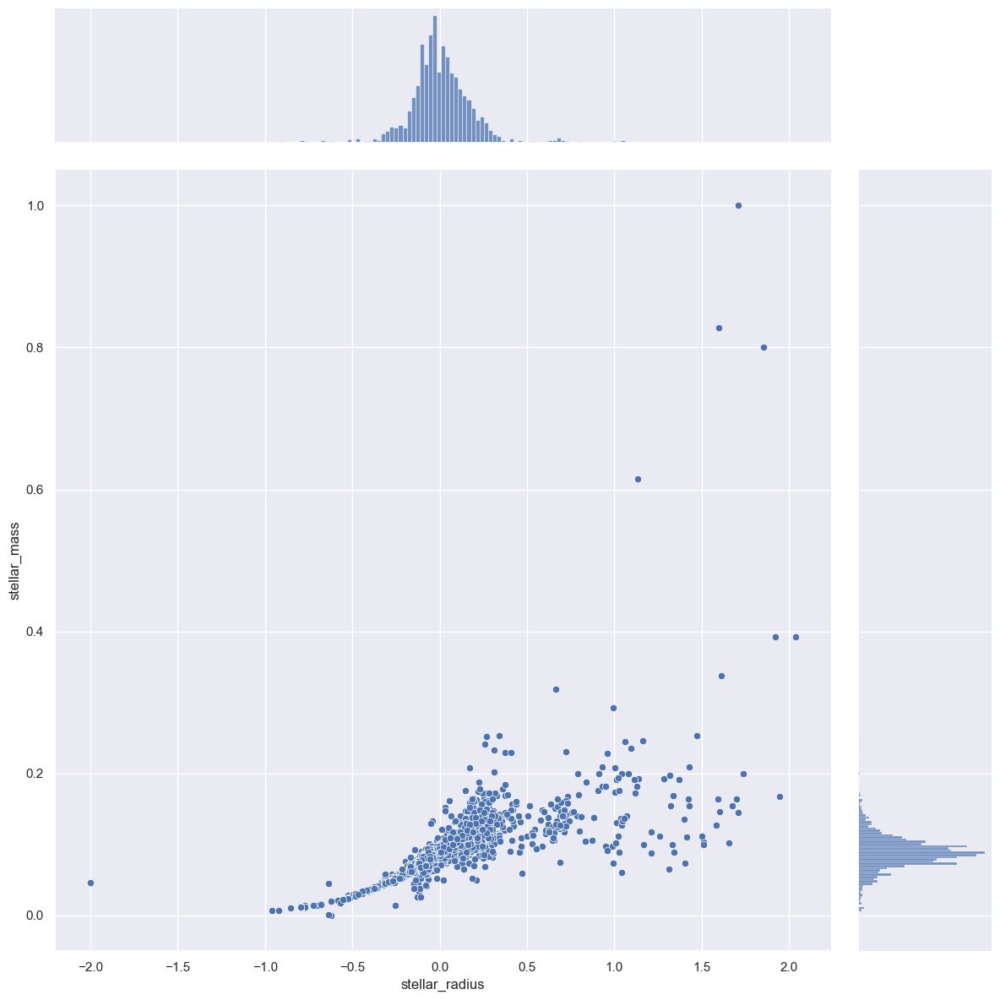

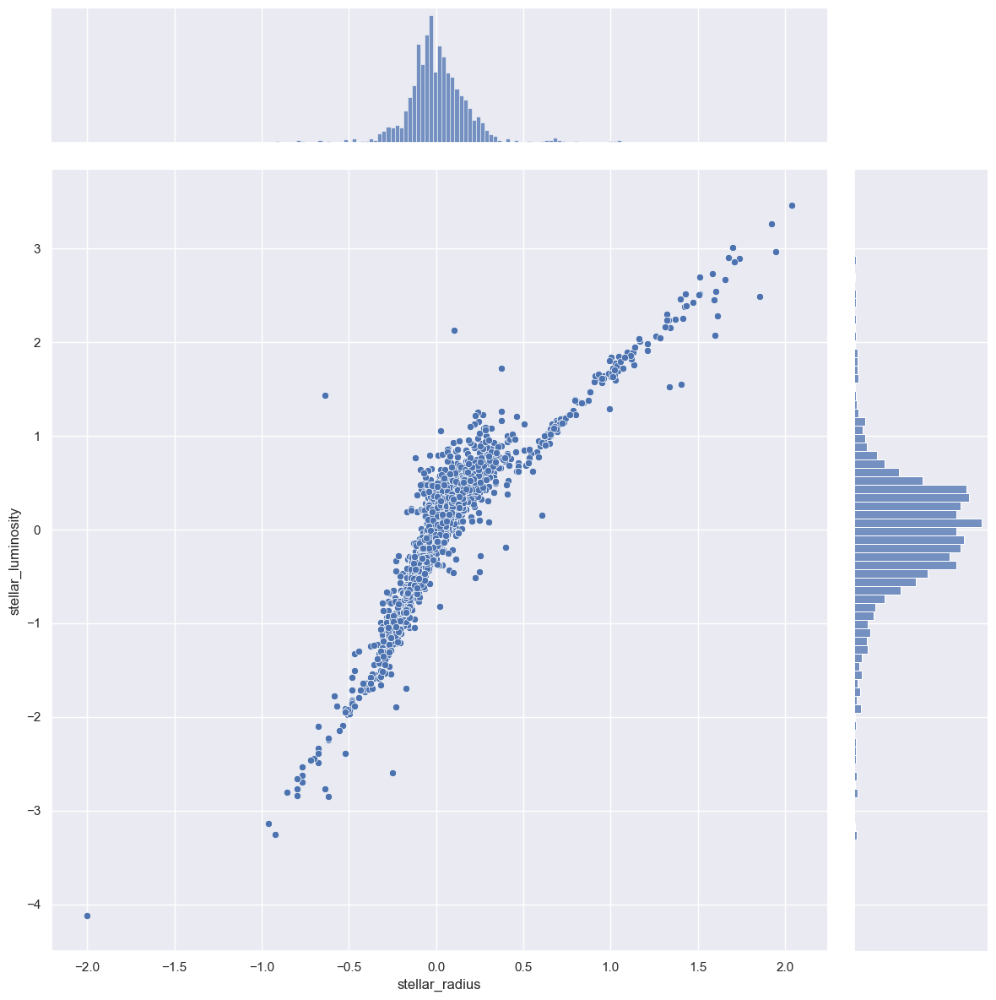

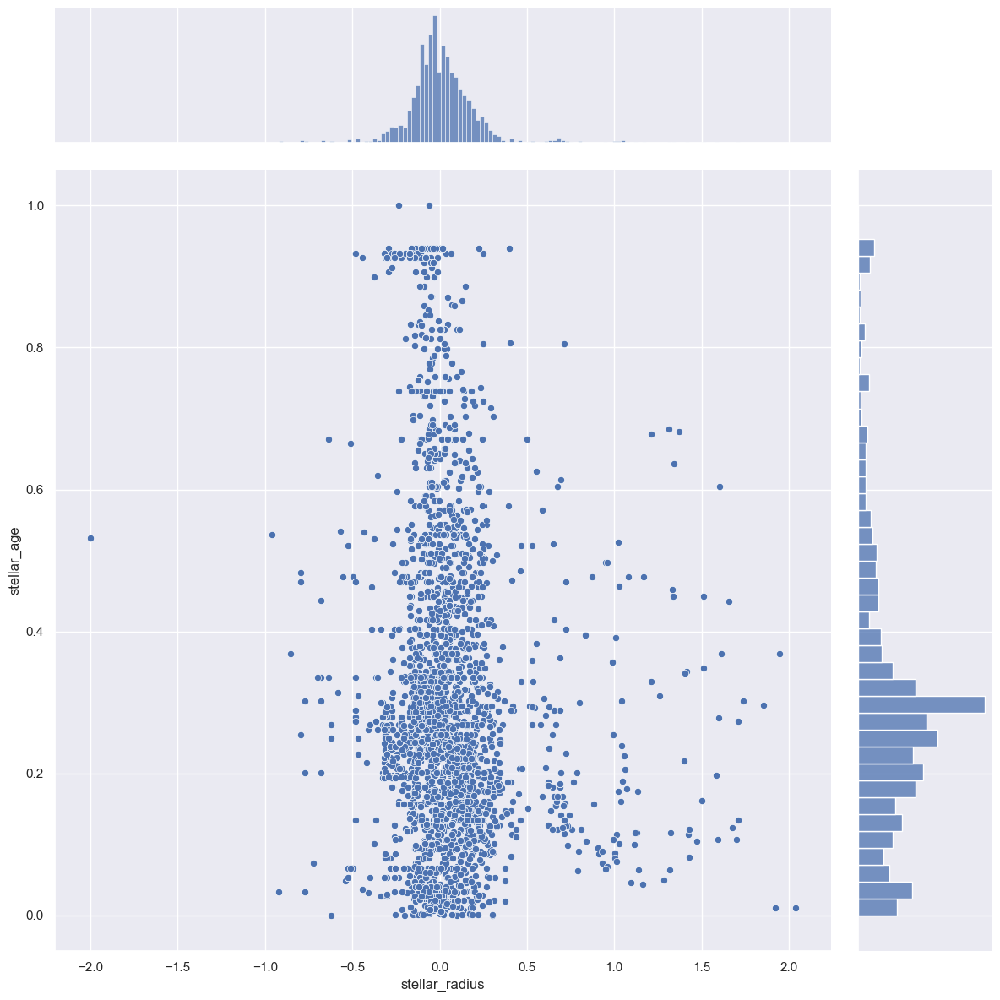

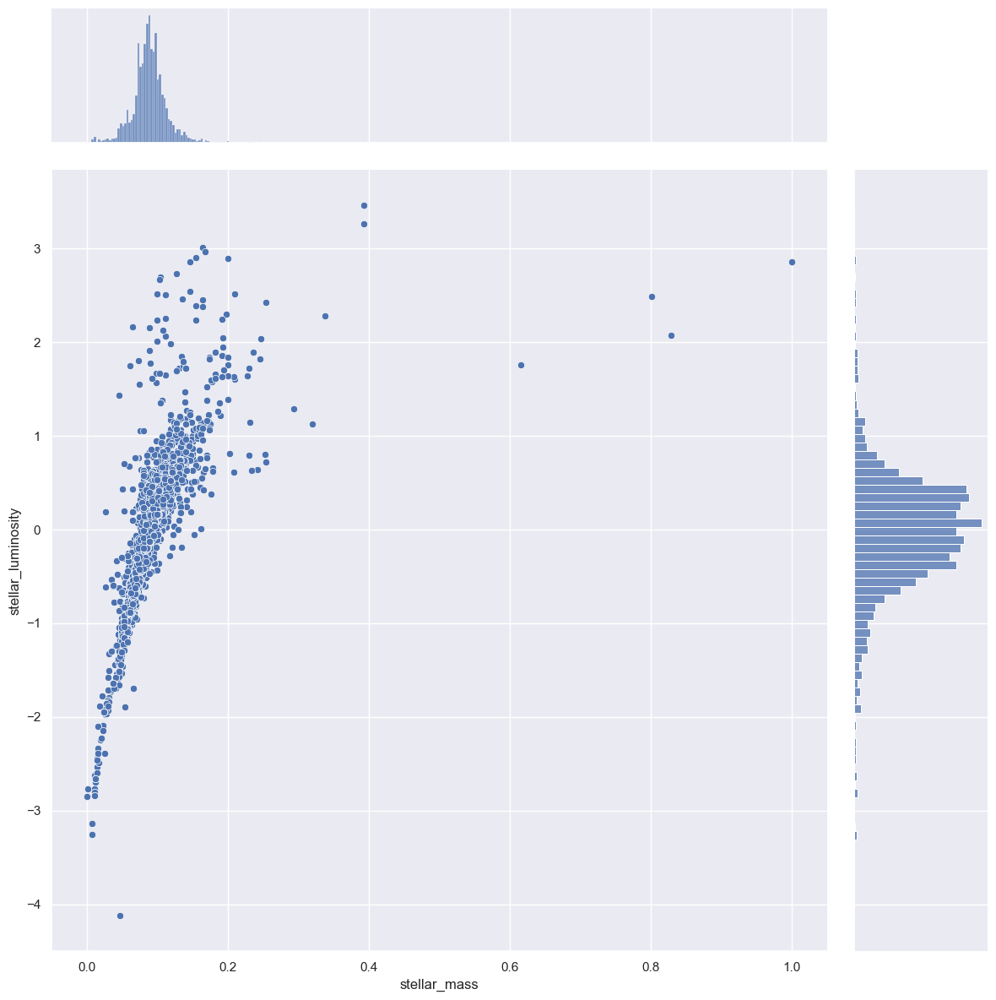

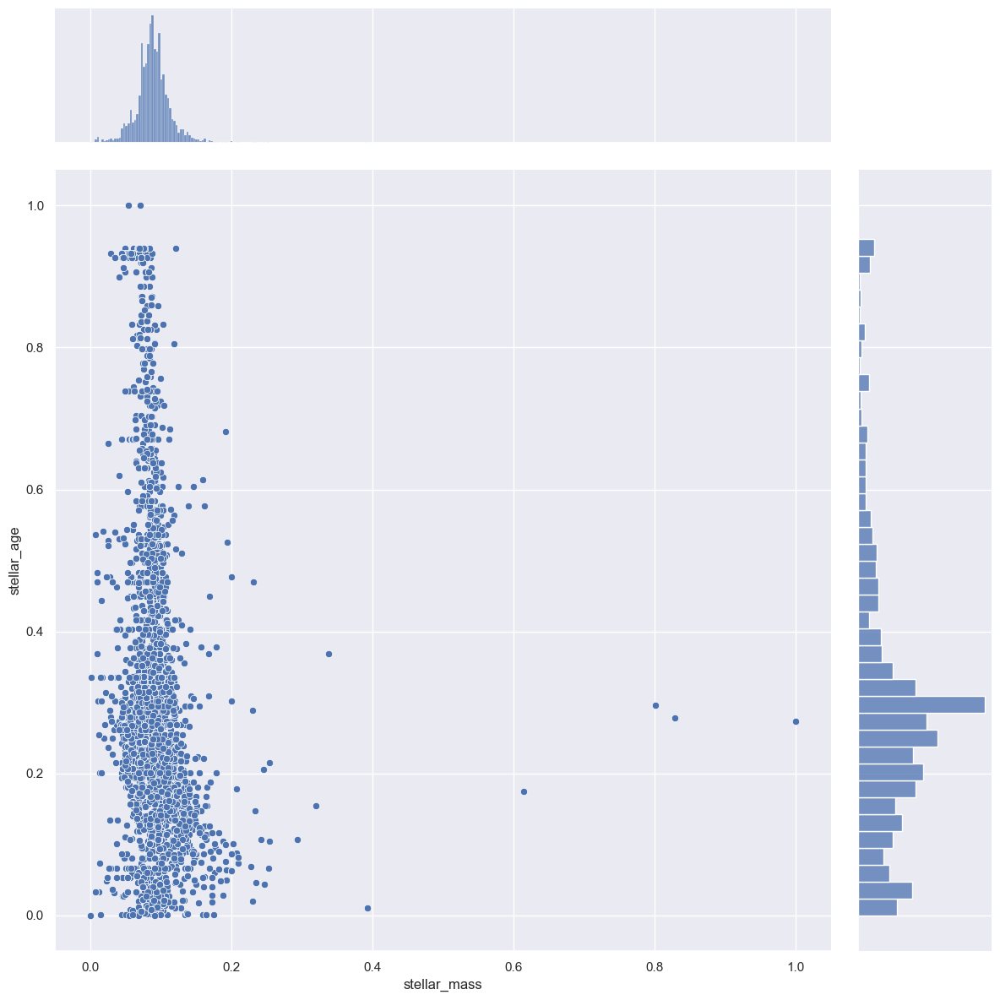

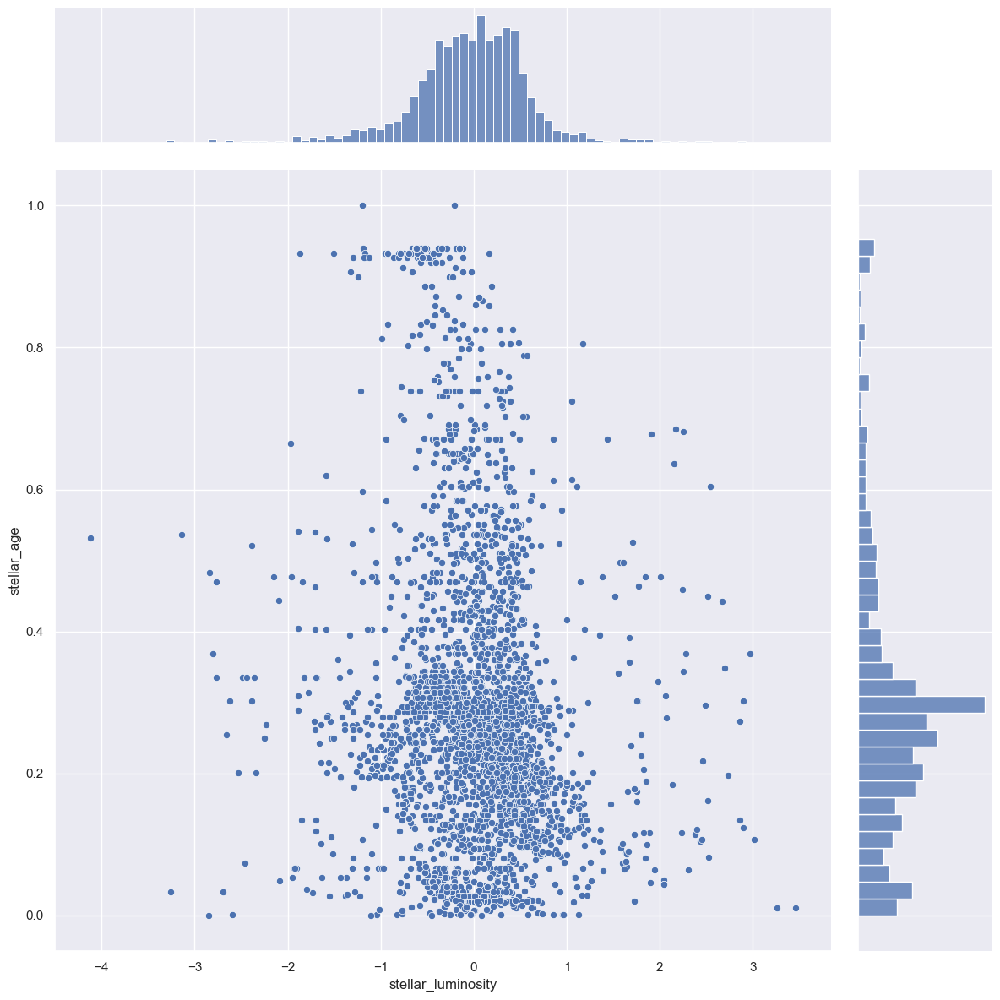

In [59]:
# Jointplot (Dropping null values
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_null_star.columns) for var2 in df_num_null_star.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_null_star, x=var1, y=var2, height = 12)

### Iterative Imputation

In [60]:
df_num_iter_star.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   stellar_effective_temperature  5322 non-null   float64
 1   stellar_radius                 5322 non-null   float64
 2   stellar_mass                   5322 non-null   float64
 3   stellar_luminosity             5322 non-null   float64
 4   stellar_age                    5322 non-null   float64
dtypes: float64(5)
memory usage: 208.0 KB


In [61]:
df_num_iter_star.describe()

,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age
count,5322.000000,5322.000000,5322.000000,5322.000000,5322.000000
mean,3.724941,0.006133,0.086826,-0.115933,0.295351
std,0.086411,0.284398,0.041187,0.756023,0.183571
min,2.759668,-2.000000,0.000000,-6.090000,-0.411332
25%,3.695657,-0.113509,0.071363,-0.448000,0.193289
50%,3.743353,-0.022276,0.086002,-0.086000,0.286577
75%,3.770705,0.093422,0.098811,0.309000,0.342987
max,4.755875,2.039255,1.000000,4.269480,1.000000


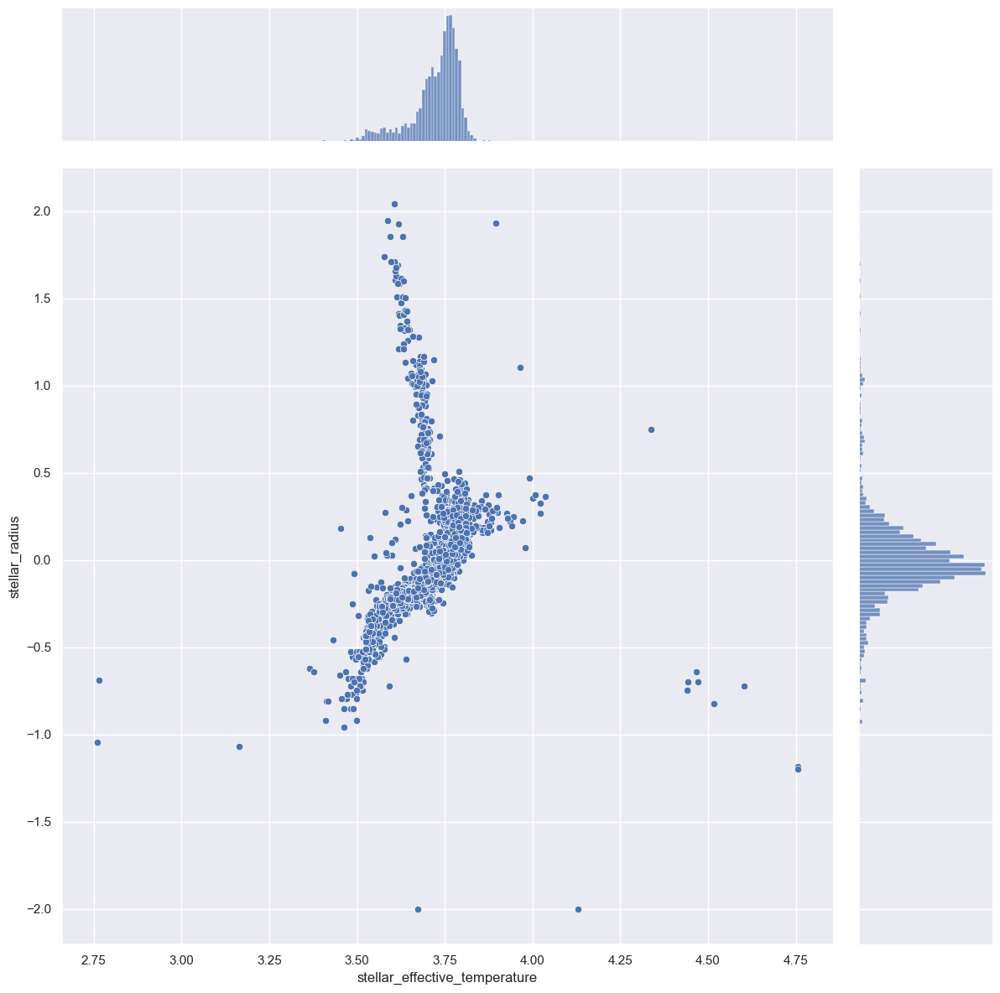

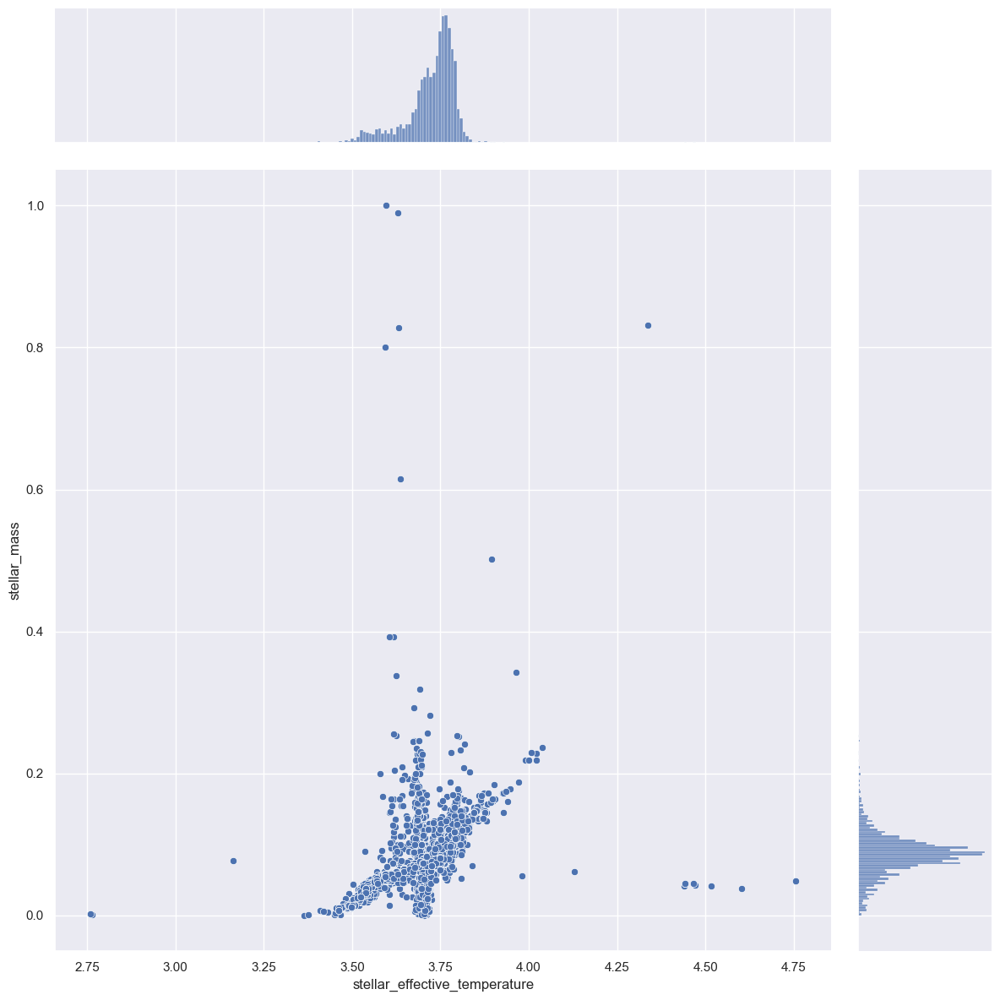

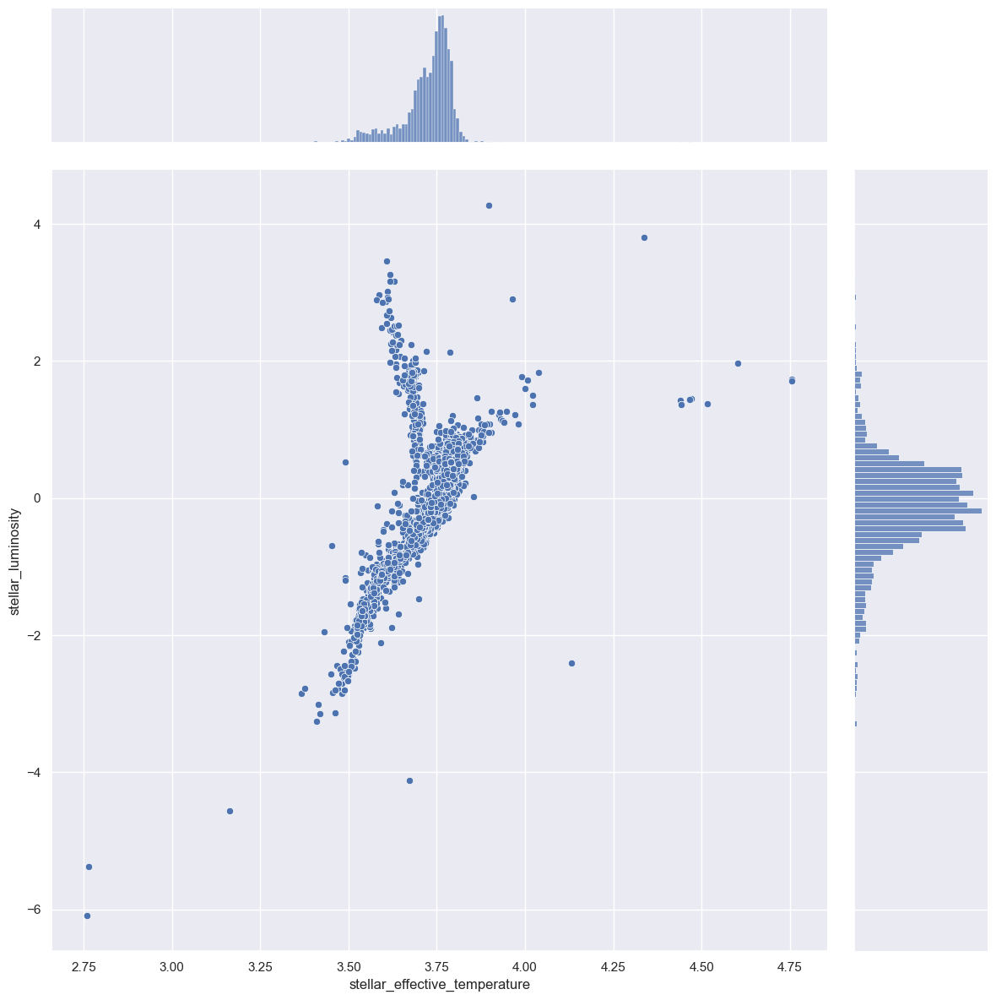

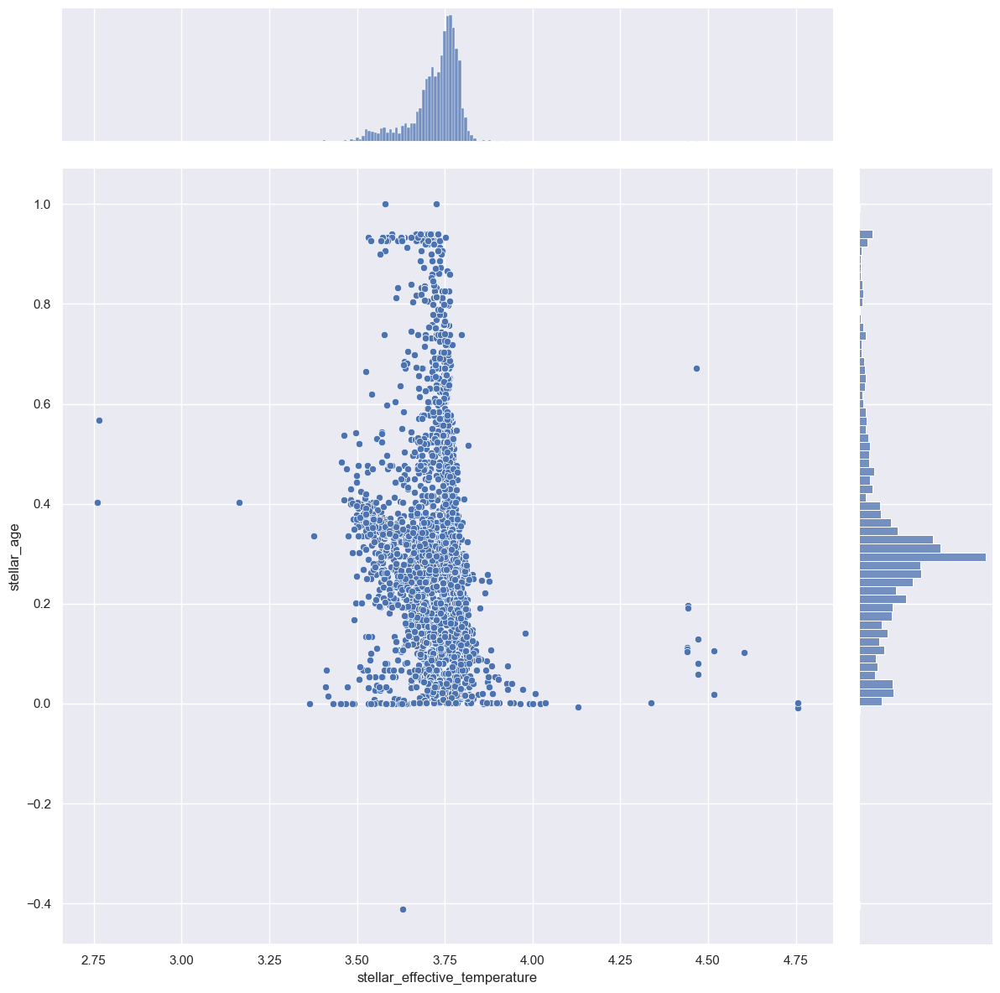

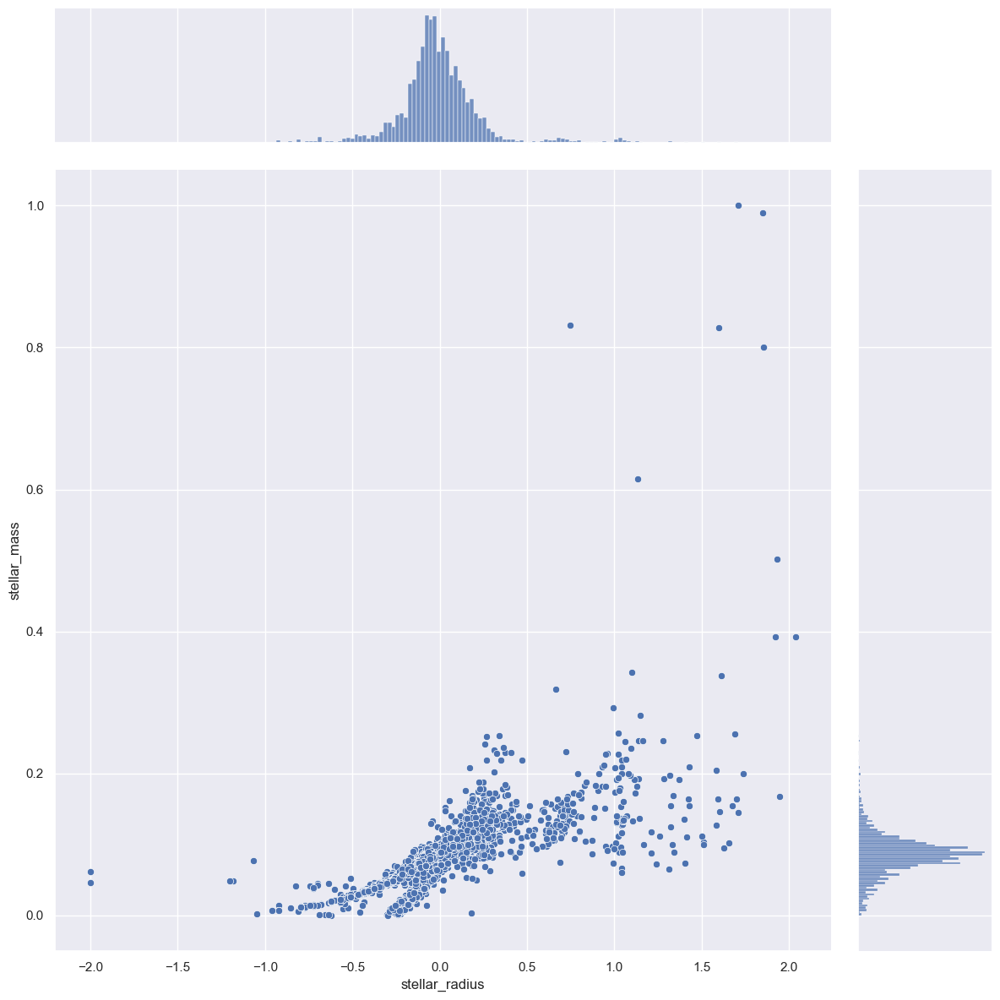

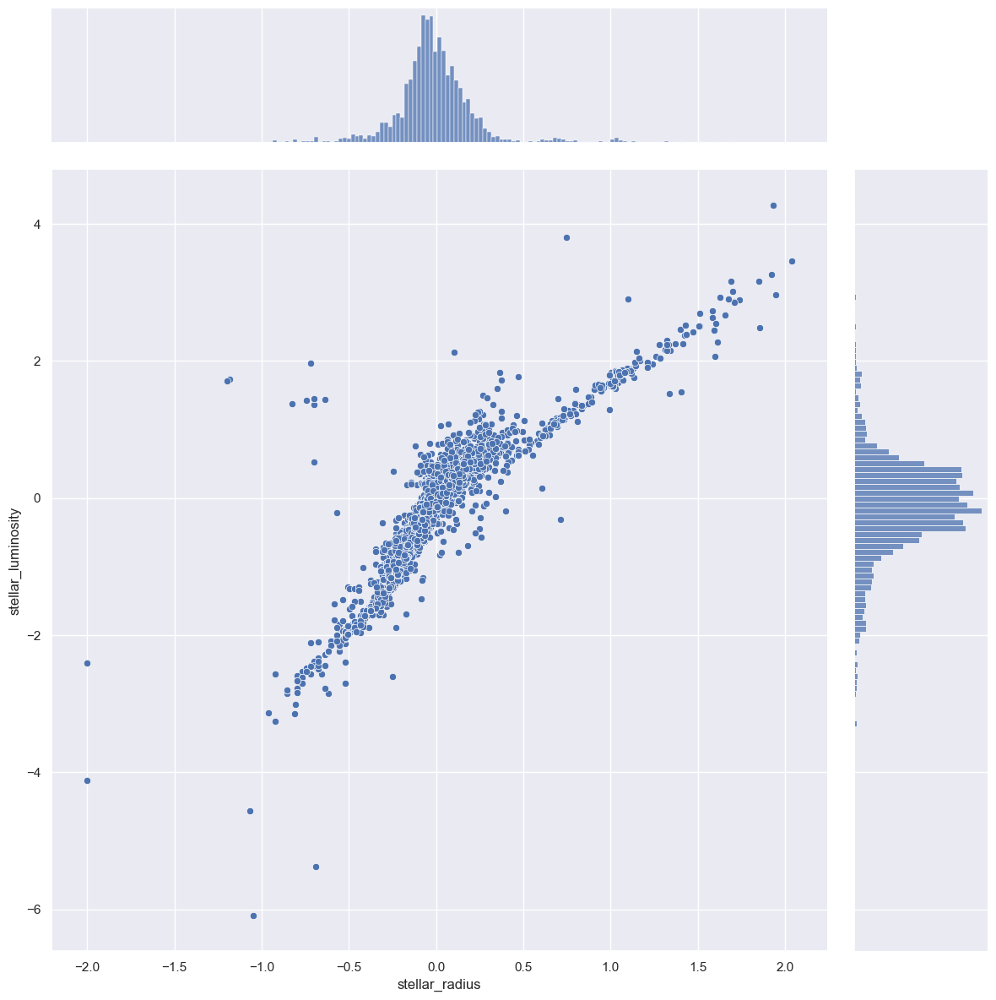

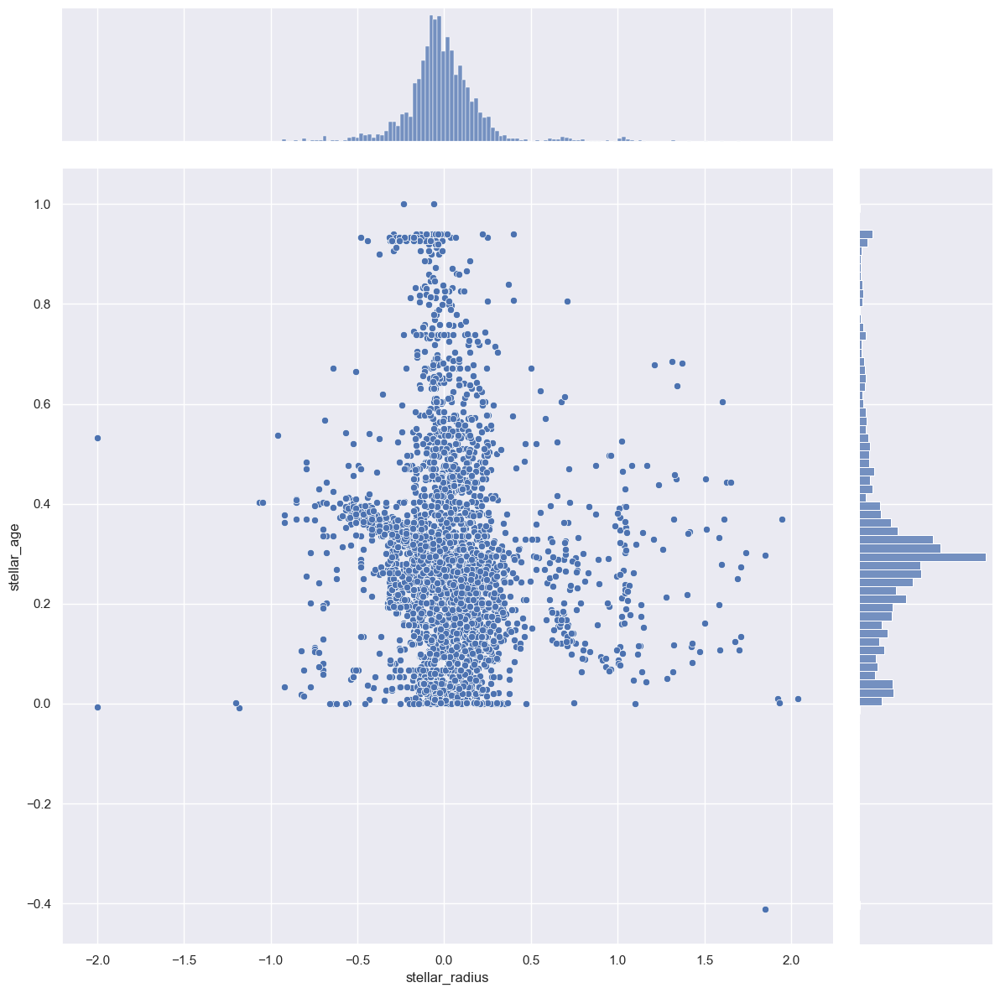

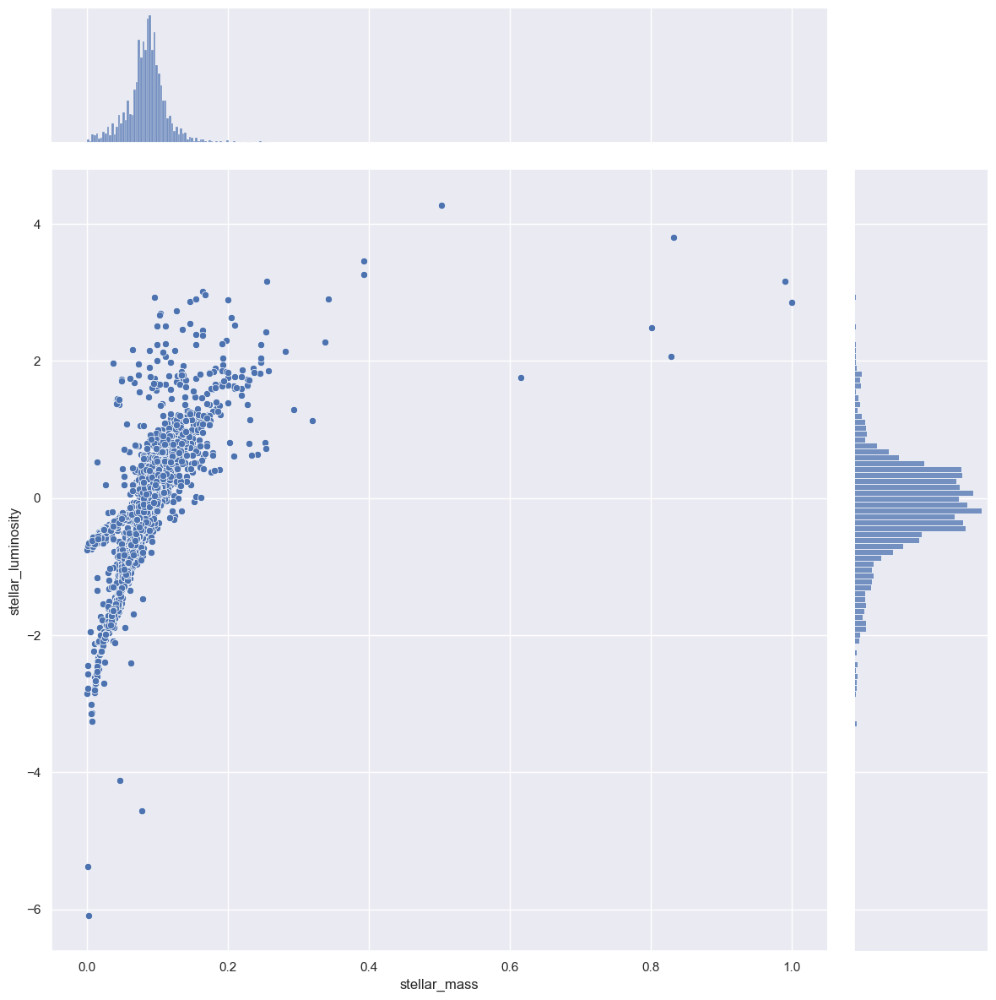

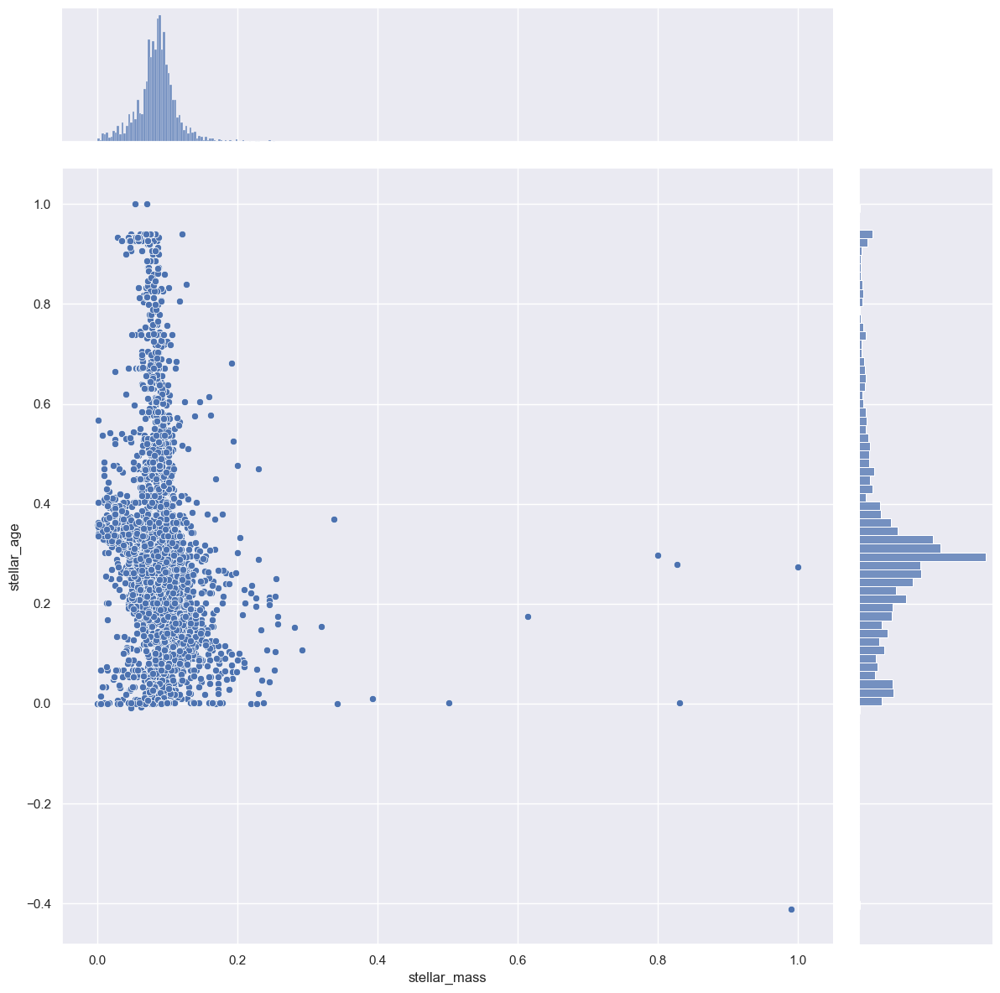

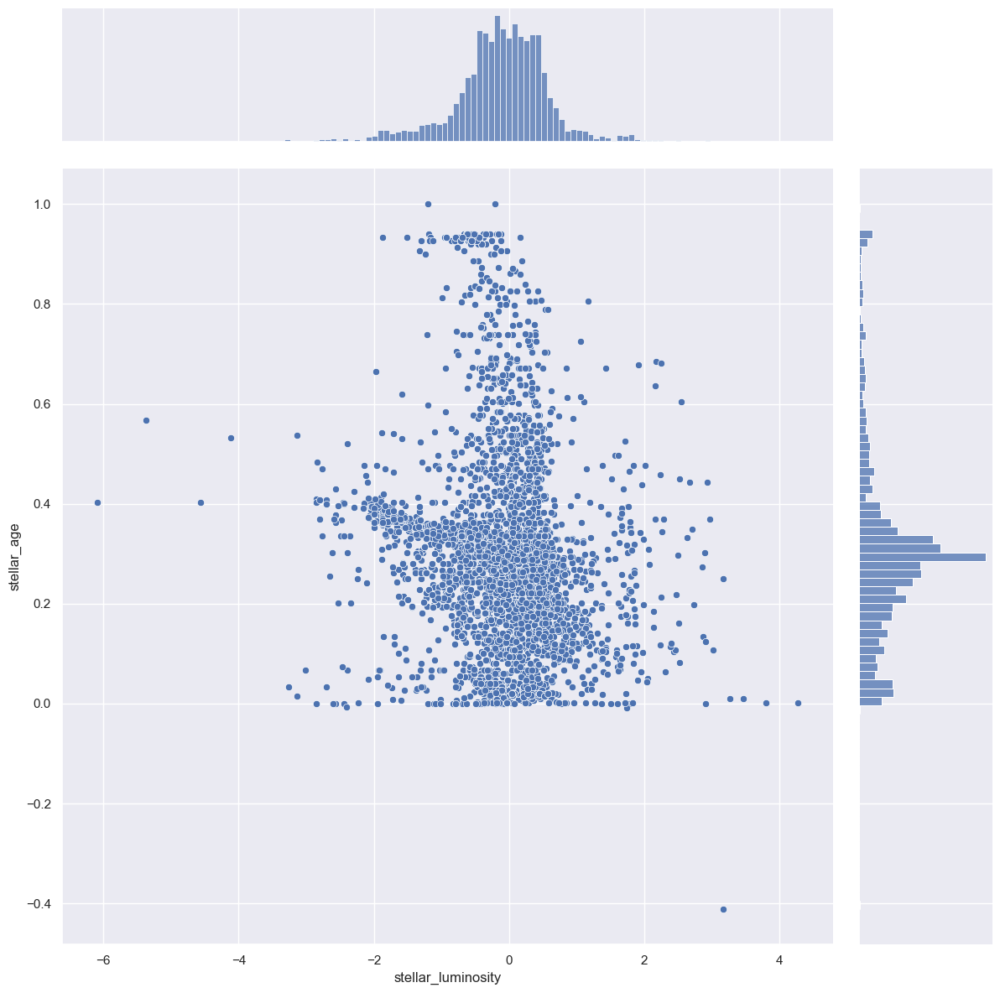

In [62]:
# Jointplot (Iterative Imputation)
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_iter_star.columns) for var2 in df_num_iter_star.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_iter_star, x=var1, y=var2, height = 12)

From observation, 
1. star_age seems to be having low correlation with other variables
2. Radius and luminosity almost make a straight line
3. Mass and Luminosity have a curve line

The graph is quite difference when we use the unaltered dataset compared to the imputation ones.
But both dataframe from dropping null values and from iterative imputation is not much difference

## Bivariate Analysis (Star Attributes) - Numerical vs Categorical

In [63]:
# # Unaltered Data
# combos = []
# for col1 in df_num_imp_star:
#     for col2 in df_cat_imp:
#         combos.append((col1, col2))
# for num_col, cat_col in combos:
#     f, axes = plt.subplots(figsize=(20,12))
#     sns.barplot(x=df_cat_imp[cat_col], y=df_num_imp_star[num_col])

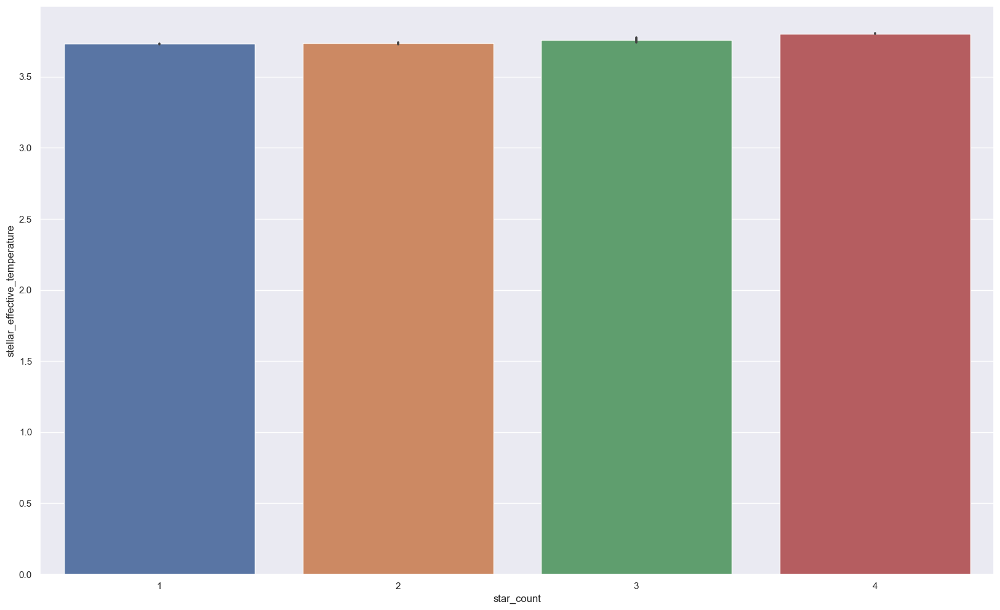

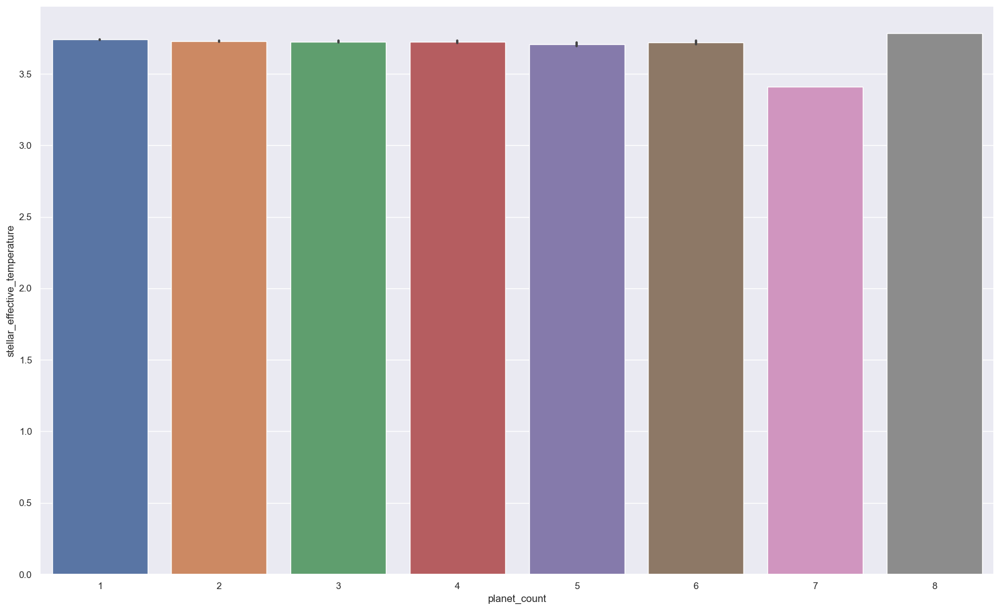

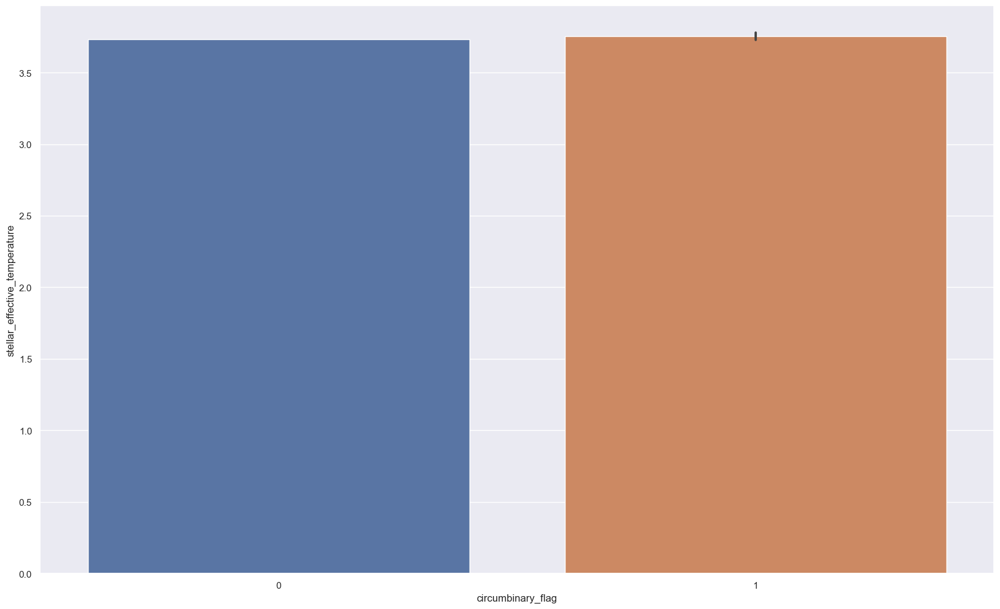

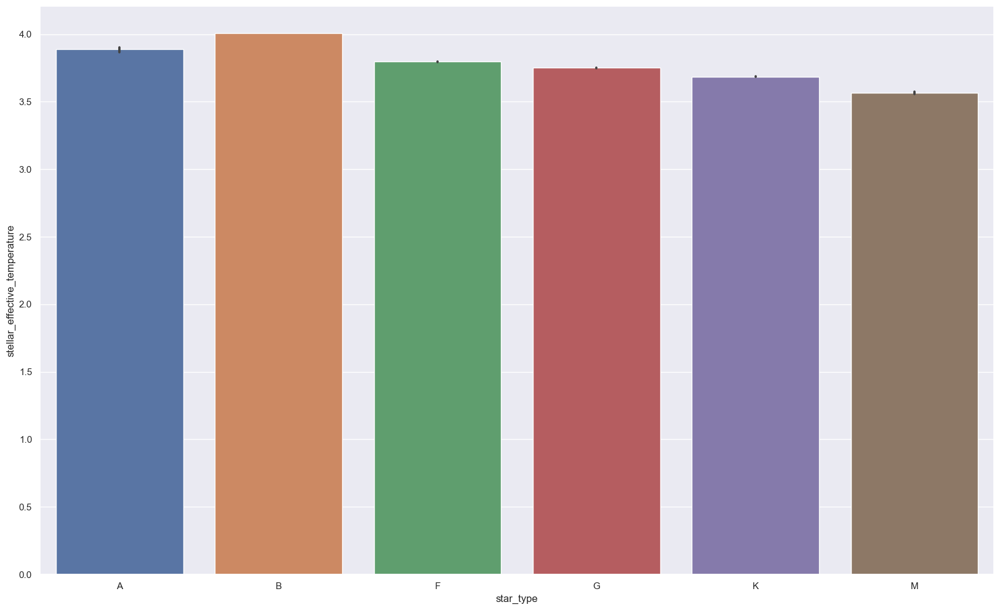

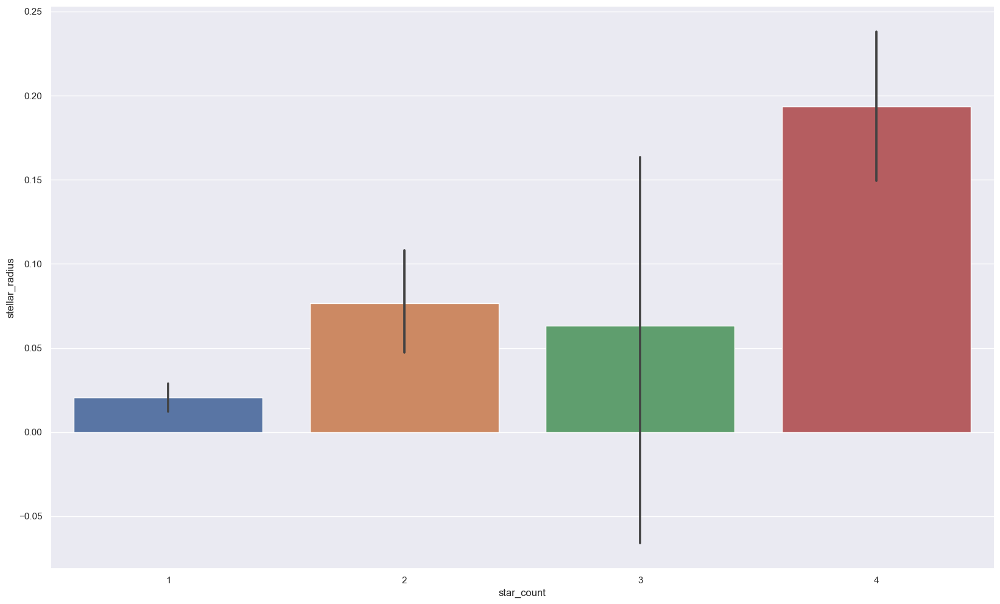

...

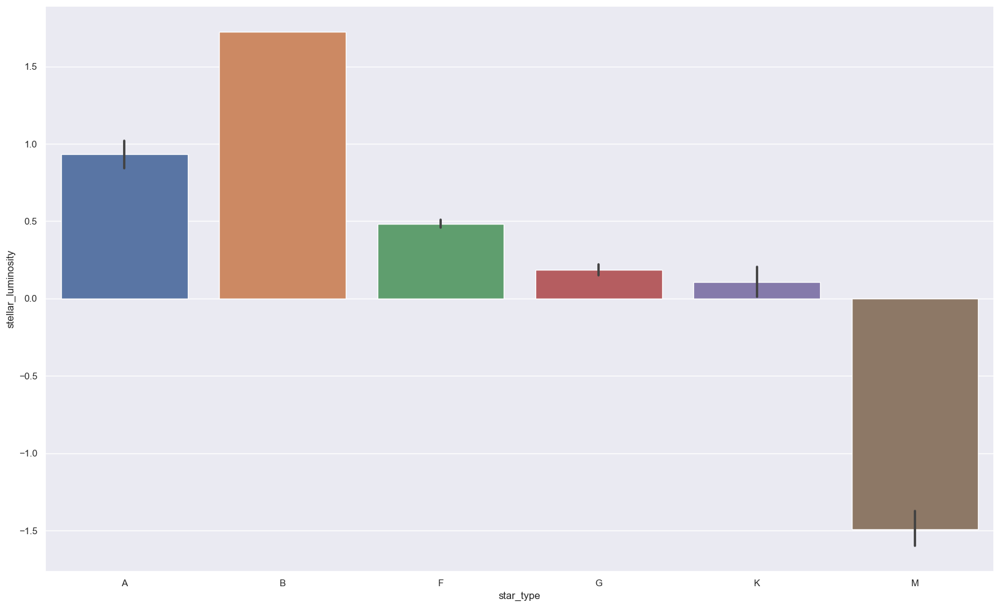

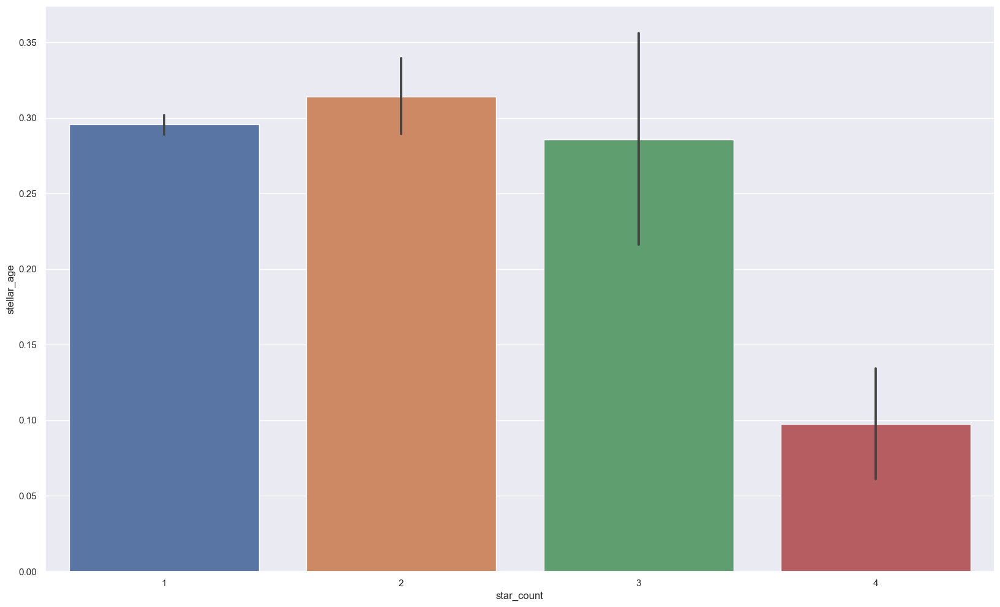

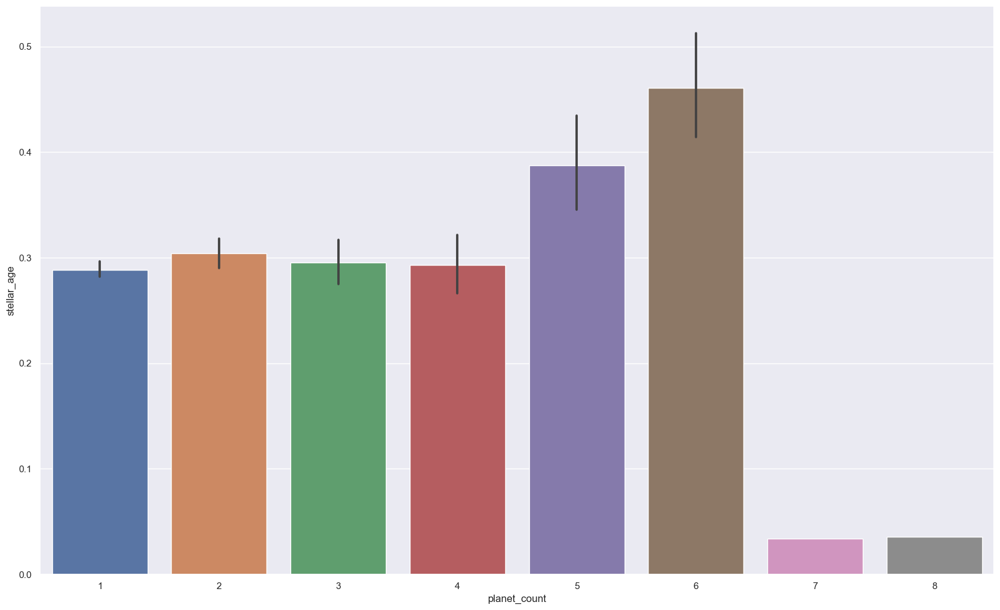

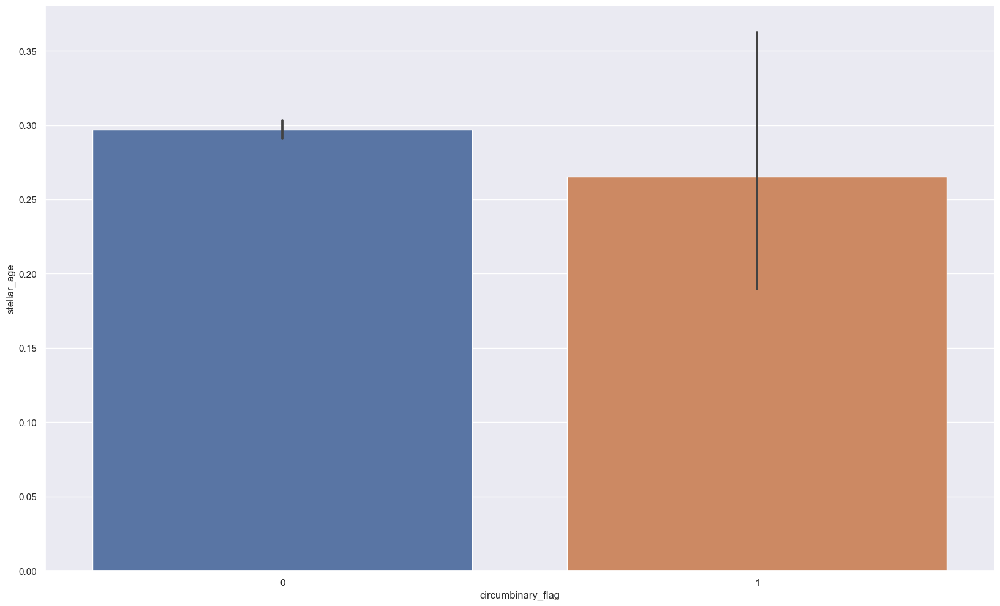

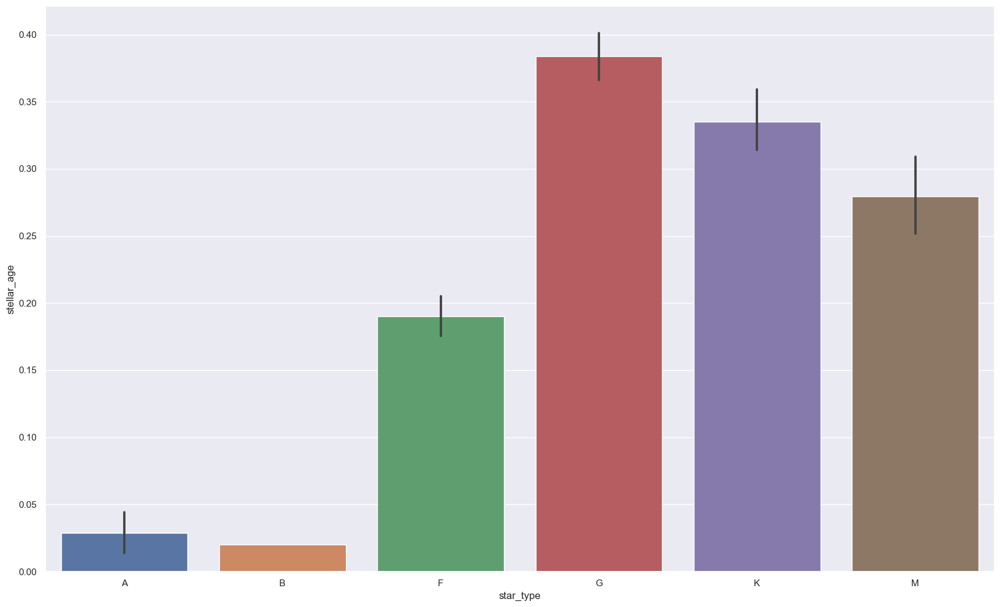

In [64]:
# Dropping Null Values
combos = []
for col1 in df_num_null_star:
    for col2 in df_cat_imp:
        combos.append((col1, col2))
for num_col, cat_col in combos:
    f, axes = plt.subplots(figsize=(20,12))
    sns.barplot(x=df_cat_imp[cat_col], y=df_num_null_star[num_col])

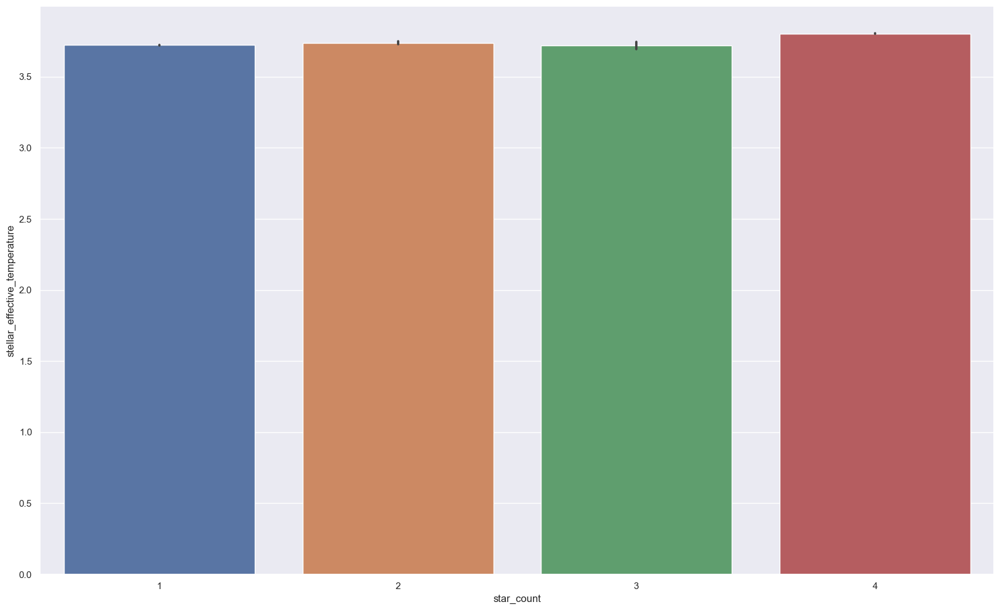

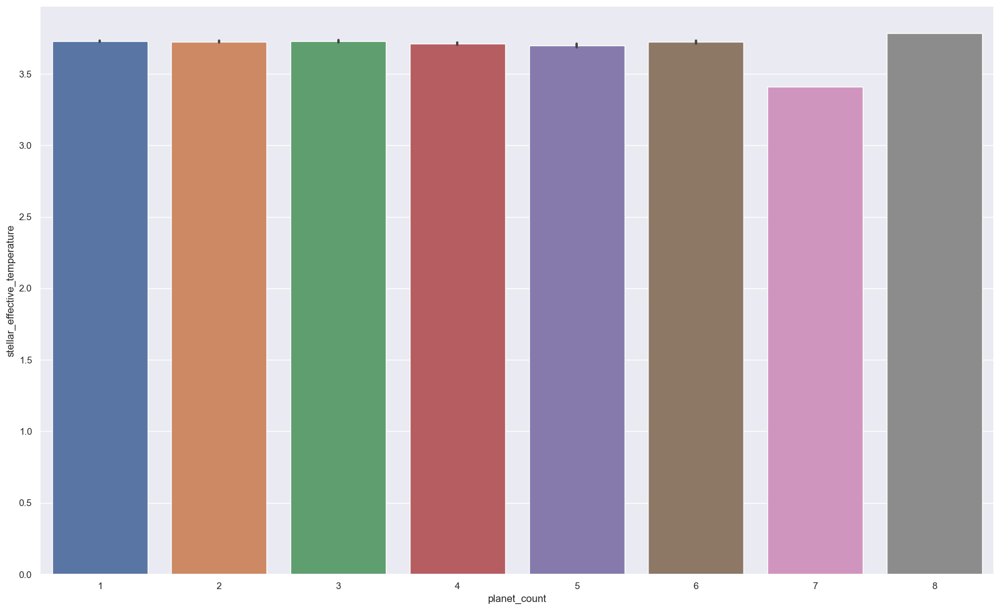

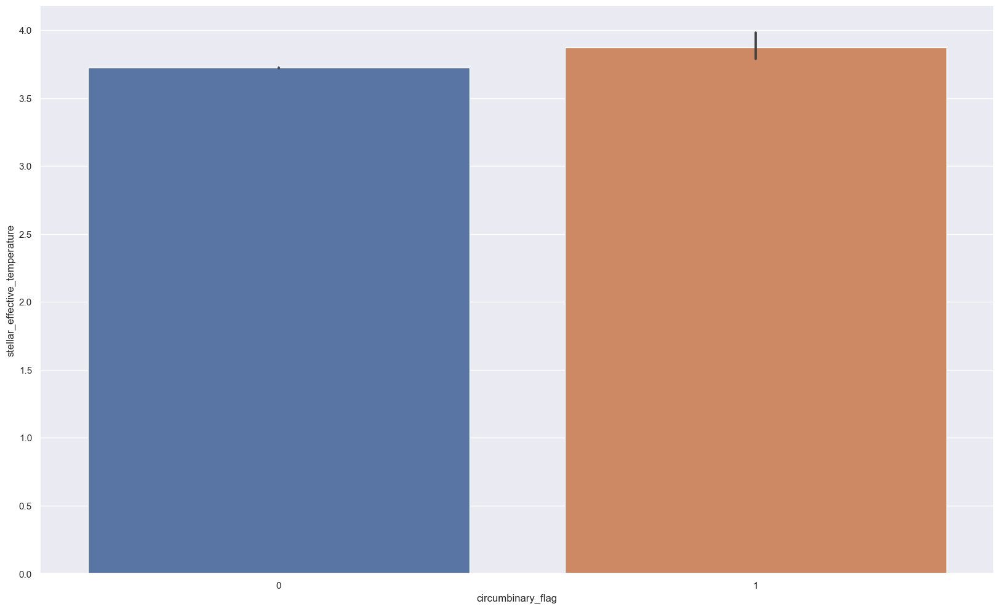

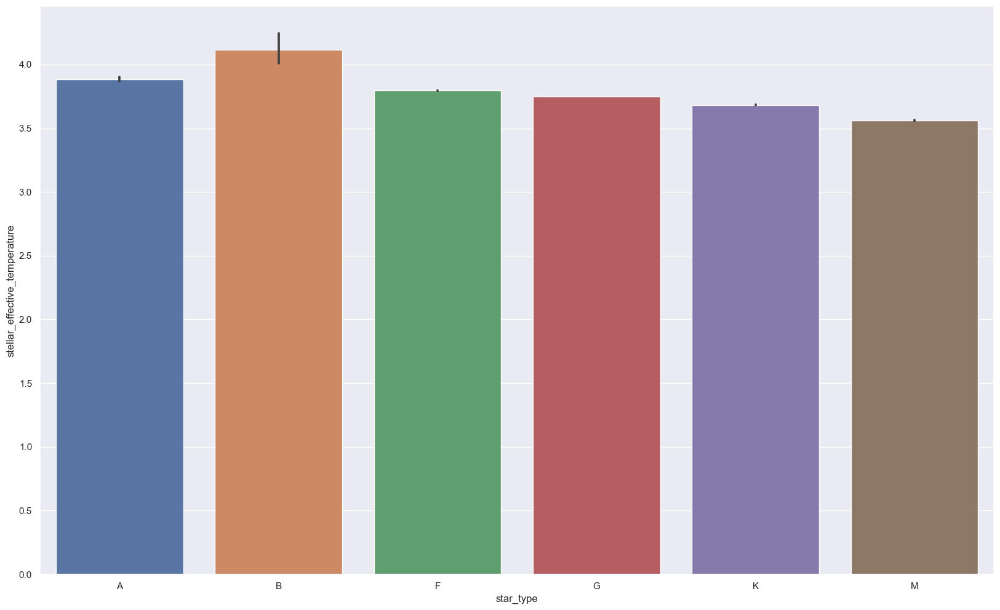

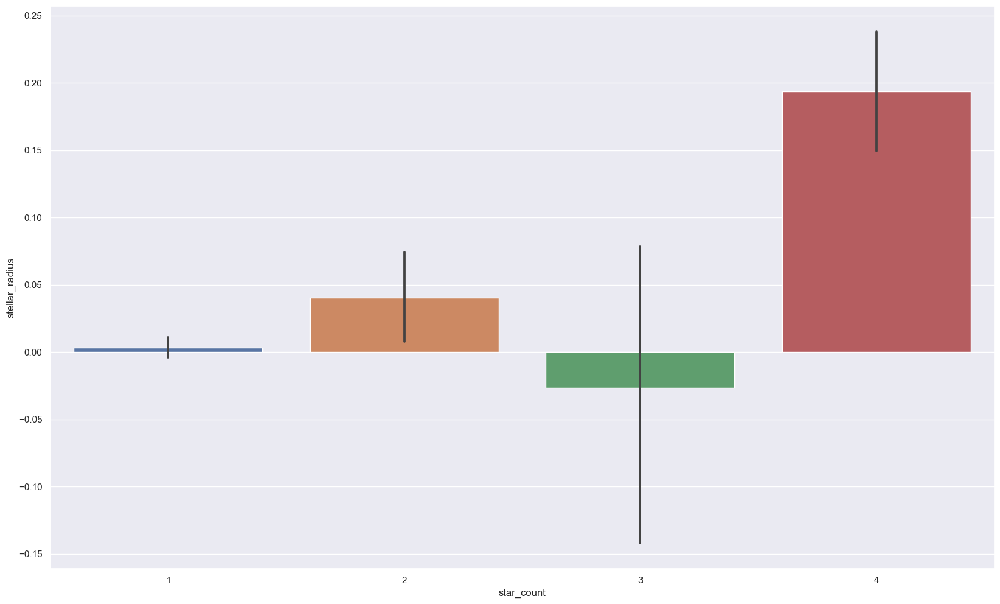

...

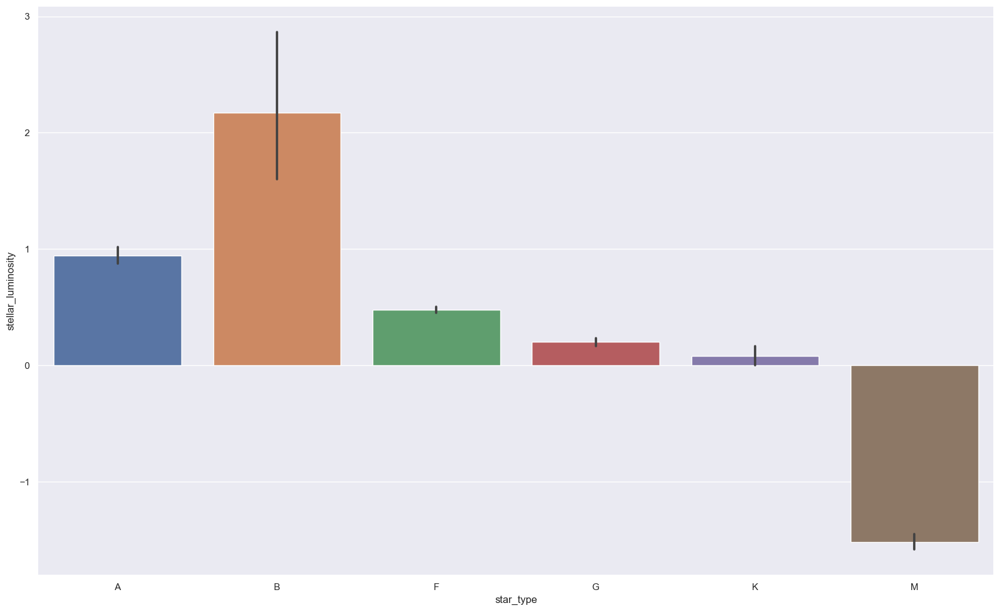

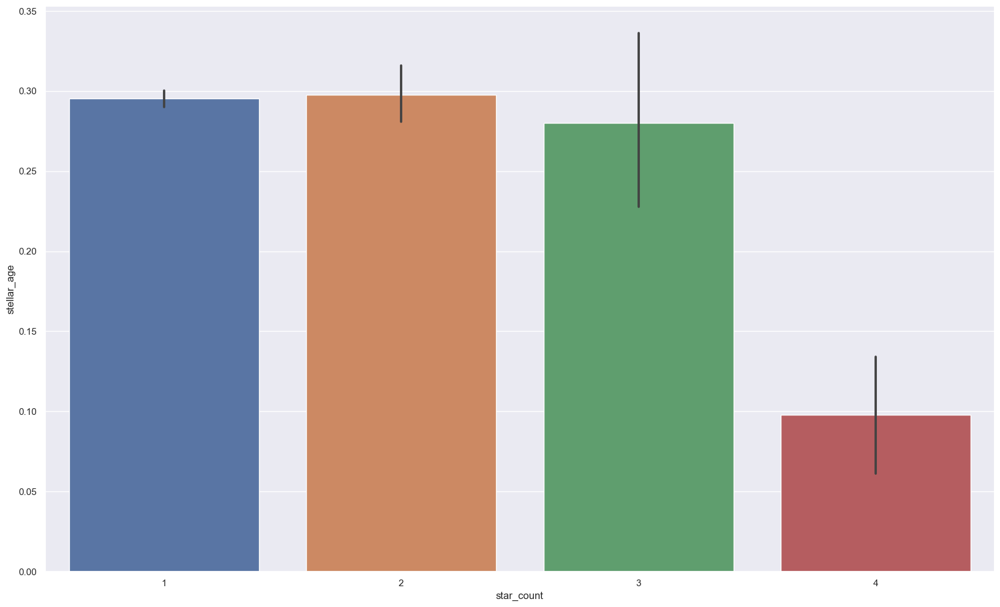

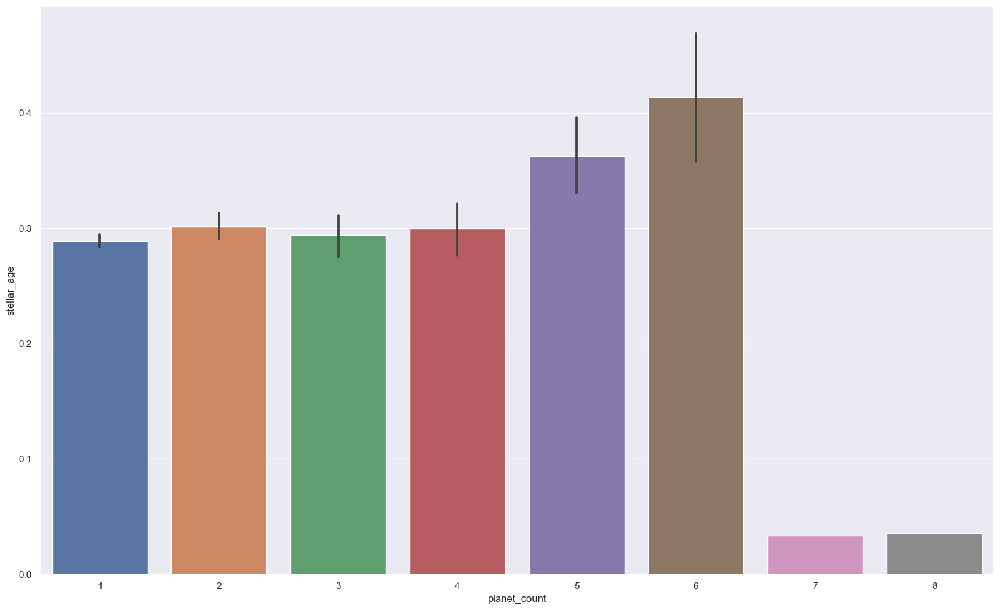

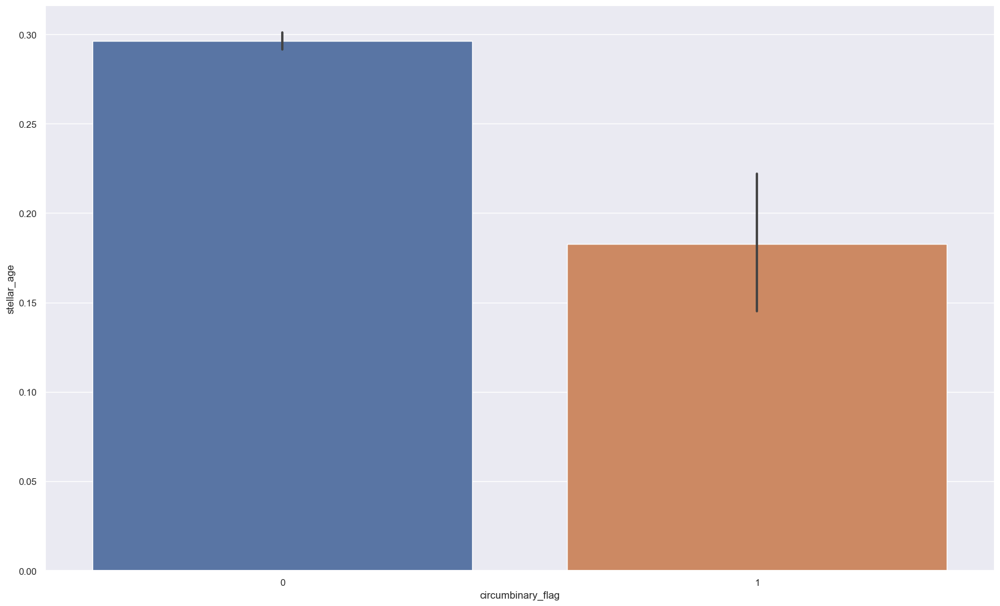

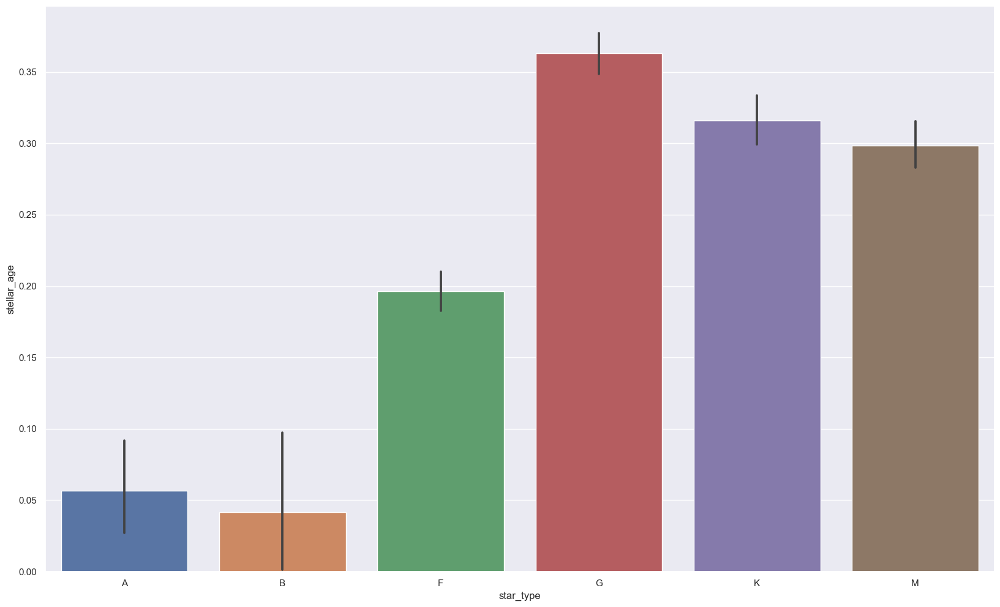

In [65]:
# Iteration Imputation
combos = []
for col1 in df_num_iter_star:
    for col2 in df_cat_imp:
        combos.append((col1, col2))
for num_col, cat_col in combos:
    f, axes = plt.subplots(figsize=(20,12))
    sns.barplot(x=df_cat_imp[cat_col], y=df_num_iter_star[num_col])

From Observation:
1. 

## Multivariate Analysis (Star Attributes)

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Star Attributes from Unaltered Data')

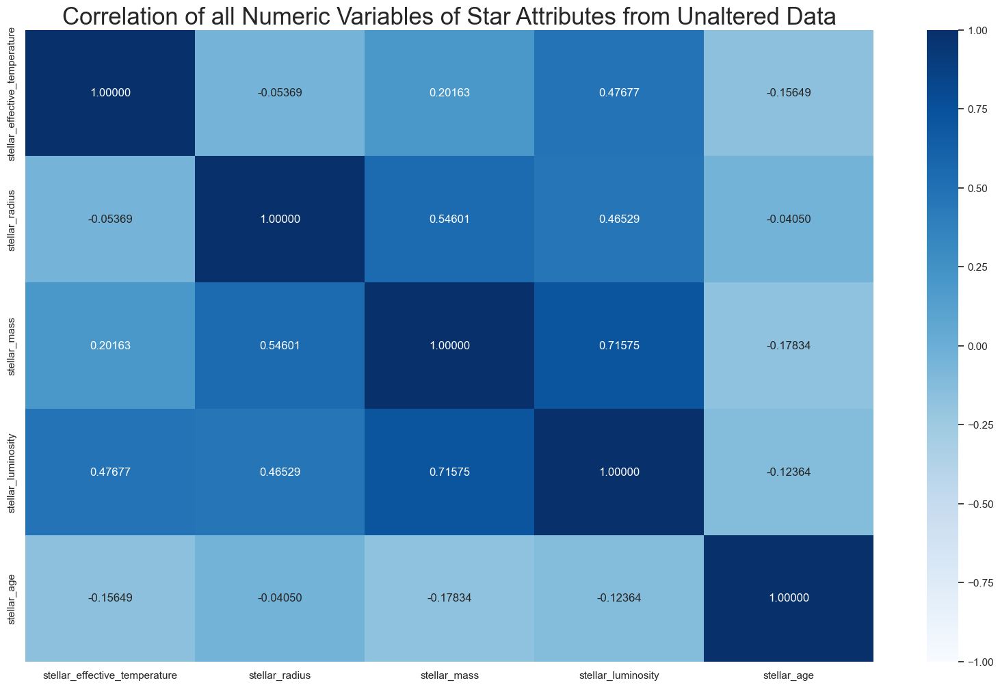

In [66]:
# Unaltered Data
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_imp_star.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Star Attributes from Unaltered Data", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Star Attributes from Dropping null values')

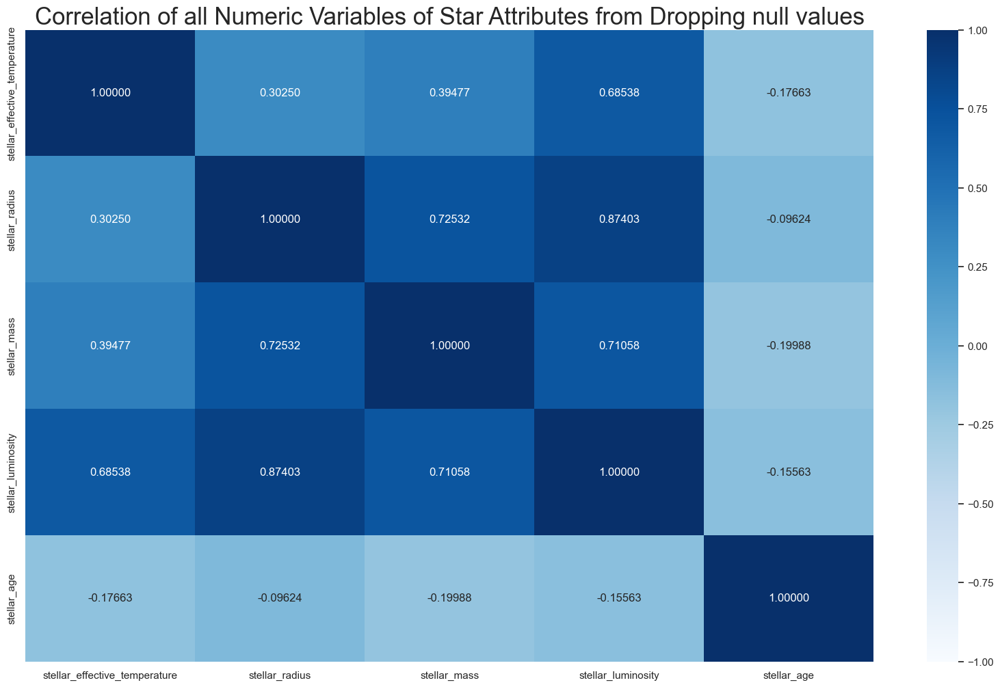

In [67]:
# Dropping null values
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_iter_star.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Star Attributes from Dropping null values", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables of Star Attributes from Iterative Imputation')

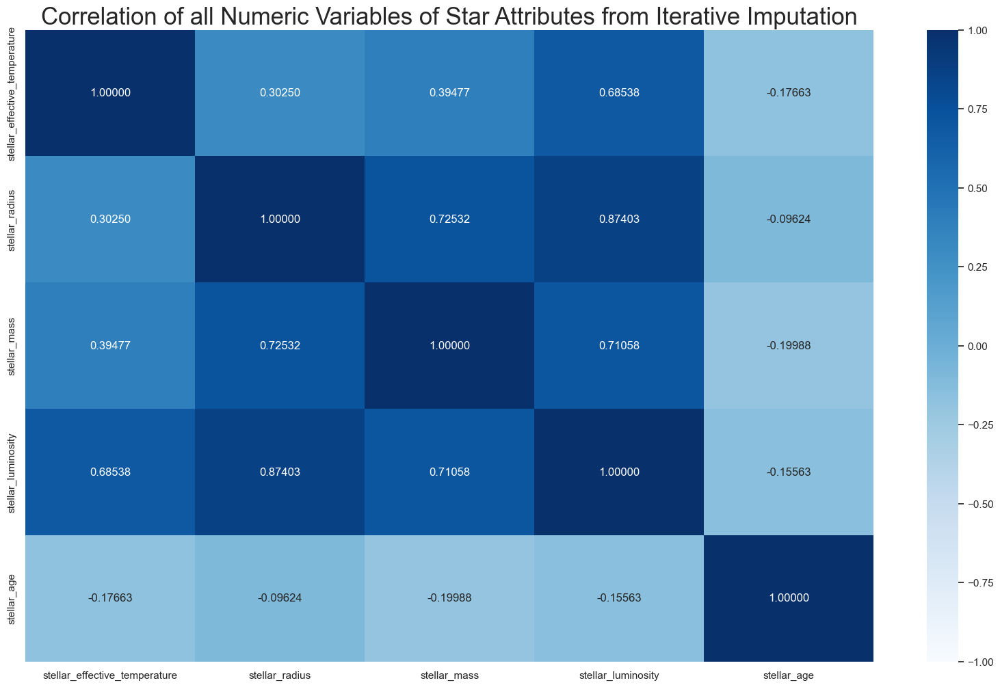

In [68]:
# Iterative Imputation
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num_iter_star.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables of Star Attributes from Iterative Imputation", size = 25)

There are only minor differences between dataset from dropping null value and from iterative imputation. <br>

However, there are quite major difference when we compare to the unaltered dataset

Some correlations are very low and negative (-), such as
1. Mass and Age
2. Luminosity and Age
3. Radius and Age

There are also some high correlations, such as
1. Mass and Radius
2. Mass and Luminosity
3. Radius and Luminosity

## Bivariate Analysis (Planet and Star Attributes)

In this analysis, we will see the correlation between planet and star attributes

In [69]:
# # Jointplot (Unaltered Data)
# var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_imp_star.columns) for var2 in df_num_imp_planet.columns[i+1:]]
# for var1, var2 in var_combinations:
#     sns.jointplot(data=df_num_imp, x=var1, y=var2, height = 12)

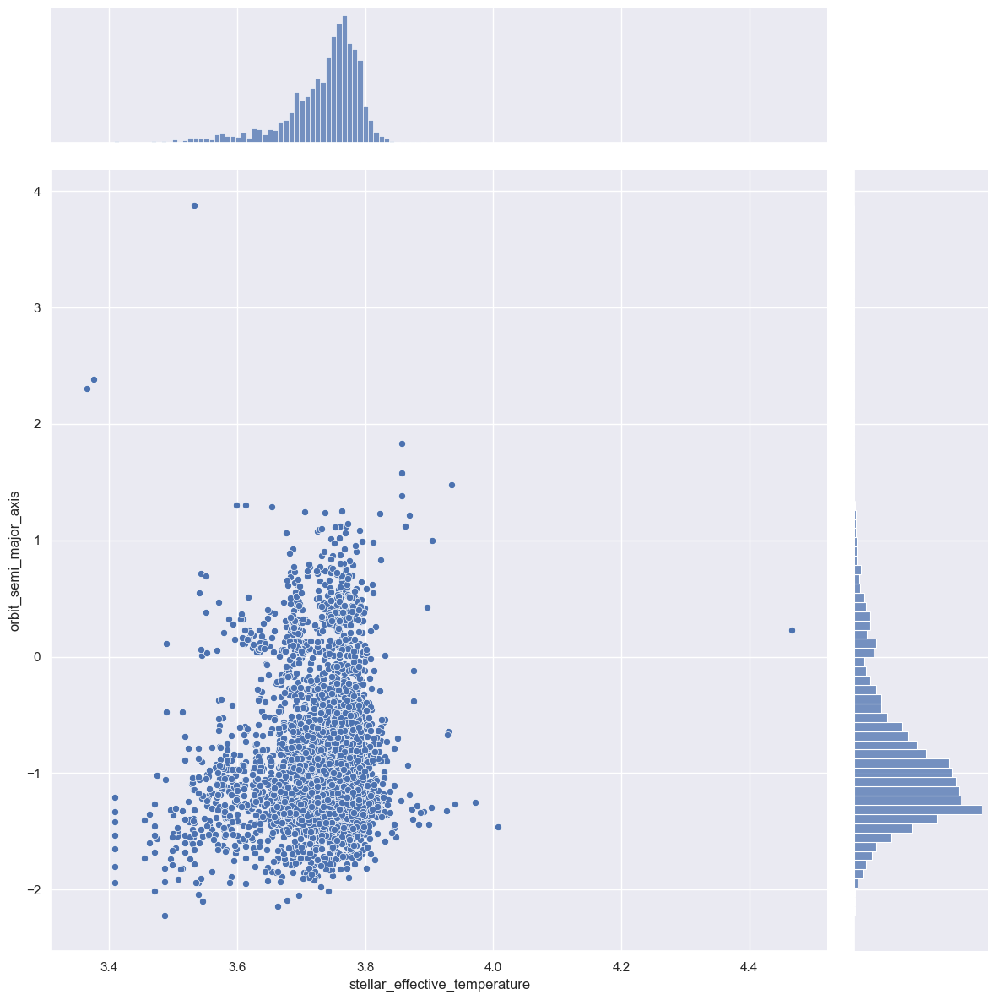

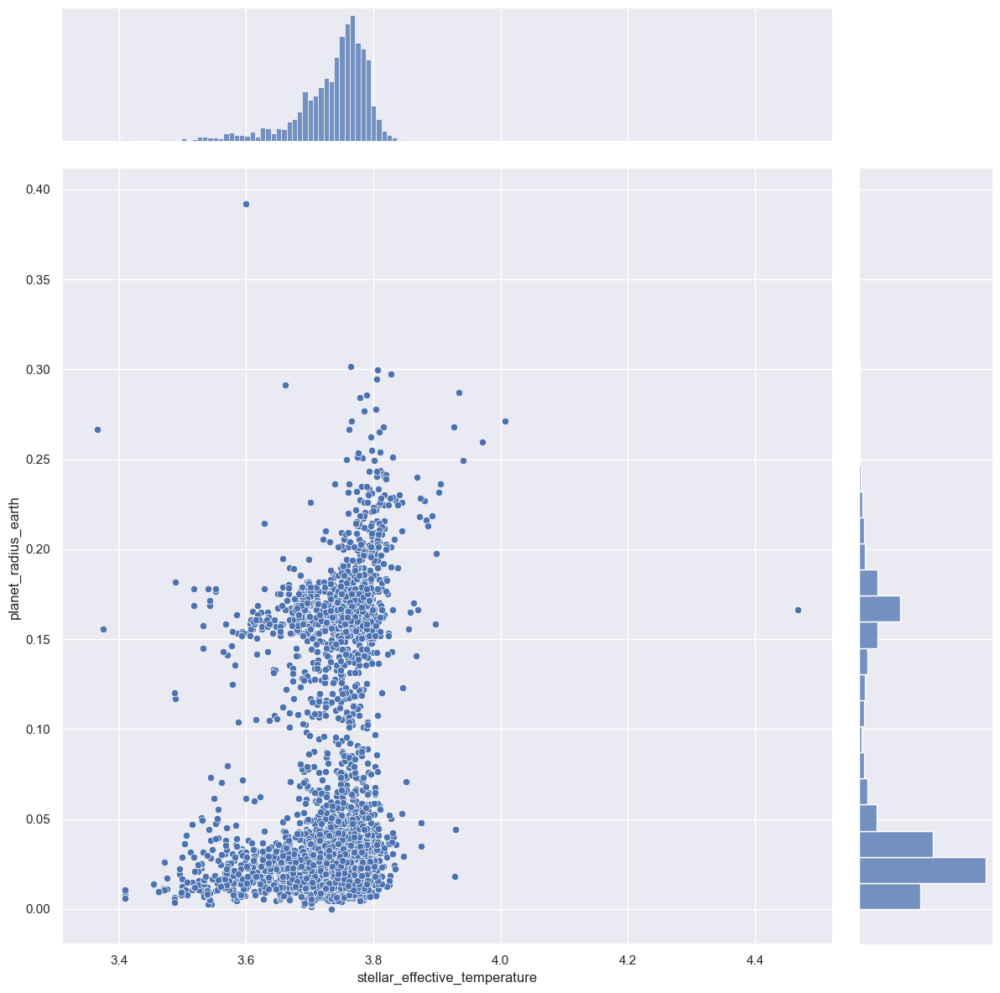

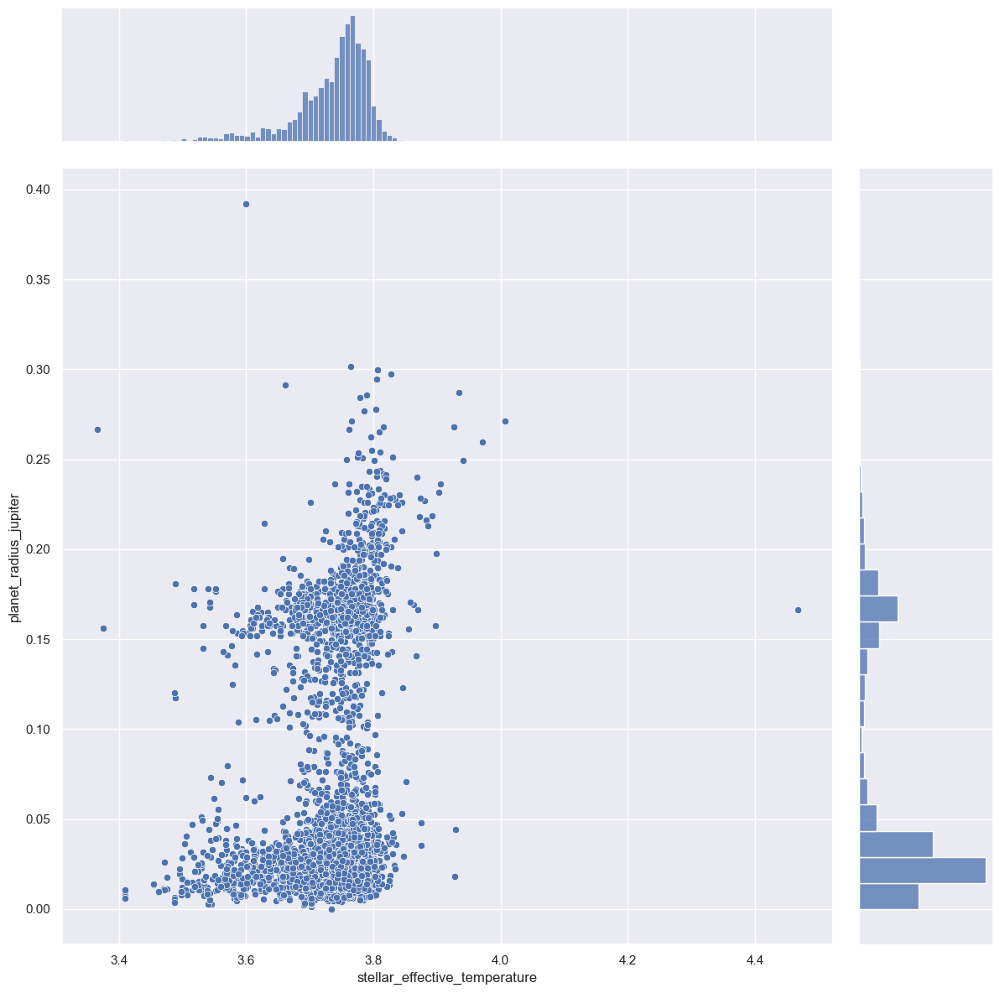

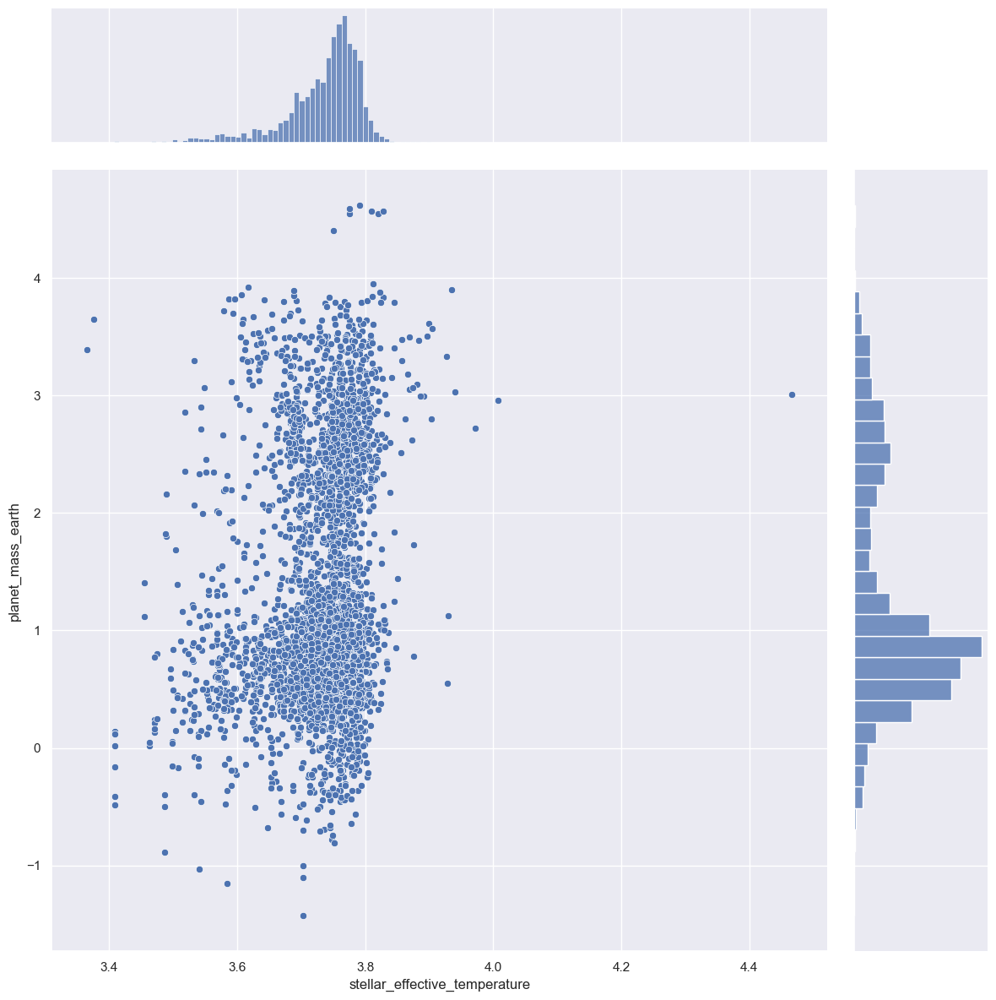

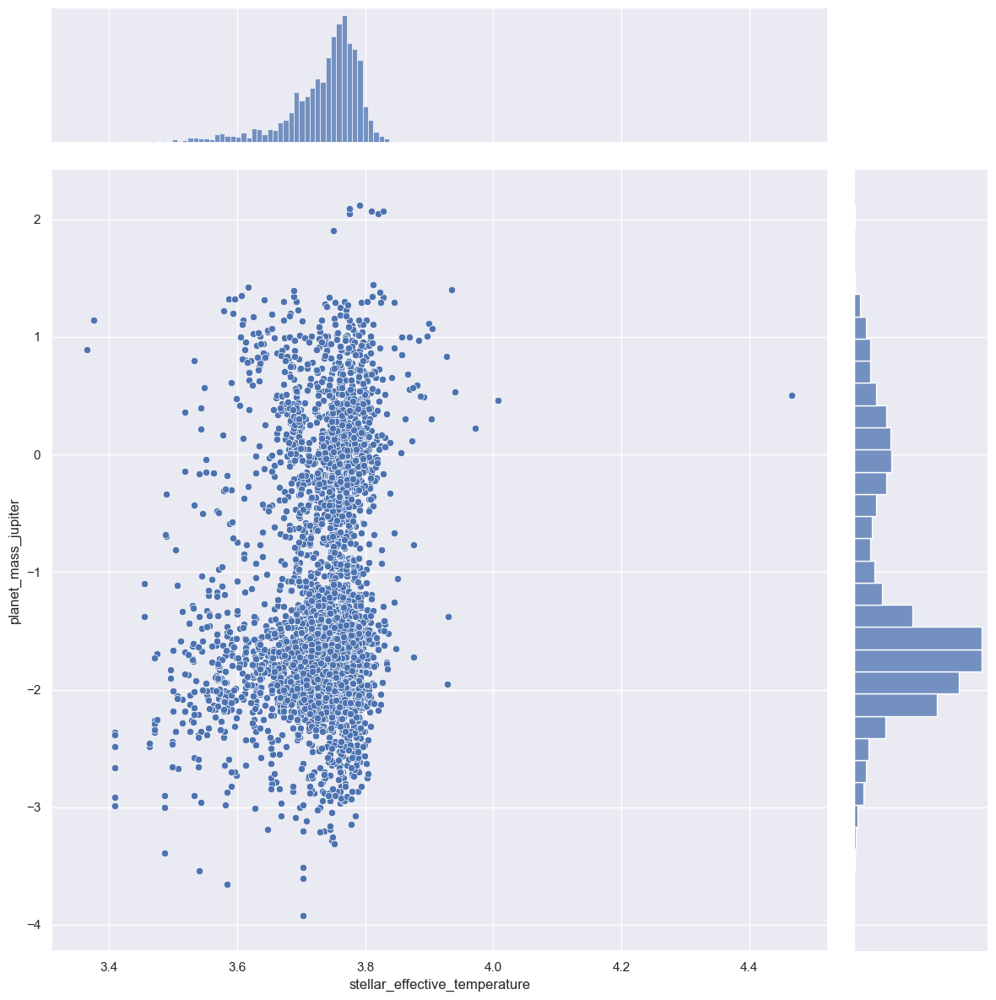

...

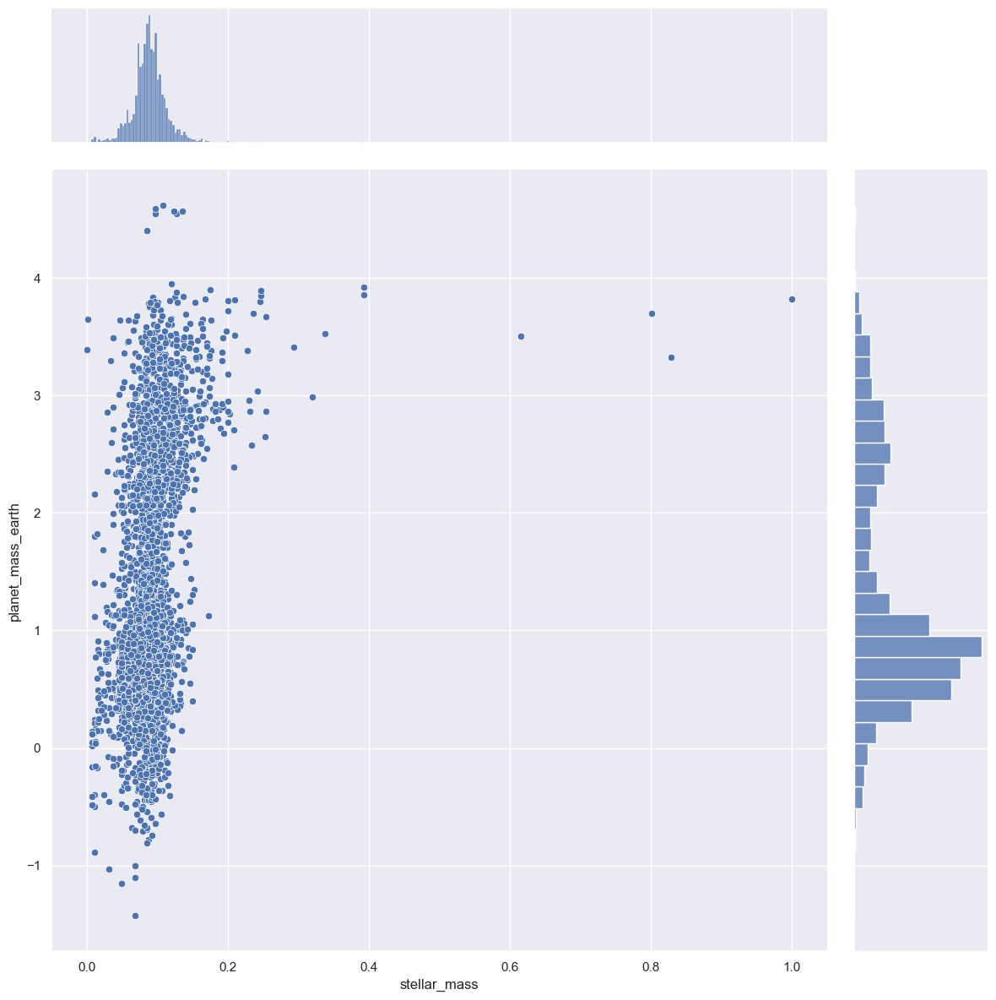

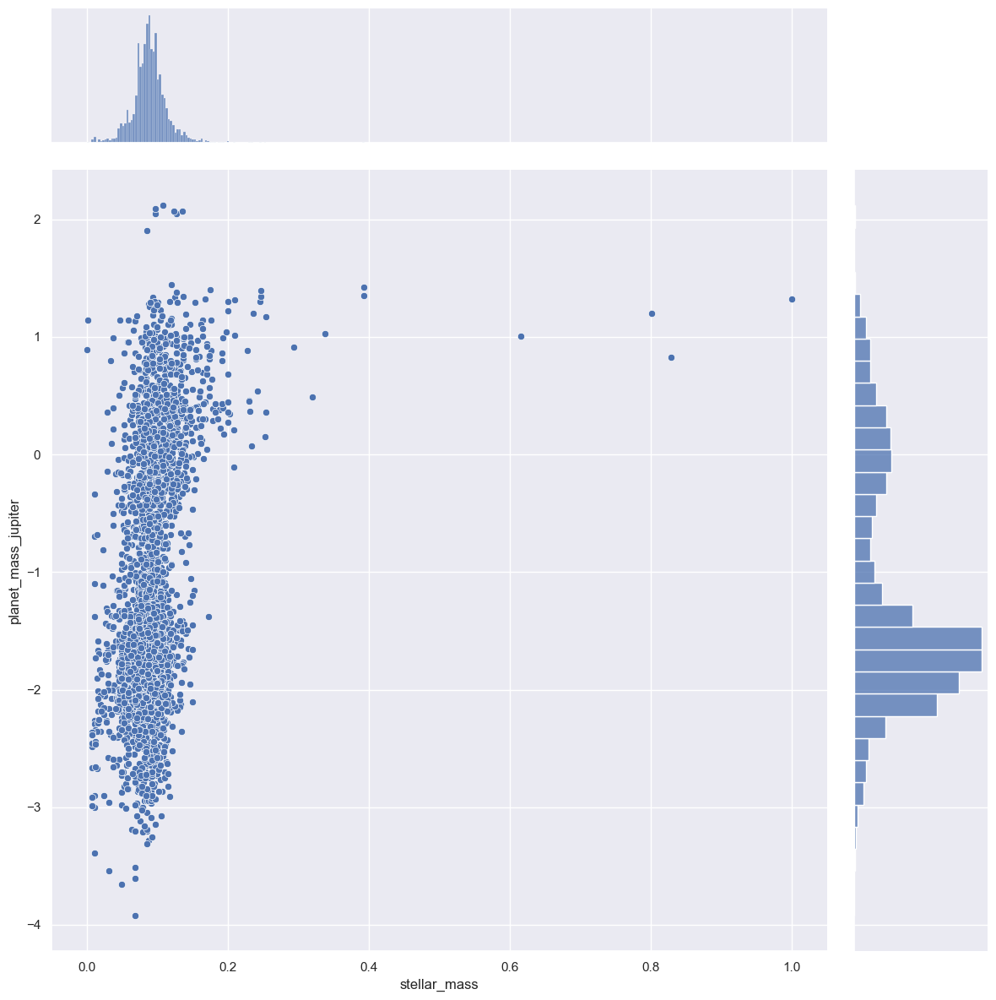

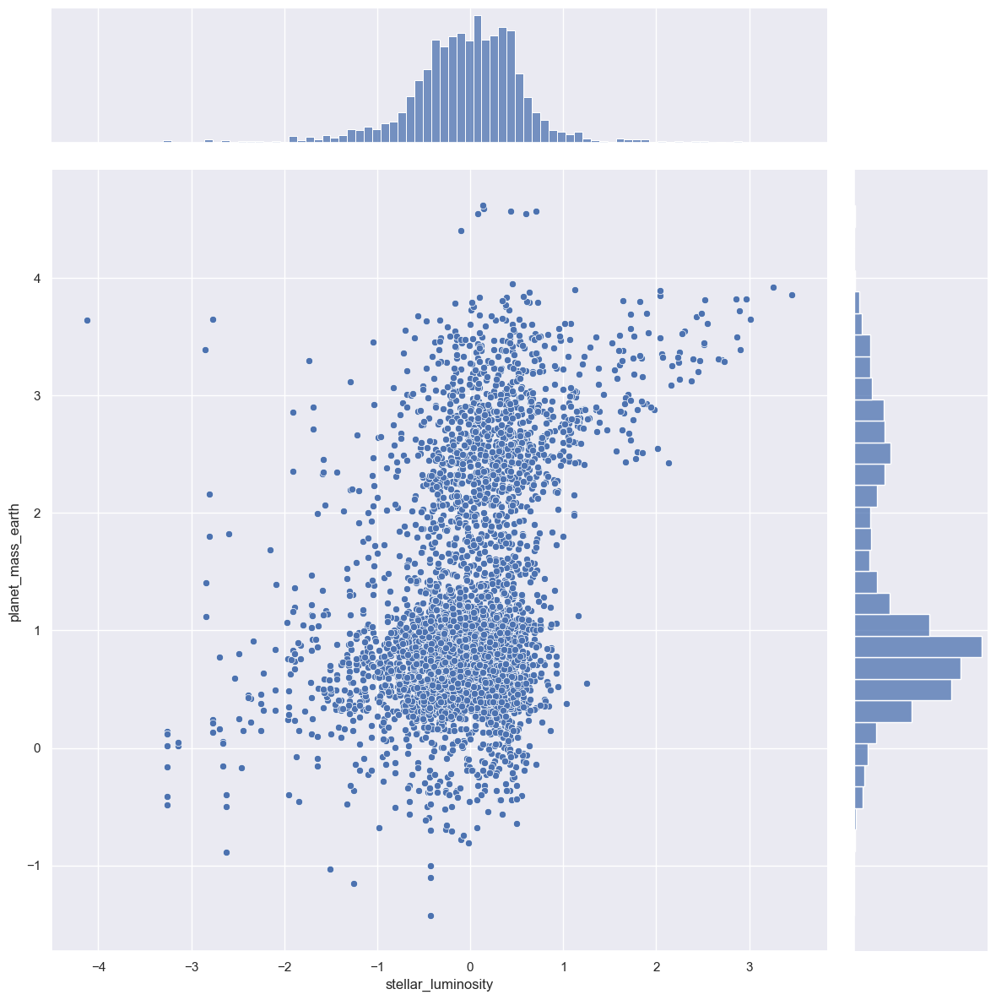

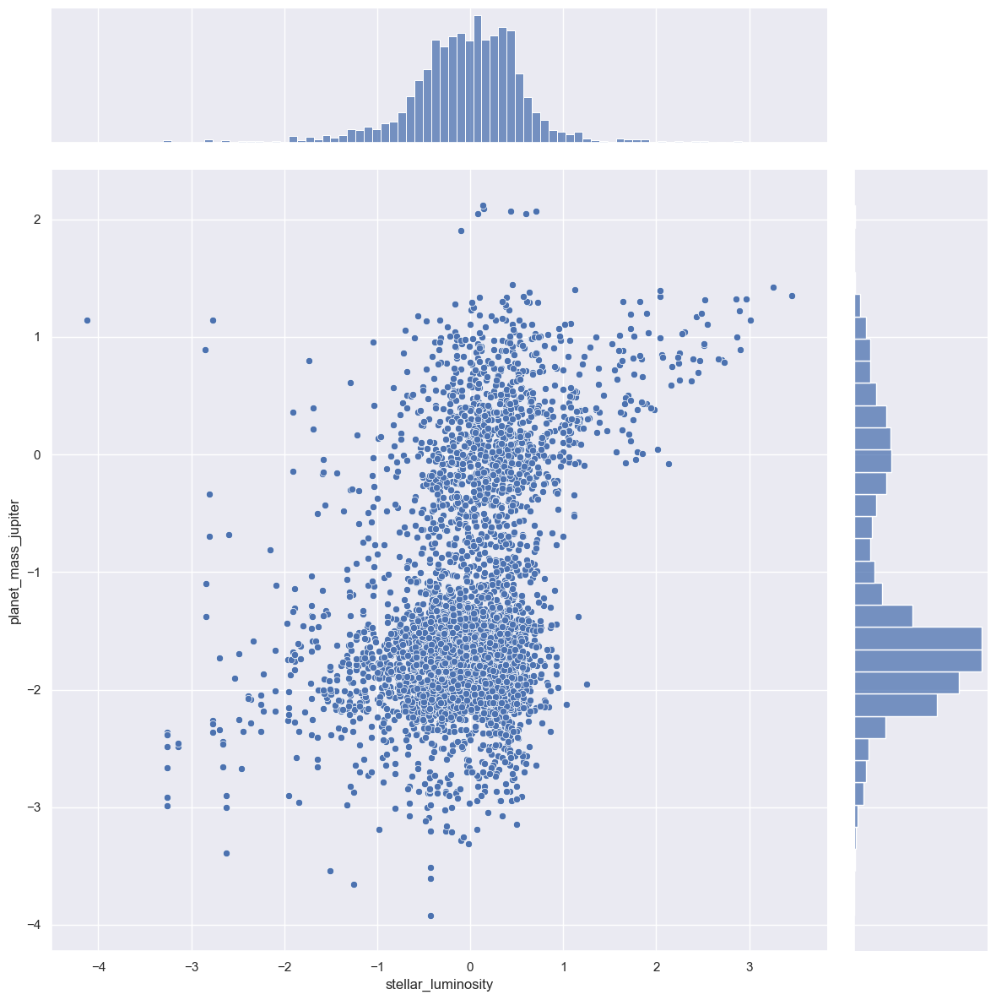

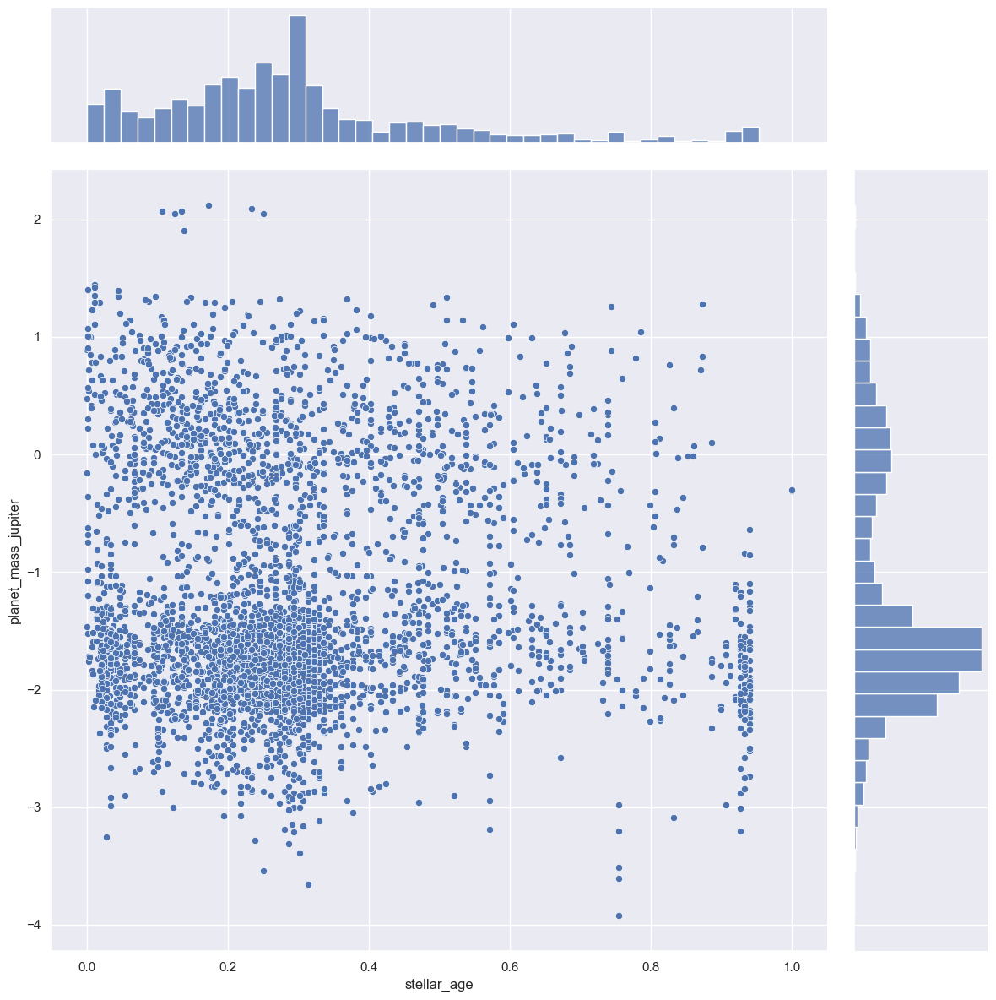

In [70]:
# Jointplot (Dropping null values)
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_null_star.columns) for var2 in df_num_null_planet.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_null, x=var1, y=var2, height = 12)

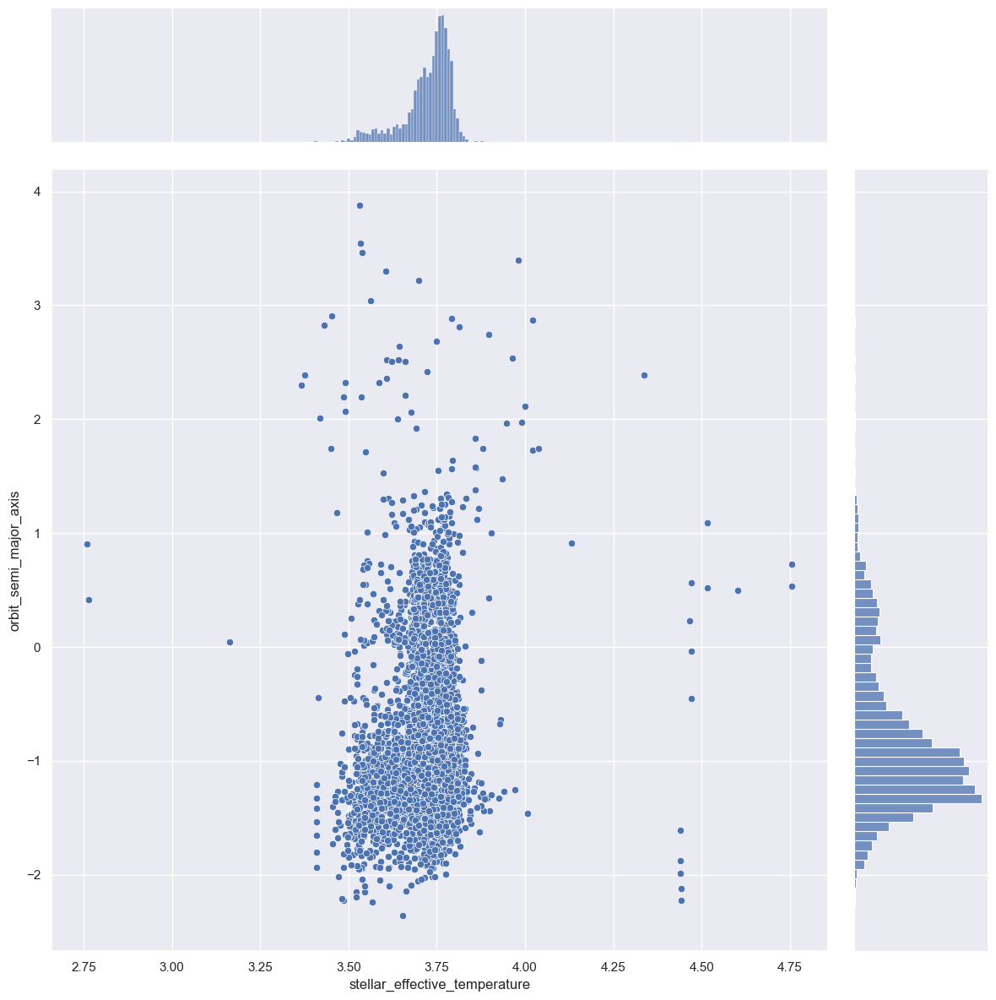

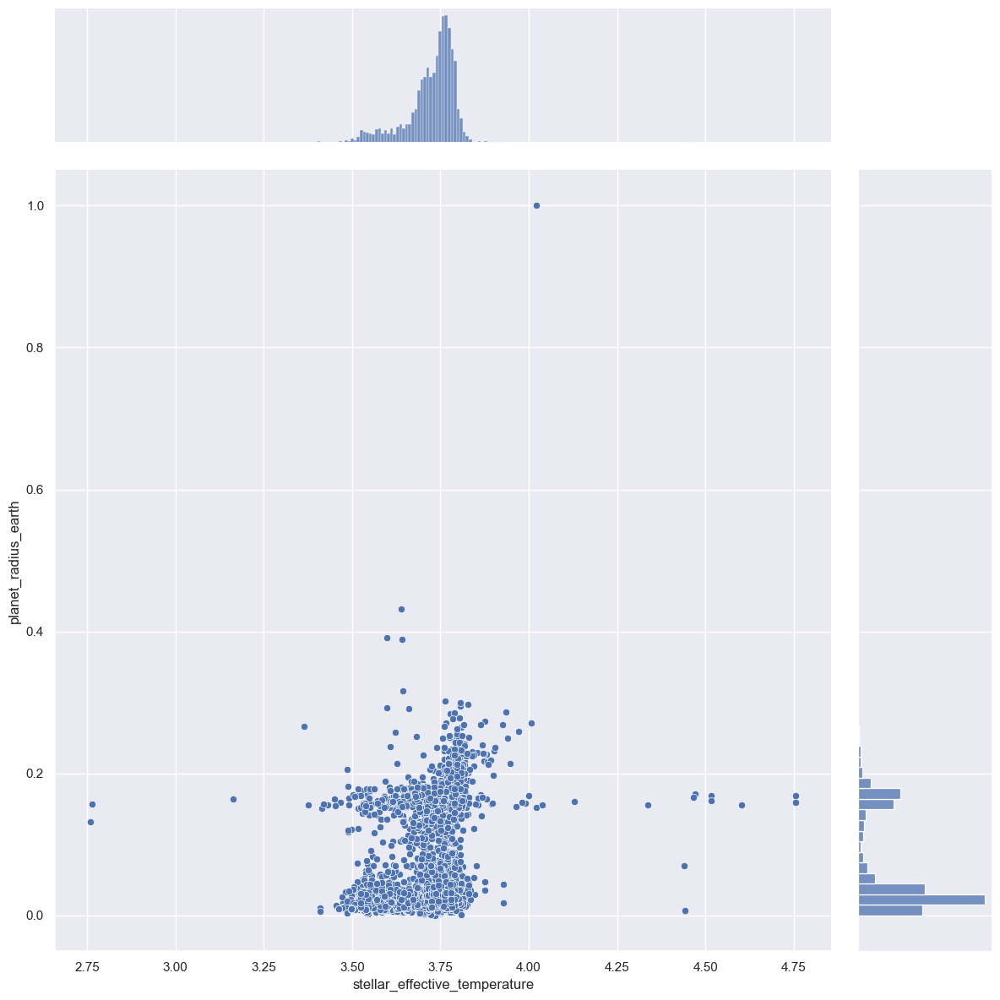

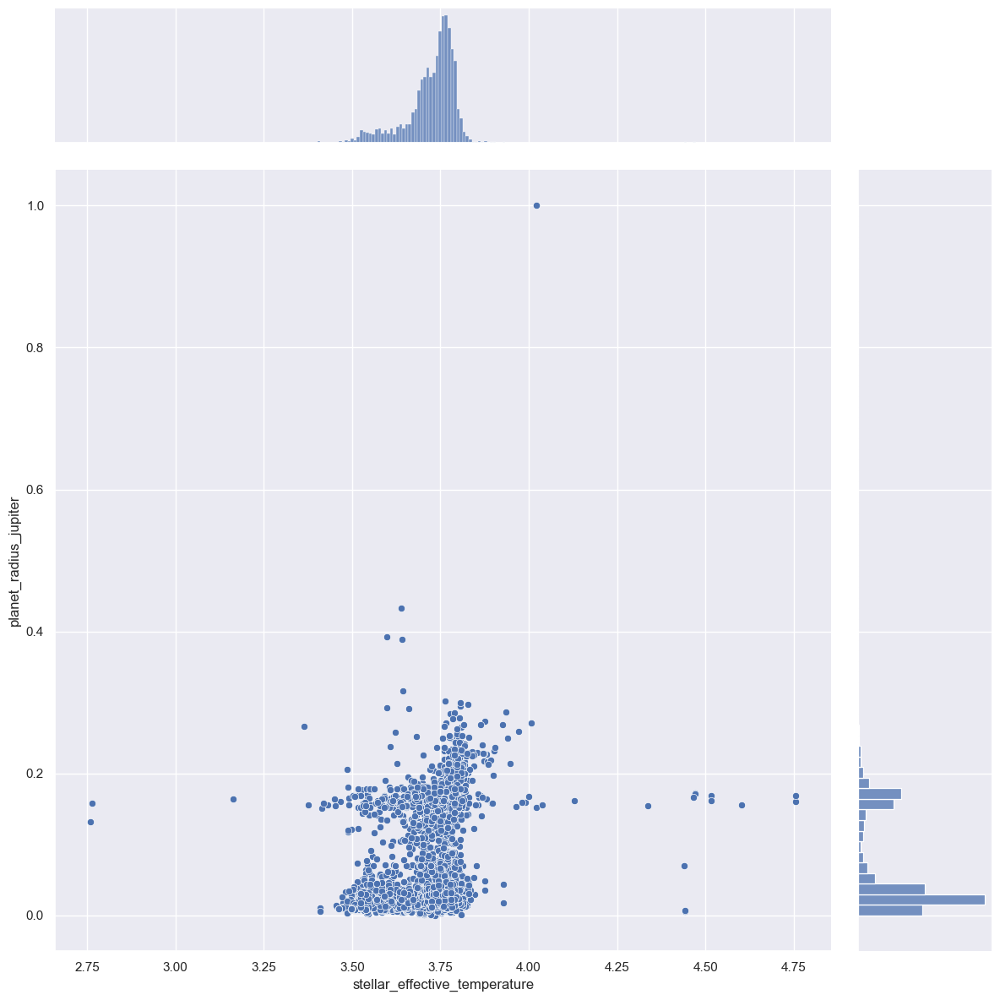

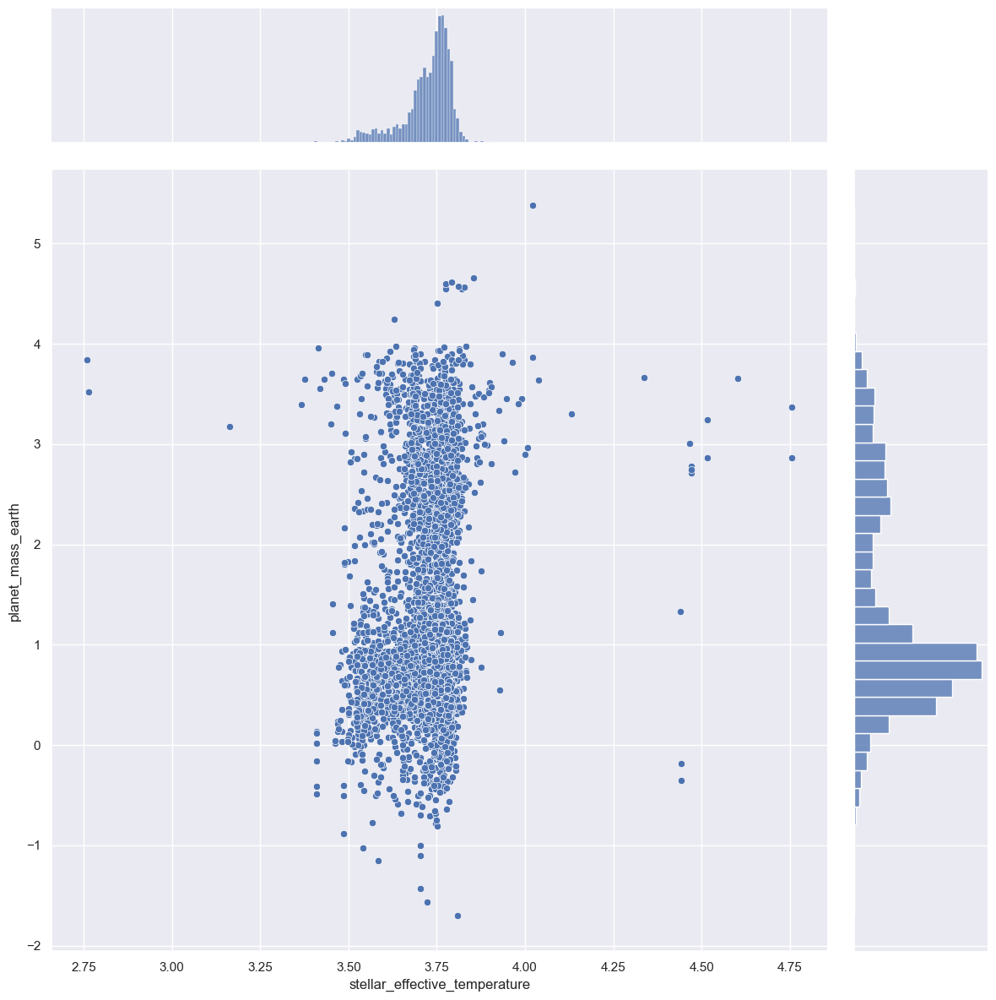

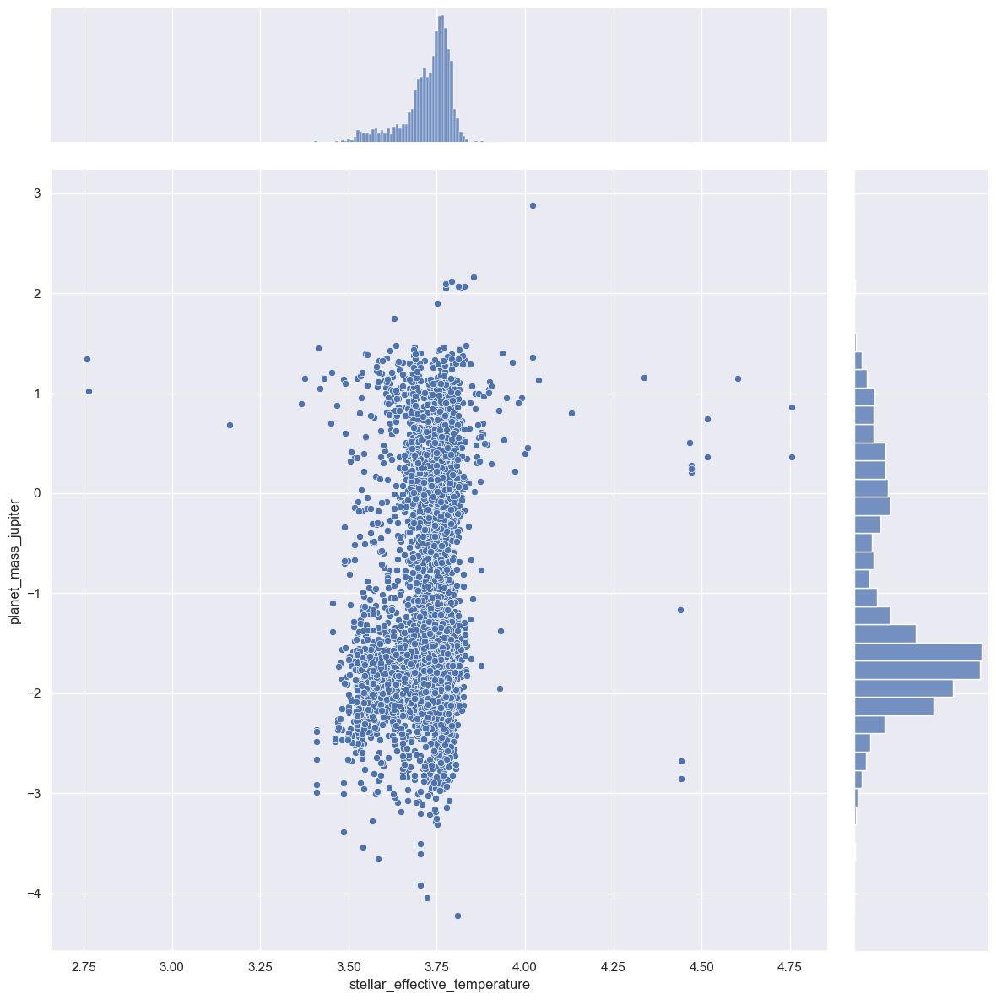

...

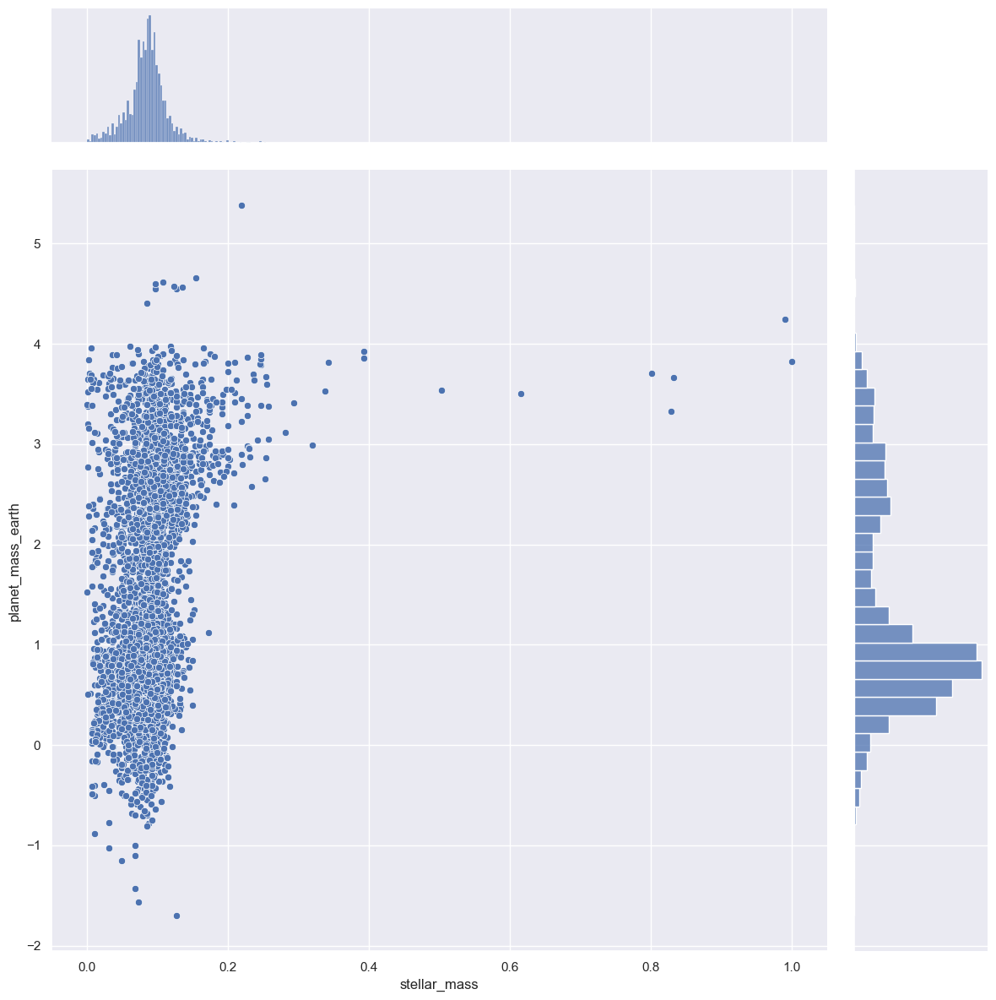

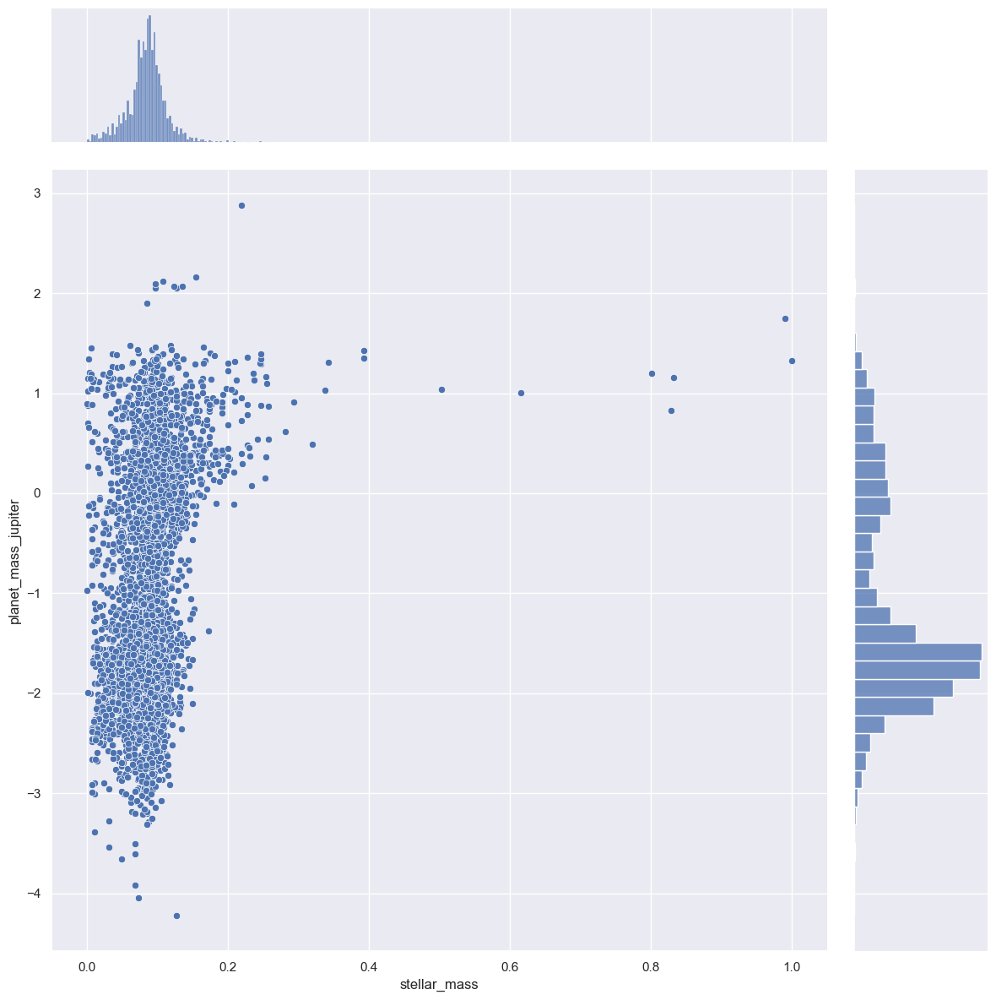

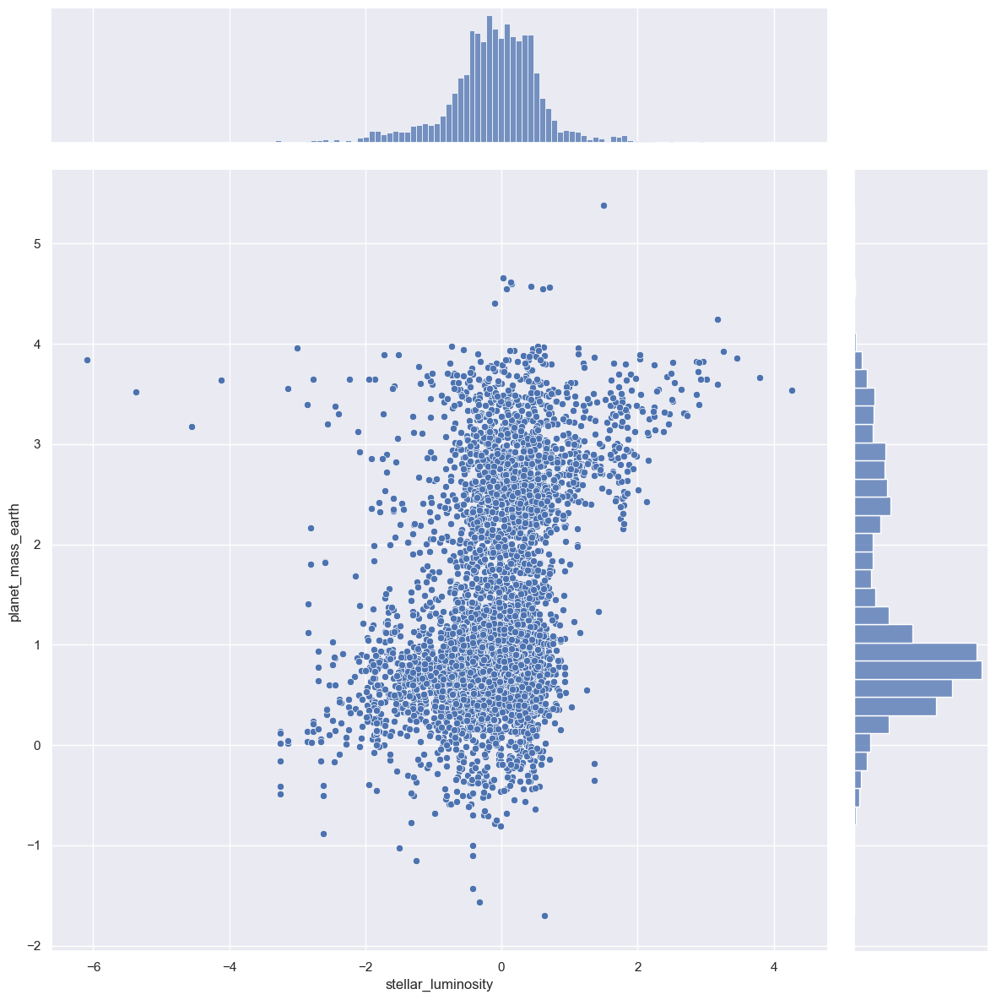

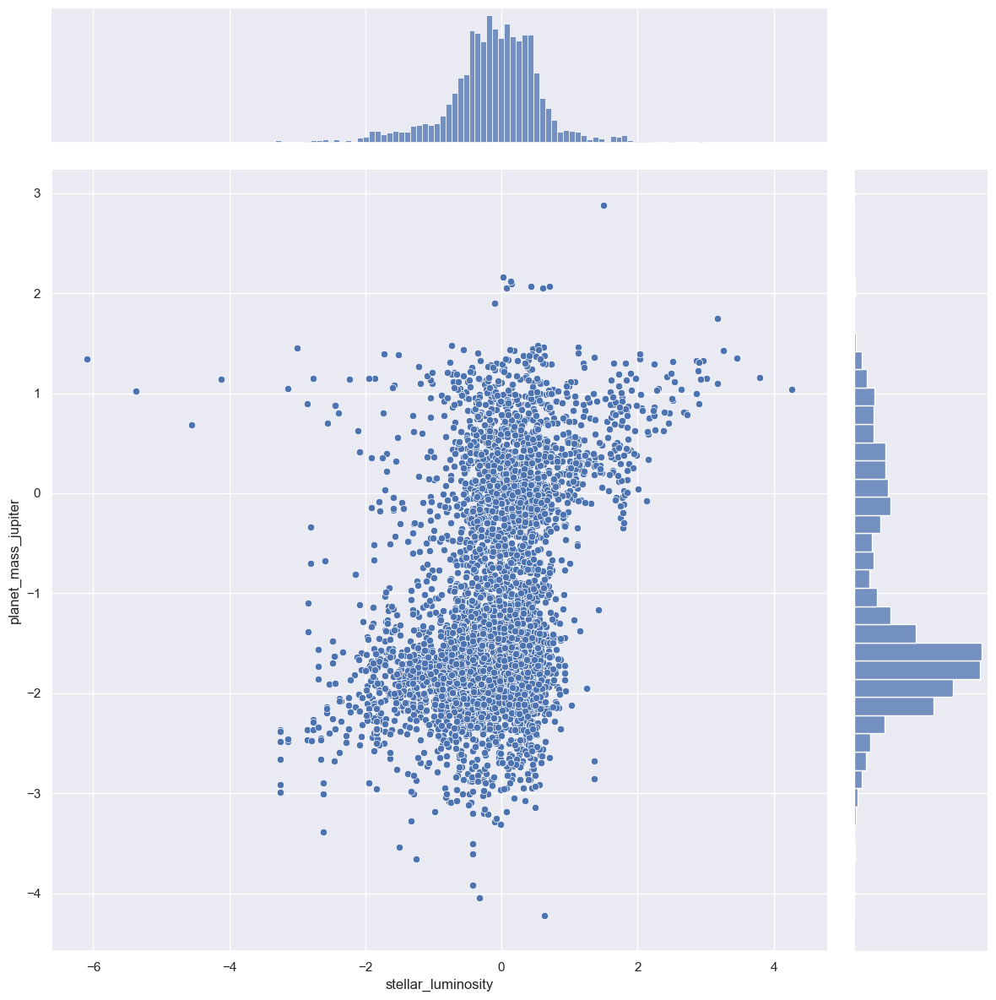

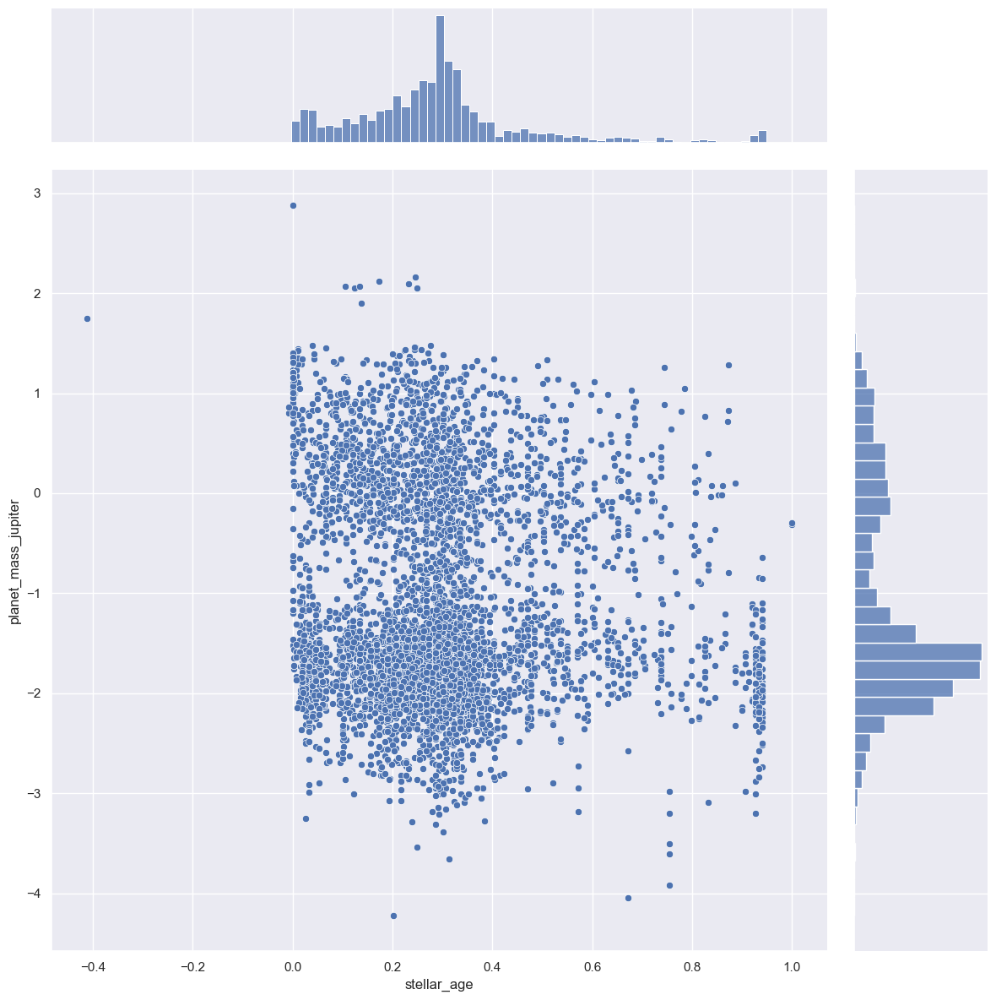

In [71]:
# Jointplot (Iterative Imputation)
var_combinations = [(var1, var2) for i, var1 in enumerate(df_num_iter_star.columns) for var2 in df_num_iter_planet.columns[i+1:]]
for var1, var2 in var_combinations:
    sns.jointplot(data=df_num_iter, x=var1, y=var2, height = 12)

From observation, we can see that the graph is quite difference when we use the unaltered dataset compared to the imputation ones.

And, we can see more clearly when using imputation

## Multivariate Analysis (Planet and Star Attributes)

Text(0.5, 1.0, 'Correlation of all Numeric Variables from Unaltered Data')

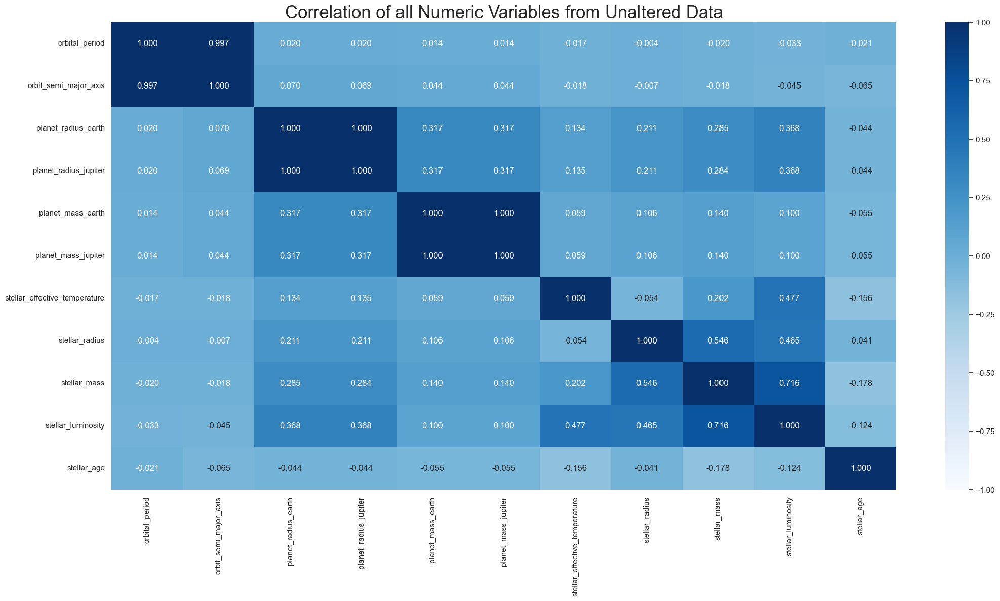

In [72]:
# Unaltered Data
f, axes = plt.subplots(figsize=(25,12))
sns.heatmap(df_num_imp.corr(), vmin = -1, vmax = 1, annot = True, fmt=".3f", cmap='Blues')
plt.title("Correlation of all Numeric Variables from Unaltered Data", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables from Dropping null values')

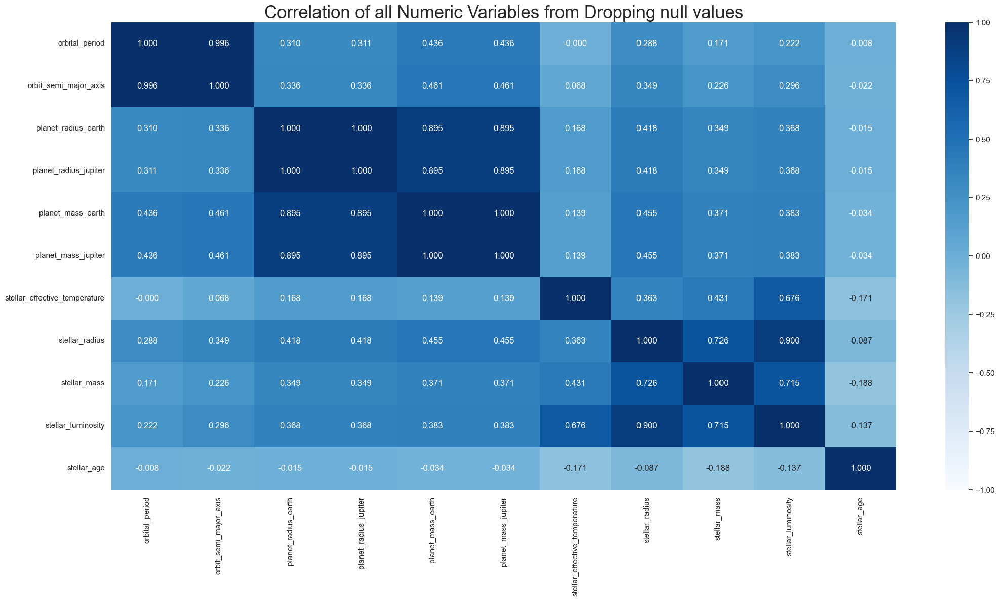

In [73]:
# Dropping Null Values
f, axes = plt.subplots(figsize=(25,12))
sns.heatmap(df_num_null.corr(), vmin = -1, vmax = 1, annot = True, fmt=".3f", cmap='Blues')
plt.title("Correlation of all Numeric Variables from Dropping null values", size = 25)

Text(0.5, 1.0, 'Correlation of all Numeric Variables from Iterative Imputation')

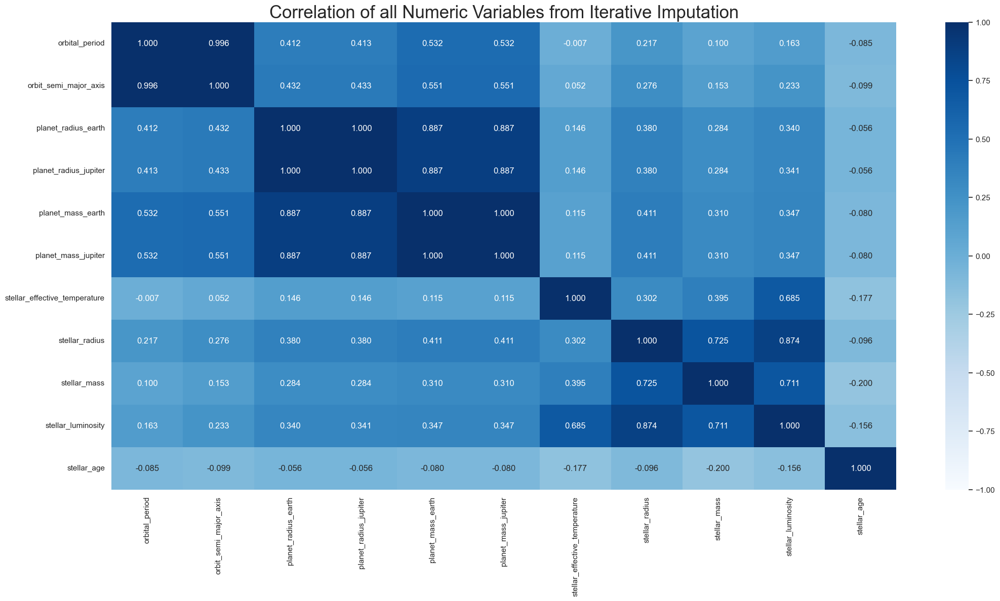

In [74]:
# Iterative Imputation
f, axes = plt.subplots(figsize=(25,12))
sns.heatmap(df_num_iter.corr(), vmin = -1, vmax = 1, annot = True, fmt=".3f", cmap='Blues')
plt.title("Correlation of all Numeric Variables from Iterative Imputation", size = 25)

From the heatmap, we can see that the correlation between planet and star atrributes are not really that high, with the highest correlation is 0.411 (Stellar Radius and Planet Mass)

There are only minor differences between dataset from dropping null value and from iterative imputation. <br>

However, there are quite major difference when we compare to the unaltered dataset

## Bivariate Analysis - Categorical vs Categorical

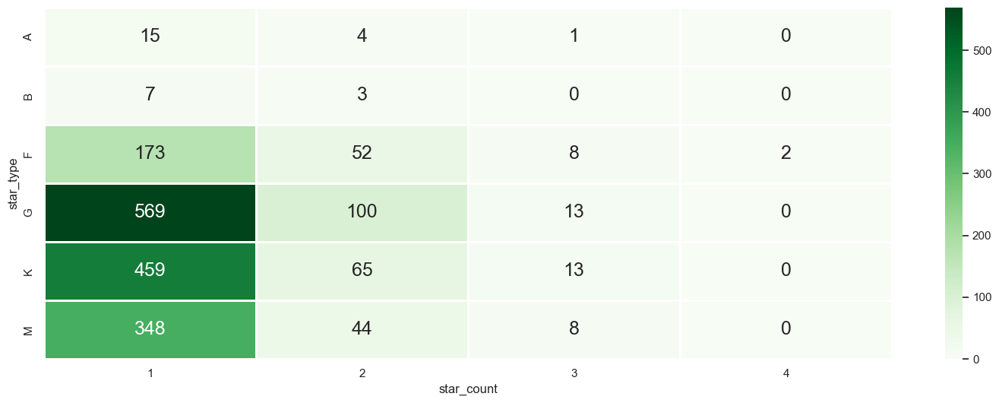

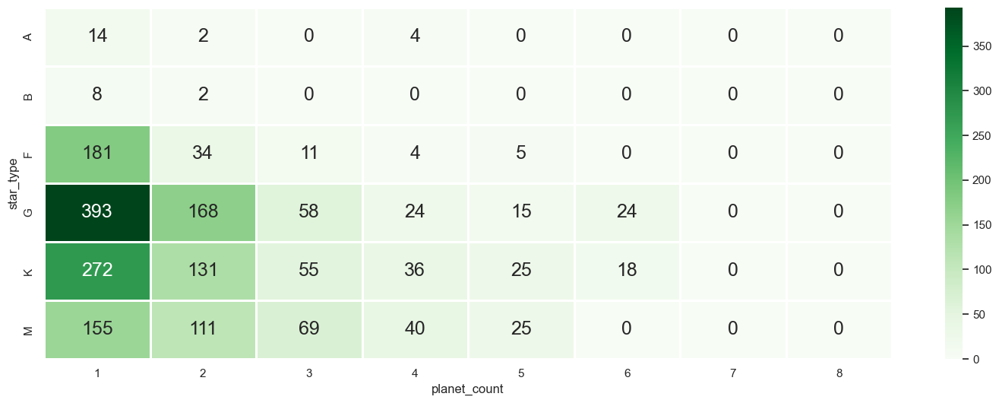

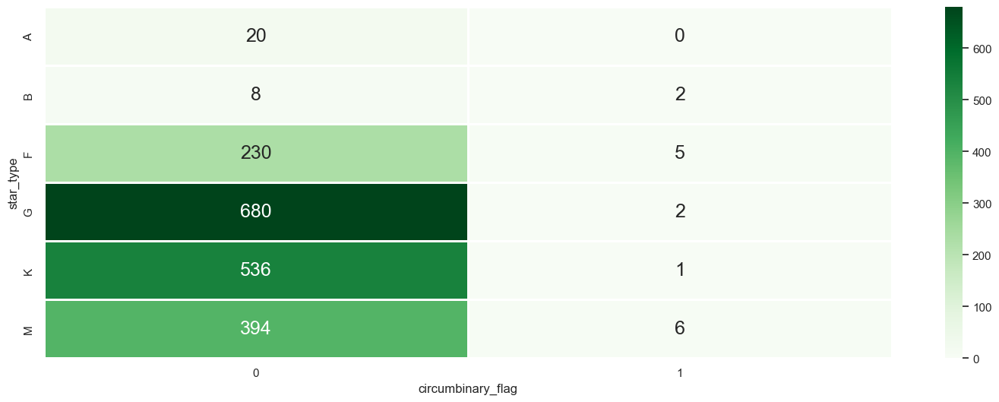

In [75]:
# Heatmap of correlation between star_type with other categorical variables

for i in df_cat_imp:
    if i == 'star_type':
        continue
    f, axes = plt.subplots(1, 1, figsize=(18,6))
    sns.heatmap(df_cat_imp.groupby([i,df_cat_imp['star_type']]).size().unstack().transpose(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "Greens", fmt = '.6g')

From this observation for categorical variables, we can see that most planets only orbit around a single star

## Machine Learning

The research questions guiding this project can be decomposed into simpler Machine Learning Problems, as:

#### 1. To what extent are stars that host exoplanets a representative sample of all stars in the universe?
This problem can be answered through the use of clustering and classification. Using star parameters such as "stellar_mass", "stellar_luminosity", "stellar_effective_temperature", "stellar_radius", and "stellar_age", the data points can be clustered to obtain different clusters corresponding to the "spectral_type" of the star. A Hertzsprung-Russell Diagram can be plotted for all the stars after clustering in this data set and the resulting plot can be compared with the original Hertzsprung-Russell Diagram. The goodness of the clustering can be evaluated by the supplied "spectral_type" labels. In addition, if the sampled stars do turn out to be representative, we can use them as the training data to predict "spectral_type" using the mentioned parameters.



#### 2. How to study the formation of planets in general around their host stars? What do the mass, radius, and distance (from the host star) of a planet depend on? Can these be predicted? (Regression - Lasso, Polynomial, Random Forest, Linear Regression, Support Vector Regression)
Planet formation is another interesting problem to consider. The formation of a planet in a newly formed star system is dependent on innumerable factors. Besides the dynamics of the gas cloud, the formation of planets is also dependent on several factors including orbit parameters, distance from the host star, type of star system, spectral classification of the host star, etc. This can be modeled as a regression problem where the desired output variables could be "planet_mass", "planet_radius_earth", or "orbit_semi-major_axis".

### 1. To what extent are stars that host exoplanets a representative sample of all stars in the universe?

For the clustering problem at hand, the KMeans++ and Bisecting KMeans Algorithms are the most suitable since they provide a direct method to control the number of clusters. The objective is to arrive at the 7 distinct stellar types through a clustering algorithm. However, Exploratory Data Analysis reveals that the data set does not have any O type stars. Therefore, the desired number of clusters is 6. Other clustering algorithms can also eventually be used to see if they can arrive at 6 clusters with proper hyperparameter tuning.

In [76]:
from sklearn.cluster import KMeans
from IPython.display import display

In [77]:
X1 = df_num_iter_star.copy()

In [78]:
kmeans = KMeans(n_clusters = 6, init = "k-means++")
kmeans.fit(X1)
labels = kmeans.predict(X1)
X1['Cluster'] = pd.Categorical(labels)

In [79]:
display(X1)

,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,Cluster
0,3.675962,1.278754,0.246112,2.243,0.213851,1
1,3.624591,1.474071,0.253431,2.430,0.104698,1
2,3.682416,1.041393,0.200366,1.763,0.302013,1
3,3.727379,-0.031517,0.082342,-0.153,0.261745,2
4,3.759668,0.053078,0.097896,0.097,0.496644,2
...,...,...,...,...,...,...
5317,3.789353,0.193125,0.118024,0.525,0.335570,4
5318,3.789353,0.193125,0.118024,0.525,0.335570,4
5319,3.789353,0.193125,0.118024,0.525,0.335570,4
5320,3.684486,1.049993,0.134492,1.800,0.341870,1


<AxesSubplot:xlabel='Cluster', ylabel='count'>

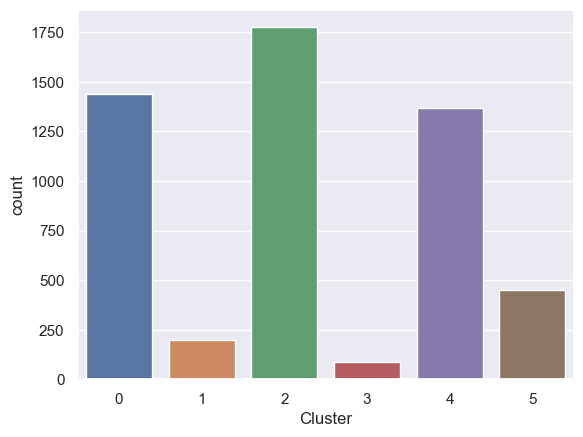

In [80]:
sns.countplot(data = X1, x = 'Cluster')

<AxesSubplot:xlabel='stellar_age', ylabel='Cluster'>

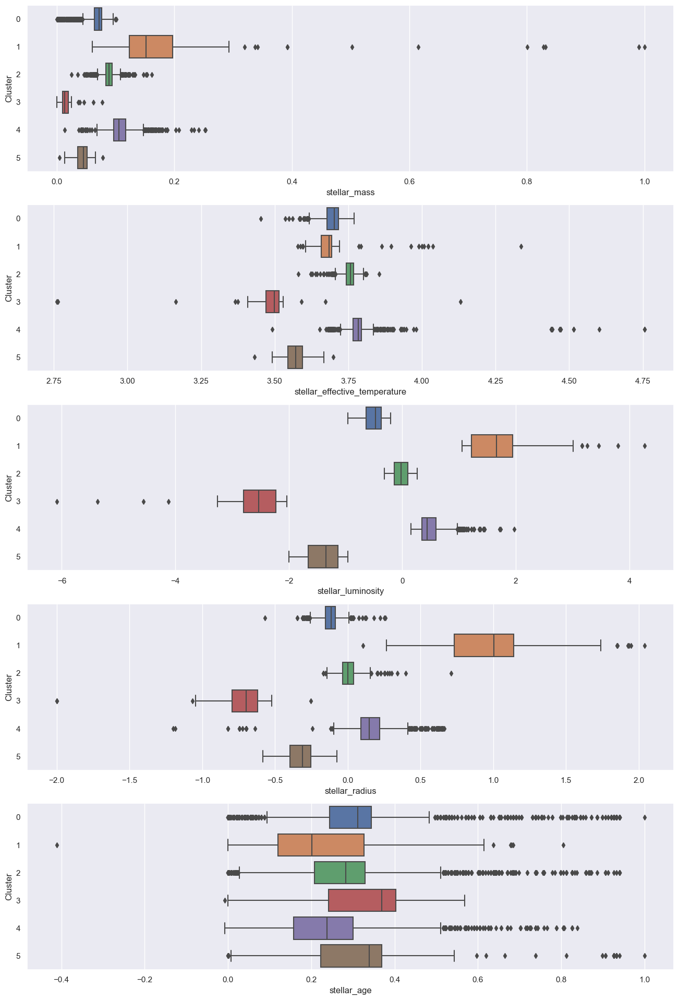

In [81]:
# Interpreting the Clusters
f, axes = plt.subplots(5, 1, figsize=(16,24))
sns.boxplot(x = 'stellar_mass', y = 'Cluster', data = X1, ax = axes[0])
sns.boxplot(x = 'stellar_effective_temperature', y = 'Cluster', data = X1, ax = axes[1])
sns.boxplot(x = 'stellar_luminosity', y = 'Cluster', data = X1, ax = axes[2])
sns.boxplot(x = 'stellar_radius', y = 'Cluster', data = X1, ax = axes[3])
sns.boxplot(x = 'stellar_age', y = 'Cluster', data = X1, ax = axes[4])

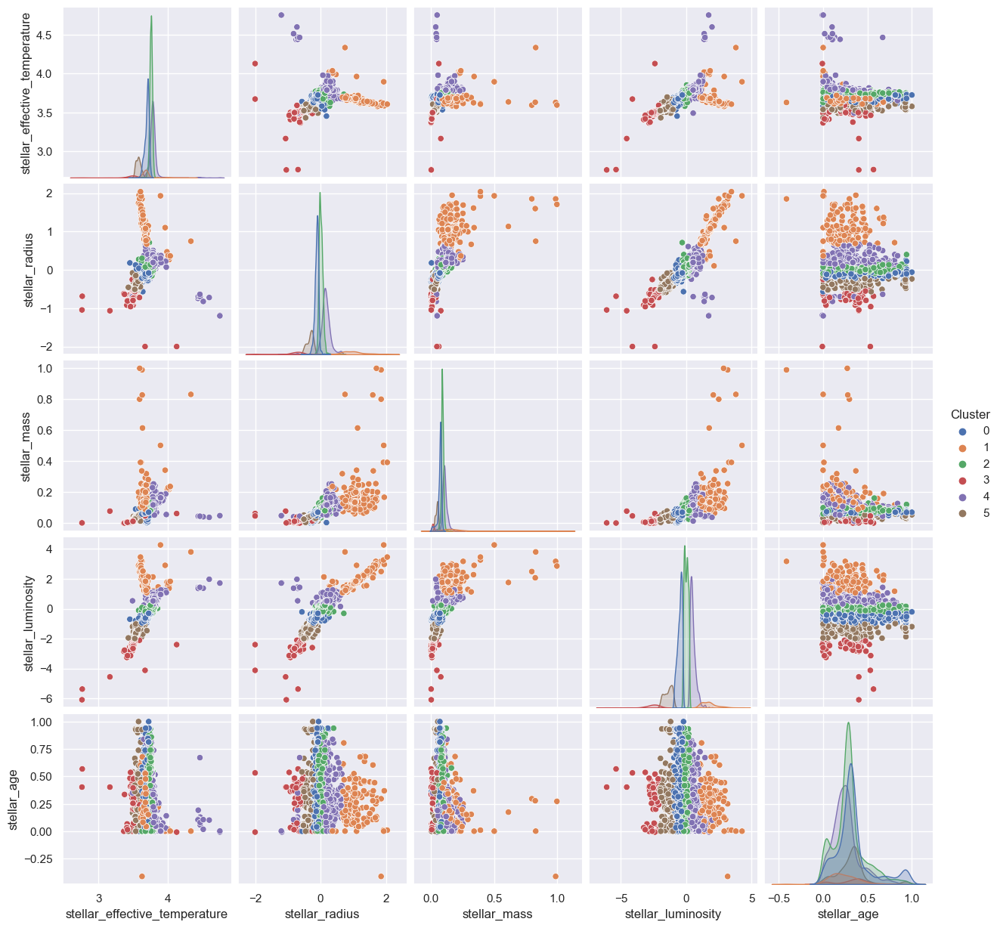

In [82]:
sns.pairplot(data = X1, hue = "Cluster")
plt.show()

In particular, we can plot "stellar_luminosity" vs "stellar_effective_temperature" to visualize the Hertzsprung-Russell Diagram.

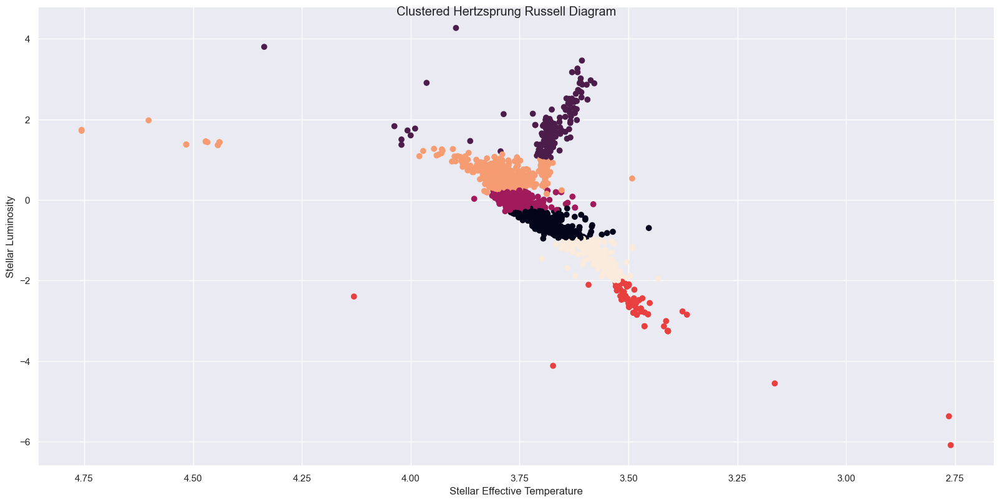

In [83]:
f, axes = plt.subplots(1,1, figsize = (16,8))
scatter = axes.scatter(data = X1, x = 'stellar_effective_temperature', y = 'stellar_luminosity', c = 'Cluster')

axes = plt.gca()
axes.invert_xaxis()
f.tight_layout()
axes.set_xlabel('Stellar Effective Temperature')
axes.set_ylabel('Stellar Luminosity')
f.suptitle('Clustered Hertzsprung Russell Diagram')
plt.show()

# produce a legend with the unique colors from the scatter
legend1 = axes.legend(*scatter.legend_elements(),
                    loc="lower left", title="Clusters")
axes.add_artist(legend1)
plt.show()

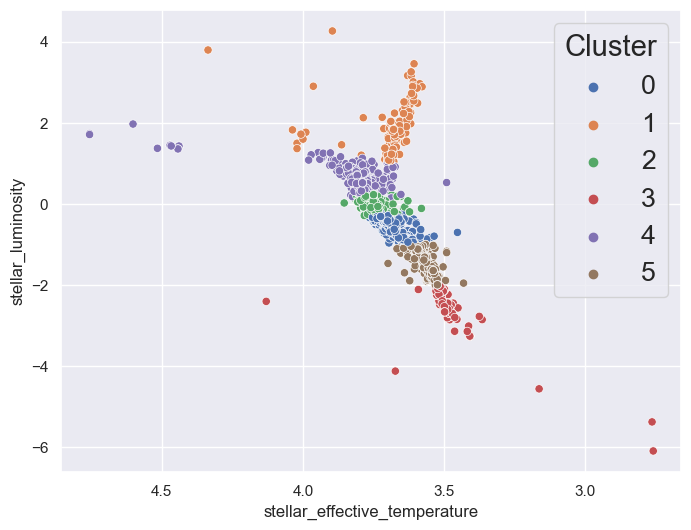

In [84]:
f,axes = plt.subplots(1,1, figsize = (8,6))
sns.set(font_scale = 1.75)
axes = sns.scatterplot(x = 'stellar_effective_temperature', y = 'stellar_luminosity', data = X1, hue= 'Cluster', cmap = '')
axes.invert_xaxis()

<AxesSubplot:xlabel='Cluster'>

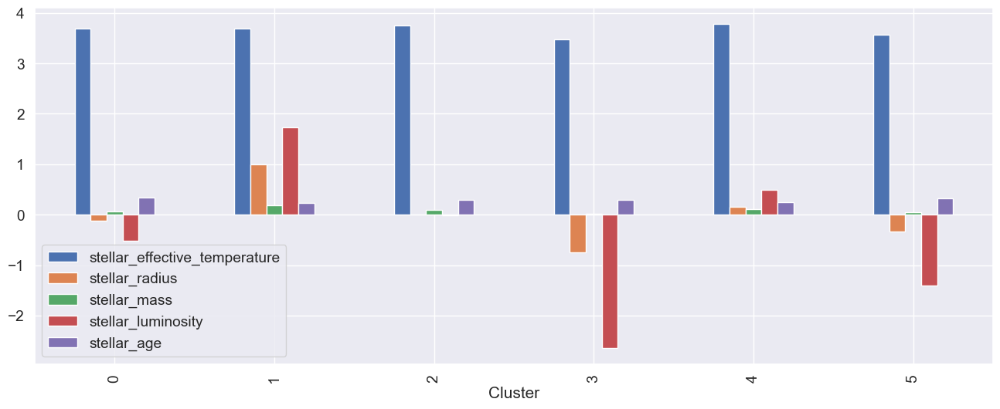

In [85]:
# Average behavior of each cluster
sns.set(font_scale = 1.25)
cluster_data = pd.DataFrame(X1.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

#### DBSCAN:

In [86]:
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

In [87]:
X2 = df_num_iter_star.copy()

In [88]:
neigh = NearestNeighbors(n_neighbors=5)
nbrs = neigh.fit(X2)
distances, indices = nbrs.kneighbors(X2)

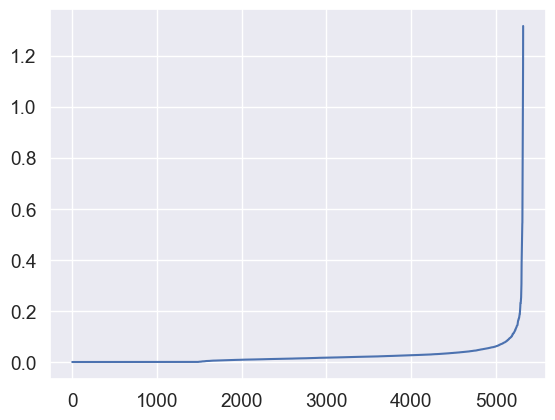

In [89]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

Based on this elbow plot, the optimal value for eps is 0.1

In [90]:
scan = DBSCAN(eps = 0.1, min_samples = 5)
scan.fit(X2)
labels = kmeans.predict(X2)
X2['Cluster'] = pd.Categorical(labels)

In [91]:
display(X2.head())

,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,Cluster
0,3.675962,1.278754,0.246112,2.243,0.213851,1
1,3.624591,1.474071,0.253431,2.430,0.104698,1
2,3.682416,1.041393,0.200366,1.763,0.302013,1
3,3.727379,-0.031517,0.082342,-0.153,0.261745,2
4,3.759668,0.053078,0.097896,0.097,0.496644,2


<AxesSubplot:xlabel='Cluster', ylabel='count'>

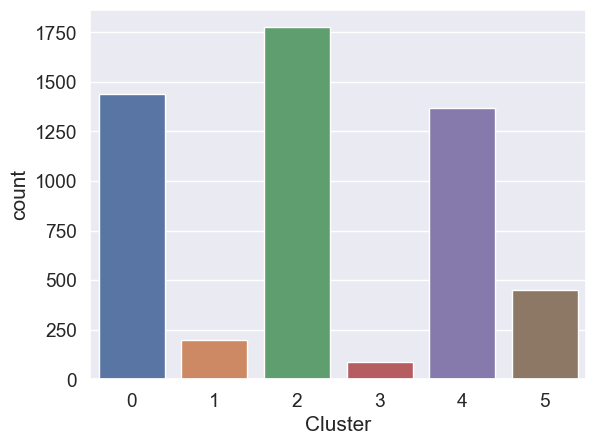

In [92]:
sns.countplot(data = X2, x = 'Cluster')

<AxesSubplot:xlabel='stellar_age', ylabel='Cluster'>

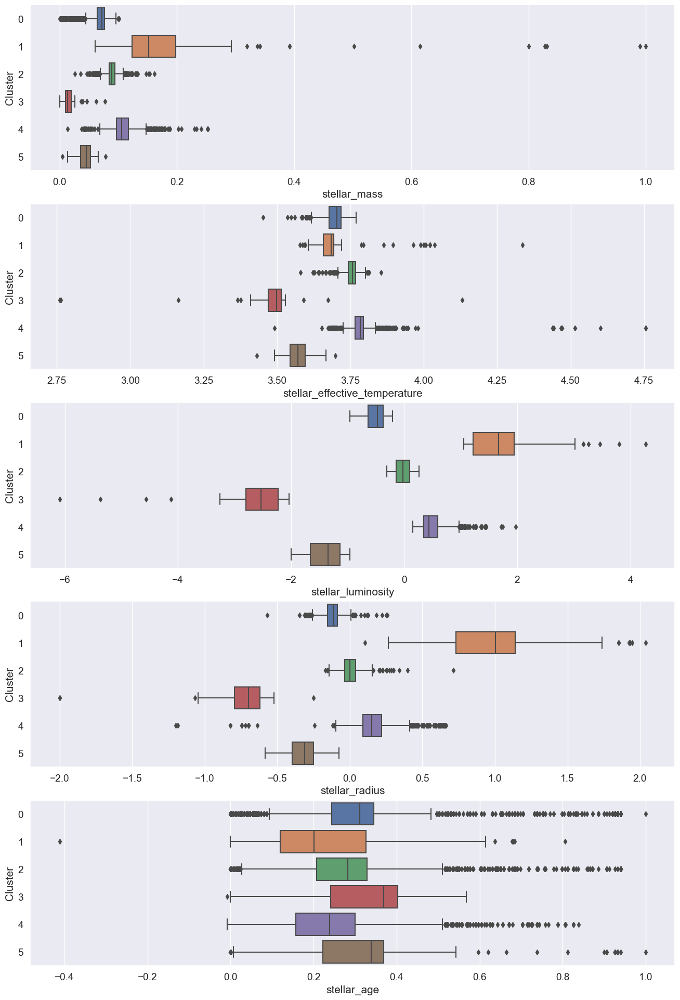

In [93]:
# Interpreting the Clusters
f, axes = plt.subplots(5, 1, figsize=(16,24))
sns.boxplot(x = 'stellar_mass', y = 'Cluster', data = X2, ax = axes[0])
sns.boxplot(x = 'stellar_effective_temperature', y = 'Cluster', data = X2, ax = axes[1])
sns.boxplot(x = 'stellar_luminosity', y = 'Cluster', data = X2, ax = axes[2])
sns.boxplot(x = 'stellar_radius', y = 'Cluster', data = X2, ax = axes[3])
sns.boxplot(x = 'stellar_age', y = 'Cluster', data = X2, ax = axes[4])

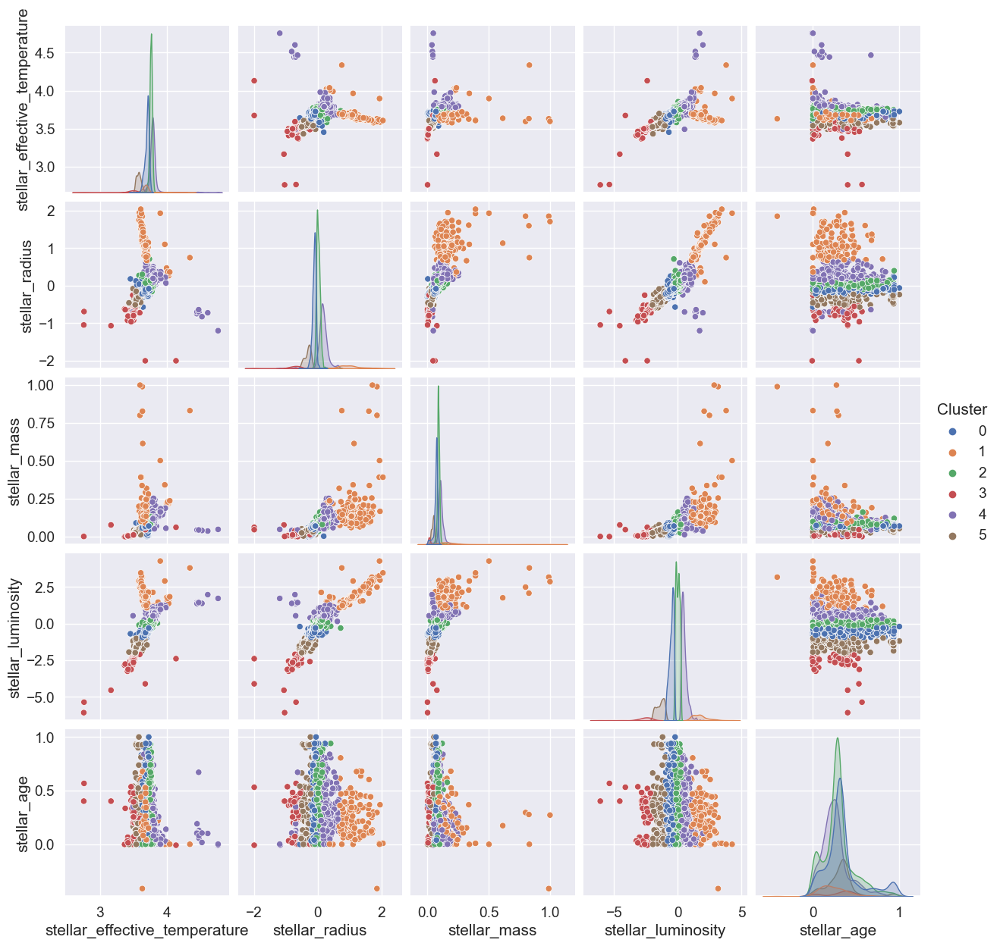

In [94]:
sns.pairplot(data = X2, hue = "Cluster")
plt.show()

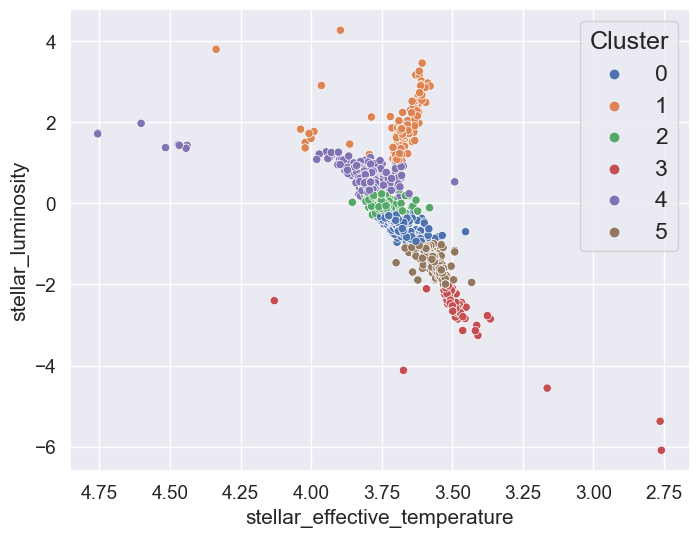

In [95]:
f,axes = plt.subplots(1,1, figsize = (8,6))
sns.set(font_scale = 1.5)
axes = sns.scatterplot(x = 'stellar_effective_temperature', y = 'stellar_luminosity', data = X2, hue= 'Cluster')
axes.invert_xaxis()

<AxesSubplot:xlabel='Cluster'>

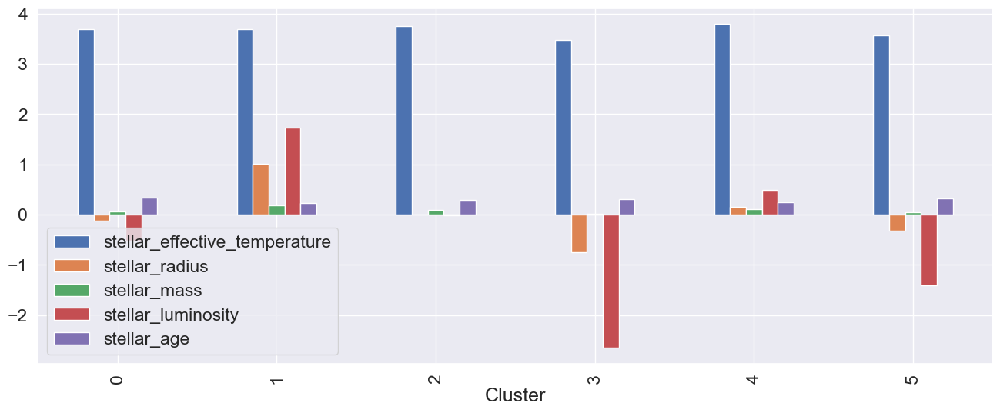

In [96]:
# Average behavior of each cluster
cluster_data = pd.DataFrame(X2.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

### 2. How to study the formation of planets in general around their host stars? What do the mass, radius, and distance (from the host star) of a planet depend on? Can these be predicted?

In [97]:
from sklearn.model_selection import train_test_split

In [98]:
display(df_num_iter.head()) # Normalized + Iteratively Imputed
display(df_cat.head())

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_radius_jupiter,planet_mass_earth,planet_mass_jupiter,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age
0,2.513258,0.110590,0.153207,0.153331,3.789975,1.287802,3.675962,1.278754,0.246112,2.243,0.213851
1,2.712835,0.184691,0.155803,0.154786,3.670692,1.168497,3.624591,1.474071,0.253431,2.430,0.104698
2,2.269139,-0.080922,0.163591,0.163515,3.183412,0.681241,3.682416,1.041393,0.200366,1.763,0.302013
3,3.246754,0.442961,0.159697,0.159150,3.412754,0.910561,3.727379,-0.031517,0.082342,-0.153,0.261745
4,2.902275,0.220108,0.171378,0.170788,2.752615,0.250420,3.759668,0.053078,0.097896,0.097,0.496644


,circumbinary_flag,controversial_flag,star_count,planet_count,moon_count,discovery_method,discovery_year,discovery_facility,controversial_flag,stellar_metallicity_ratio,star_type
0,0,0,2,1,0,Radial Velocity,2007,Xinglong Station,0,[Fe/H],G
1,0,0,1,1,0,Radial Velocity,2009,Thueringer Landessternwarte Tautenburg,0,[Fe/H],K
2,0,0,1,1,0,Radial Velocity,2008,Okayama Astrophysical Observatory,0,[Fe/H],K
3,0,0,1,2,0,Radial Velocity,2002,W. M. Keck Observatory,0,[Fe/H],K
4,0,0,3,1,0,Radial Velocity,1996,Multiple Observatories,0,[Fe/H],G


In [99]:
reg_data = pd.concat([df_num_iter.copy(), df_cat[['star_count', 'planet_count']]], axis = 1)
reg_data['star_count'] = reg_data['star_count'].astype('int64')
reg_data['planet_count'] = reg_data['planet_count'].astype('int64')
reg_data.drop(['planet_radius_jupiter'], axis = 1, inplace = True)
reg_data.drop(['planet_mass_jupiter'], axis = 1, inplace = True)

display(reg_data.head())
display(reg_data.info())

,orbital_period,orbit_semi_major_axis,planet_radius_earth,planet_mass_earth,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,star_count,planet_count
0,2.513258,0.110590,0.153207,3.789975,3.675962,1.278754,0.246112,2.243,0.213851,2,1
1,2.712835,0.184691,0.155803,3.670692,3.624591,1.474071,0.253431,2.430,0.104698,1,1
2,2.269139,-0.080922,0.163591,3.183412,3.682416,1.041393,0.200366,1.763,0.302013,1,1
3,3.246754,0.442961,0.159697,3.412754,3.727379,-0.031517,0.082342,-0.153,0.261745,1,2
4,2.902275,0.220108,0.171378,2.752615,3.759668,0.053078,0.097896,0.097,0.496644,3,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5322 entries, 0 to 5321
Data columns (total 11 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   orbital_period                 5322 non-null   float64
 1   orbit_semi_major_axis          5322 non-null   float64
 2   planet_radius_earth            5322 non-null   float64
 3   planet_mass_earth              5322 non-null   float64
 4   stellar_effective_temperature  5322 non-null   float64
 5   stellar_radius                 5322 non-null   float64
 6   stellar_mass                   5322 non-null   float64
 7   stellar_luminosity             5322 non-null   float64
 8   stellar_age                    5322 non-null   float64
 9   star_count                     5322 non-null   int64  
 10  planet_count                   5322 non-null   int64  
dtypes: float64(9), int64(2)
memory usage: 457.5 KB


None

<AxesSubplot:>

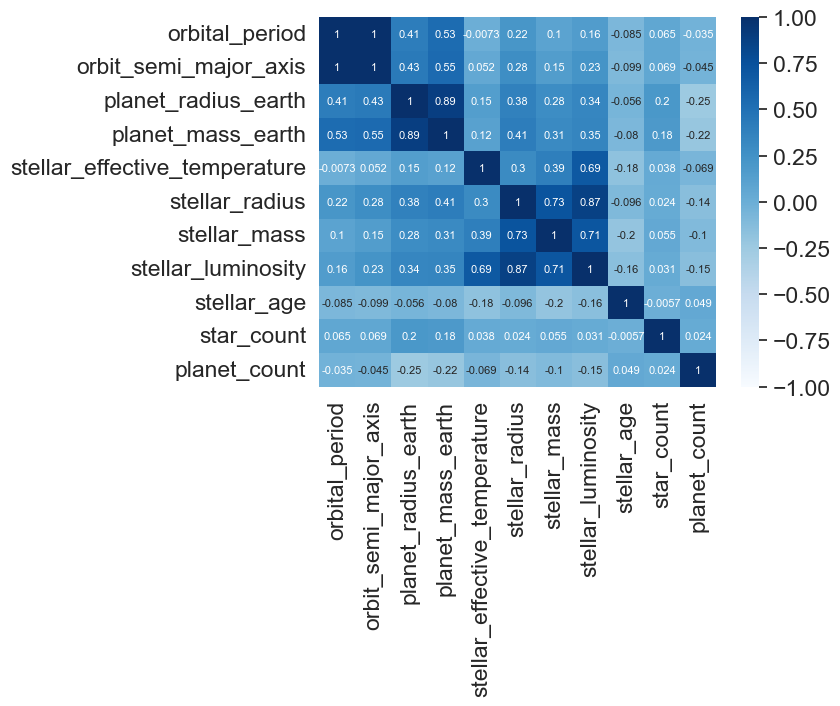

In [100]:
sns.heatmap(reg_data.corr(), annot = True, vmin = -1, vmax = 1, cmap = "Blues", annot_kws = {'size':8})

#### Predicting Distance from the Host Star:
The semi-major axis of a planet's orbit is a good estimate of its distance from its host star. Since planetary orbits are elliptical, there is no constant radius that can be taken as a distance. The required distance varies between the lengths of the semi-minor axis (minimum) and the semi-major axis (maximum). Here, we take the maximum distance given by the semi-major axis as the output variable, to be predicted by every other variable in the reg_data DataFrame

In [101]:
y = reg_data[['orbit_semi_major_axis']]
X = reg_data[[i for i in reg_data.columns if i not in ['orbit_semi_major_axis', 'orbital_period']]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

display(X.head())
display(y.head())

,planet_radius_earth,planet_mass_earth,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,star_count,planet_count
0,0.153207,3.789975,3.675962,1.278754,0.246112,2.243,0.213851,2,1
1,0.155803,3.670692,3.624591,1.474071,0.253431,2.430,0.104698,1,1
2,0.163591,3.183412,3.682416,1.041393,0.200366,1.763,0.302013,1,1
3,0.159697,3.412754,3.727379,-0.031517,0.082342,-0.153,0.261745,1,2
4,0.171378,2.752615,3.759668,0.053078,0.097896,0.097,0.496644,3,1


,orbit_semi_major_axis
0,0.110590
1,0.184691
2,-0.080922
3,0.442961
4,0.220108


##### Linear Regression:

In [102]:
from sklearn.linear_model import LinearRegression

In [103]:
# Model Training
linreg = LinearRegression()
linreg.fit(X_train, y_train)

# Prediction
linreg_y_train_pred = linreg.predict(X_train)
linreg_y_test_pred = linreg.predict(X_test)

# Measuring Model Accuracy
linreg_r_train = linreg.score(X_train, y_train)
linreg_r_test = linreg.score(X_test, y_test)

print(linreg_r_train, linreg_r_test)

0.33963817364648174 0.34297673912170945


##### Cross-Validation Based Ridge Regression:

In [104]:
alpha_list = [i/20 for i in range(1, 21)]

In [105]:
from sklearn.linear_model import RidgeCV

In [106]:
# Model Training
ridge = RidgeCV(alphas = alpha_list)
ridge.fit(X_train, y_train)

# Prediction
ridge_y_train_pred = ridge.predict(X_train)
ridge_y_test_pred = ridge.predict(X_test)

# Measuring Model Accuracy
selected_alpha = ridge.alpha_
ridge_r_train = ridge.score(X_train, y_train)
ridge_r_test = ridge.score(X_train, y_train)

print(ridge_r_train, ridge_r_test, selected_alpha)

0.339030819500423 0.339030819500423 0.85


##### Cross-Validation Based Lasso Regression:

In [107]:
from sklearn.linear_model import LassoCV

In [108]:
# Model Training
lasso = LassoCV(alphas = alpha_list)
lasso.fit(X_train, y_train)

# Prediction
lasso_y_train_pred = lasso.predict(X_train)
lasso_y_test_pred = lasso.predict(X_test)

# Measuring Model Accuracy
selected_alpha = lasso.alpha_
lasso_r_train = lasso.score(X_train, y_train)
lasso_r_test = ridge.score(X_train, y_train)

print(lasso_r_train, lasso_r_test, selected_alpha)

0.3009682629463224 0.339030819500423 0.05


C:\Users\alexa\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:1571: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


##### Random Forest Regression:

In [109]:
from sklearn.ensemble import RandomForestRegressor

In [110]:
# Model Training
rfr = RandomForestRegressor(200, criterion = 'squared_error', oob_score = True)
rfr.fit(X_train, y_train)

# Prediction
rfr_y_train_pred = rfr.predict(X_train)
rfr_y_test_pred = rfr.predict(X_test)

# Measuring Model Accuracy
rfr_r_train = rfr.score(X_train, y_train)
rfr_r_test = rfr.score(X_test, y_test)

print(rfr_r_train, rfr_r_test)

C:\Users\alexa\AppData\Local\Temp\ipykernel_9692\2215401981.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(X_train, y_train)


0.9525467499989306 0.6437857074711324


##### Support Vector Machine (SVM) Regression:

In [111]:
from sklearn.svm import SVR

###### Polynomial Kernel:

In [112]:
svr_score = {"Degree":[], "Train":[], "Test":[]}
for i in range(1,11):
    svr = SVR(kernel = 'poly', degree = i)
    svr.fit(X_train, y_train)
    svr_score["Degree"].append(i)
    svr_score["Train"].append(svr.score(X_train, y_train))
    svr_score["Test"].append(svr.score(X_test, y_test))

svr_score = pd.DataFrame(svr_score)
display(svr_score)

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

,Degree,Train,Test
0,1,0.319184,0.319997
1,2,0.372924,0.353217
2,3,0.404073,0.357869
3,4,0.417187,0.333218
4,5,0.415393,0.340161
5,6,0.446114,0.354581
6,7,0.503206,0.124036
7,8,0.536930,-0.869982
8,9,0.555455,-3.490464
9,10,0.569836,-12.747970


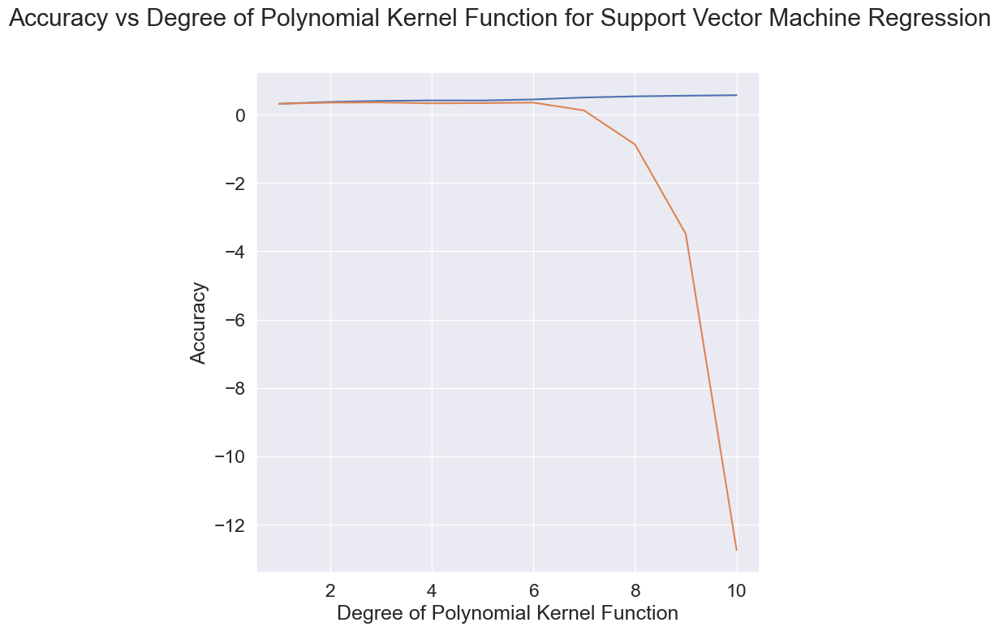

In [113]:
f, axes = plt.subplots(1,1, figsize = (8,8))
plt.plot(svr_score['Degree'], svr_score['Train'])
plt.plot(svr_score['Degree'], svr_score['Test'])
axes.set_xlabel('Degree of Polynomial Kernel Function')
axes.set_ylabel('Accuracy')
f.suptitle('Accuracy vs Degree of Polynomial Kernel Function for Support Vector Machine Regression')
plt.show()

##### Radial Basis Function (RBF) Kernel:

In [114]:
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)

print(svr_rbf.score(X_train, y_train))
print(svr_rbf.score(X_test, y_test))

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.40753625459473486
0.3707093184506698


##### Linear Kernel:

In [115]:
svr_linear = SVR(kernel = 'linear')
svr_linear.fit(X_train, y_train)

print(svr_linear.score(X_train, y_train))
print(svr_linear.score(X_test, y_test))

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.3319917887835919
0.3417410581605357


#### Predicting Mass of the Planet formed:

In [116]:
y = reg_data[['planet_mass_earth']]
X = reg_data[[i for i in reg_data.columns if i not in ['planet_mass_earth','orbital_period']]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

display(X.head())
display(y.head())

,orbit_semi_major_axis,planet_radius_earth,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,star_count,planet_count
0,0.110590,0.153207,3.675962,1.278754,0.246112,2.243,0.213851,2,1
1,0.184691,0.155803,3.624591,1.474071,0.253431,2.430,0.104698,1,1
2,-0.080922,0.163591,3.682416,1.041393,0.200366,1.763,0.302013,1,1
3,0.442961,0.159697,3.727379,-0.031517,0.082342,-0.153,0.261745,1,2
4,0.220108,0.171378,3.759668,0.053078,0.097896,0.097,0.496644,3,1


,planet_mass_earth
0,3.789975
1,3.670692
2,3.183412
3,3.412754
4,2.752615


##### Linear Regression:

In [117]:
# Model Training
linreg = LinearRegression()
linreg.fit(X_train, y_train)

# Prediction
linreg_y_train_pred = linreg.predict(X_train)
linreg_y_test_pred = linreg.predict(X_test)

# Measuring Model Accuracy
linreg_r_train = linreg.score(X_train, y_train)
linreg_r_test = linreg.score(X_test, y_test)

print(linreg_r_train, linreg_r_test)

0.8383471085515286 0.7698462281694669


##### Cross-Validation Based Ridge Regression:

In [118]:
# Model Training
ridge = RidgeCV(alphas = alpha_list)
ridge.fit(X_train, y_train)

# Prediction
ridge_y_train_pred = ridge.predict(X_train)
ridge_y_test_pred = ridge.predict(X_test)

# Measuring Model Accuracy
selected_alpha = ridge.alpha_
ridge_r_train = ridge.score(X_train, y_train)
ridge_r_test = ridge.score(X_train, y_train)

print(ridge_r_train, ridge_r_test, selected_alpha)

0.8383408105849686 0.8383408105849686 0.05


##### Cross-Validation Based Lasso Regression:

In [119]:
# Model Training
lasso = LassoCV(alphas = alpha_list)
lasso.fit(X_train, y_train)

# Prediction
lasso_y_train_pred = lasso.predict(X_train)
lasso_y_test_pred = lasso.predict(X_test)

# Measuring Model Accuracy
selected_alpha = lasso.alpha_
lasso_r_train = lasso.score(X_train, y_train)
lasso_r_test = ridge.score(X_train, y_train)

print(lasso_r_train, lasso_r_test, selected_alpha)

0.3810731923113979 0.8383408105849686 0.05


C:\Users\alexa\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:1571: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


##### Random Forest Regression:

In [120]:
# Model Training
rfr = RandomForestRegressor(100, criterion = 'squared_error', oob_score = True)
rfr.fit(X_train, y_train)

# Prediction
rfr_y_train_pred = rfr.predict(X_train)
rfr_y_test_pred = rfr.predict(X_test)

# Measuring Model Accuracy
rfr_r_train = rfr.score(X_train, y_train)
rfr_r_test = rfr.score(X_test, y_test)

print(rfr_r_train, rfr_r_test)

C:\Users\alexa\AppData\Local\Temp\ipykernel_9692\2404830921.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(X_train, y_train)


0.9889406043530522 0.9227067835036565


##### Support Vector Machine (SVM) Regression:

###### Polynomial Kernel:

In [121]:
svr_score = {"Degree":[], "Train":[], "Test":[]}
for i in range(1,11):
    svr = SVR(kernel = 'poly', degree = i)
    svr.fit(X_train, y_train)
    svr_score["Degree"].append(i)
    svr_score["Train"].append(svr.score(X_train, y_train))
    svr_score["Test"].append(svr.score(X_test, y_test))

svr_score = pd.DataFrame(svr_score)
display(svr_score)

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

,Degree,Train,Test
0,1,0.743260,0.748583
1,2,0.809208,0.794574
2,3,0.827292,0.803908
3,4,0.836538,0.813081
4,5,0.840128,0.810235
5,6,0.842863,0.813504
6,7,0.845579,0.817884
7,8,0.847497,0.799540
8,9,0.849202,0.740071
9,10,0.851216,0.652926


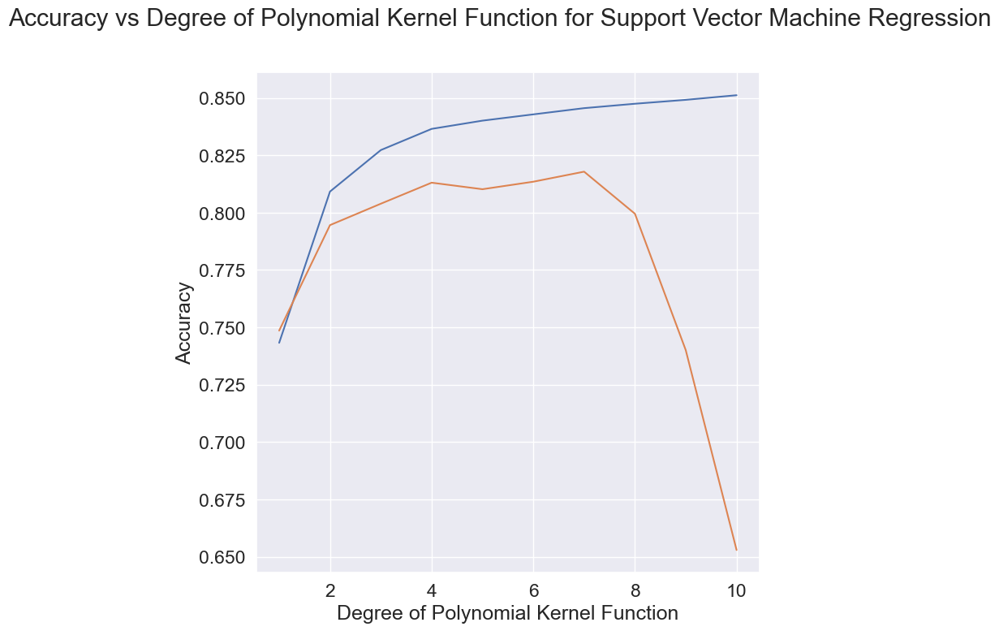

In [122]:
f, axes = plt.subplots(1,1, figsize = (8,8))
plt.plot(svr_score['Degree'], svr_score['Train'])
plt.plot(svr_score['Degree'], svr_score['Test'])
axes.set_xlabel('Degree of Polynomial Kernel Function')
axes.set_ylabel('Accuracy')
f.suptitle('Accuracy vs Degree of Polynomial Kernel Function for Support Vector Machine Regression')
plt.show()

###### Radial Basis Function (RBF) Kernel:

In [123]:
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)

print(svr_rbf.score(X_train, y_train))
print(svr_rbf.score(X_test, y_test))

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.8047507216841194
0.8051705540815719


###### Linear Kernel:

In [124]:
svr_linear = SVR(kernel = 'linear')
svr_linear.fit(X_train, y_train)

print(svr_linear.score(X_train, y_train))
print(svr_linear.score(X_test, y_test))

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.8367416932906487
0.7777703860109935


#### Predicting the Radius of the Planet Formed:

In [125]:
y = reg_data[['planet_radius_earth']]
X = reg_data[[i for i in reg_data.columns if i not in ['planet_radius_earth','orbital_period']]]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

display(X.head())
display(y.head())

,orbit_semi_major_axis,planet_mass_earth,stellar_effective_temperature,stellar_radius,stellar_mass,stellar_luminosity,stellar_age,star_count,planet_count
0,0.110590,3.789975,3.675962,1.278754,0.246112,2.243,0.213851,2,1
1,0.184691,3.670692,3.624591,1.474071,0.253431,2.430,0.104698,1,1
2,-0.080922,3.183412,3.682416,1.041393,0.200366,1.763,0.302013,1,1
3,0.442961,3.412754,3.727379,-0.031517,0.082342,-0.153,0.261745,1,2
4,0.220108,2.752615,3.759668,0.053078,0.097896,0.097,0.496644,3,1


,planet_radius_earth
0,0.153207
1,0.155803
2,0.163591
3,0.159697
4,0.171378


##### Linear Regression:

In [126]:
# Model Training
linreg = LinearRegression()
linreg.fit(X_train, y_train)

# Prediction
linreg_y_train_pred = linreg.predict(X_train)
linreg_y_test_pred = linreg.predict(X_test)

# Measuring Model Accuracy
linreg_r_train = linreg.score(X_train, y_train)
linreg_r_test = linreg.score(X_test, y_test)

print(linreg_r_train, linreg_r_test)

0.8069005229906727 0.7671887326444247


In [127]:
# Model Training
ridge = RidgeCV(alphas = alpha_list)
ridge.fit(X_train, y_train)

# Prediction
ridge_y_train_pred = ridge.predict(X_train)
ridge_y_test_pred = ridge.predict(X_test)

# Measuring Model Accuracy
selected_alpha = ridge.alpha_
ridge_r_train = ridge.score(X_train, y_train)
ridge_r_test = ridge.score(X_train, y_train)

print(ridge_r_train, ridge_r_test, selected_alpha)

0.8068782922580403 0.8068782922580403 0.8


In [128]:
# Model Training
lasso = LassoCV(alphas = alpha_list)
lasso.fit(X_train, y_train)

# Prediction
lasso_y_train_pred = lasso.predict(X_train)
lasso_y_test_pred = lasso.predict(X_test)

# Measuring Model Accuracy
selected_alpha = lasso.alpha_
lasso_r_train = lasso.score(X_train, y_train)
lasso_r_test = ridge.score(X_train, y_train)

print(lasso_r_train, lasso_r_test, selected_alpha)

0.29210486166567384 0.8068782922580403 0.05


C:\Users\alexa\anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:1571: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


##### Random Forest Regression:

In [129]:
# Model Training
rfr = RandomForestRegressor(100, criterion = 'squared_error', oob_score = True)
rfr.fit(X_train, y_train)

# Prediction
rfr_y_train_pred = rfr.predict(X_train)
rfr_y_test_pred = rfr.predict(X_test)

# Measuring Model Accuracy
rfr_r_train = rfr.score(X_train, y_train)
rfr_r_test = rfr.score(X_test, y_test)

print(rfr_r_train, rfr_r_test)

C:\Users\alexa\AppData\Local\Temp\ipykernel_9692\2404830921.py:3: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfr.fit(X_train, y_train)


0.9912766326643763 0.8398620056828041


##### Support Vector Machine (SVM) Regression:

###### Polynomial Kernel:

In [130]:
svr_score = {"Degree":[], "Train":[], "Test":[]}
for i in range(1,11):
    svr = SVR(kernel = 'poly', degree = i)
    svr.fit(X_train, y_train)
    svr_score["Degree"].append(i)
    svr_score["Train"].append(svr.score(X_train, y_train))
    svr_score["Test"].append(svr.score(X_test, y_test))

svr_score = pd.DataFrame(svr_score)
display(svr_score)

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

,Degree,Train,Test
0,1,0.349467,0.353609
1,2,0.321998,0.328437
2,3,0.254866,0.260496
3,4,0.323608,0.297564
4,5,0.367712,0.311964
5,6,0.453641,0.368508
6,7,0.323543,0.171232
7,8,0.271375,0.057305
8,9,0.239278,-0.030808
9,10,0.203402,-0.406024


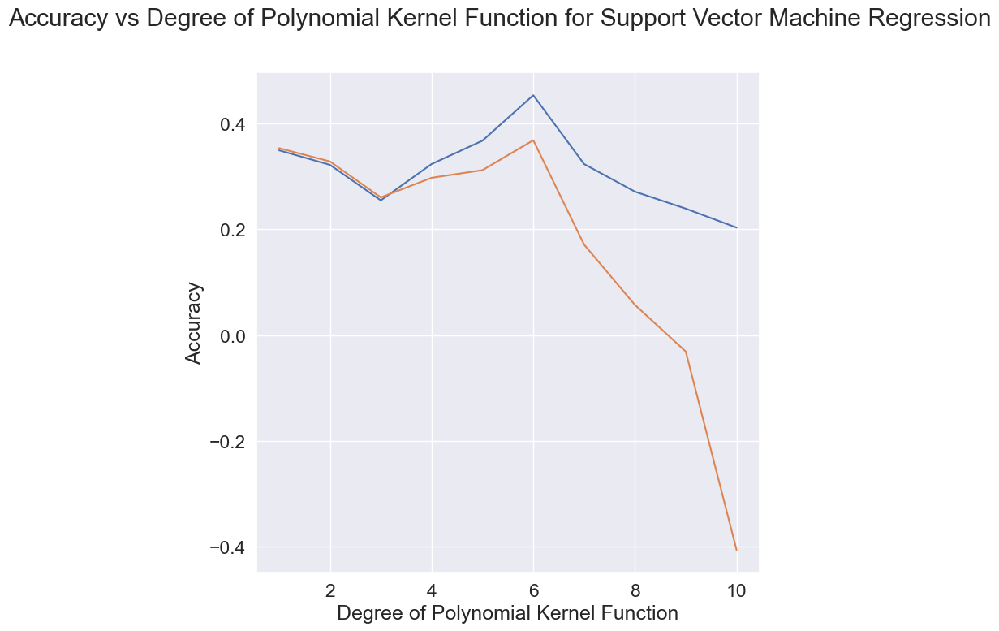

In [131]:
f, axes = plt.subplots(1,1, figsize = (8,8))
plt.plot(svr_score['Degree'], svr_score['Train'])
plt.plot(svr_score['Degree'], svr_score['Test'])
axes.set_xlabel('Degree of Polynomial Kernel Function')
axes.set_ylabel('Accuracy')
f.suptitle('Accuracy vs Degree of Polynomial Kernel Function for Support Vector Machine Regression')
plt.show()

###### Radial Basis Function (RBF) Kernel:

In [132]:
svr_rbf = SVR(kernel = 'rbf')
svr_rbf.fit(X_train, y_train)

print(svr_rbf.score(X_train, y_train))
print(svr_rbf.score(X_test, y_test))

0.32305145374532085
0.31254221163369955


C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [133]:
svr_linear = SVR(kernel = 'linear')
svr_linear.fit(X_train, y_train)

print(svr_linear.score(X_train, y_train))
print(svr_linear.score(X_test, y_test))

C:\Users\alexa\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.37605485866026445
0.376123769184039


Based on the Regression results, the models are most successful in predicting the Masses of Exoplanets. This offers a unique opportunity to apply the principles of this project to real data, because planet masses are much more difficult to experimentally measure, as compared to planet radii. This project, therefore, offers a novel and more context-aware way of estimating the planet mass. More on this has been explained in the Project Report. 